<a href="https://colab.research.google.com/github/gabrie1-s/Chagas_analysis/blob/lstm/LSTM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Version: LSTM_2.0.2

## Download files

In [48]:
%%capture
!pip install neptune-notebooks

In [49]:
%%capture
!jupyter nbextension enable --py neptune-notebooks

In [50]:
%%capture
!pip install neptune-client

In [51]:
%%capture
!pip install mat73
!pip install Bayesian-Optimization
!pip install h5py

In [52]:
import keras
import pdb
import gc
import requests

In [53]:
from google.colab import drive
import mat73
import h5py
import scipy.io as sio
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math
import random
from sklearn.model_selection import train_test_split, cross_val_score
import statistics as st

In [54]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [55]:
%cd /content/drive/MyDrive/CNN_Chagas/Chagas/LSTM

/content/drive/MyDrive/CNN_Chagas/Chagas/LSTM


In [56]:
import neptune.new as neptune

In [57]:
run = neptune.init_run(
    project="gabrie1-s/NACA-data-extraction",
    with_id="NAC-25",
    api_token="eyJhcGlfYWRkcmVzcyI6Imh0dHBzOi8vYXBwLm5lcHR1bmUuYWkiLCJhcGlfdXJsIjoiaHR0cHM6Ly9hcHAubmVwdHVuZS5haSIsImFwaV9rZXkiOiI1ODlmNWY4ZS0zNmUzLTQ3NWQtYmVkYy05ZmUyMDM4ZGQxMzkifQ==",
    mode="read-only")

https://app.neptune.ai/gabrie1-s/NACA-data-extraction/e/NAC-25


In [58]:
%cd -

/content


In [59]:
run["data"].download()

In [60]:
!unzip data.zip

Archive:  data.zip
mapname:  conversion of  failed
replace dataset/x_te.npy? [y]es, [n]o, [A]ll, [N]one, [r]ename: a
error:  invalid response [a]
replace dataset/x_te.npy? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: dataset/x_te.npy        
  inflating: dataset/x_tr.npy        
  inflating: dataset/x_va.npy        
  inflating: dataset/y_te.npy        
  inflating: dataset/y_tr.npy        
  inflating: dataset/y_va.npy        


In [61]:
!rm data.zip

In [62]:
run.stop()

Shutting down background jobs, please wait a moment...
Done!
Explore the metadata in the Neptune app:
https://app.neptune.ai/gabrie1-s/NACA-data-extraction/e/NAC-25/metadata


## Preprocessing and analisys

In [96]:
%cd /content/drive/MyDrive/CNN_Chagas/Chagas/LSTM

/content/drive/MyDrive/CNN_Chagas/Chagas/LSTM


In [102]:
run = neptune.init_run(
    project="gabrie1-s/NACA-data-extraction",
    api_token="eyJhcGlfYWRkcmVzcyI6Imh0dHBzOi8vYXBwLm5lcHR1bmUuYWkiLCJhcGlfdXJsIjoiaHR0cHM6Ly9hcHAubmVwdHVuZS5haSIsImFwaV9rZXkiOiI1ODlmNWY4ZS0zNmUzLTQ3NWQtYmVkYy05ZmUyMDM4ZGQxMzkifQ==",
    description='''Usando os dados da execução NACA-17, vamos criar um modelo
    de LSTM que recebe sinais constituídos por 3 batimentos. Esse modelo será
    otimizado pela Otimização Bayesiana''',
    source_files=["LSTM.ipynb"],
)  # your credentials

run["code_version"] = "LSTM_2.0.2"

https://app.neptune.ai/gabrie1-s/NACA-data-extraction/e/NAC-26


In [103]:
%cd -

/content


In [66]:
x_tr = np.load("dataset/x_tr.npy", allow_pickle=True)
x_va = np.load("dataset/x_te.npy", allow_pickle=True)
x_te = np.load("dataset/x_va.npy", allow_pickle=True)

# sr_tr = np.load("dataset/sr_tr.npy", allow_pickle=True)
# sr_te = np.load("dataset/sr_te.npy", allow_pickle=True)
# sr_va = np.load("dataset/sr_va.npy", allow_pickle=True)

y_tr = np.load("dataset/y_tr.npy", allow_pickle=True)
y_va = np.load("dataset/y_te.npy", allow_pickle=True)
y_te = np.load("dataset/y_va.npy", allow_pickle=True)

In [67]:
def sort(x, y, type_, order):
  if type_ == 'len':
    arr_idxs = np.argsort([len(i) for i in x_tr])
    if order == 'cres':
      x = x[arr_idxs[::]]
      y = y[arr_idxs[::]]
    elif order == 'dec':
      x = x[arr_idxs[::-1]]
      y = y[arr_idxs[::-1]]

  elif type_ == 'noise':
    arr_idxs = s.argsort()
    if order == 'cres':
      x = x[arr_idxs[::]]
      y = y[arr_idxs[::]]
    if order == 'dec':
      x = x[arr_idxs[::-1]]
      y = y[arr_idxs[::-1]]

  return x, y

### Length analisys (after noise removal)

Shortest

In [68]:
x, y = sort(x_tr, y_tr, type_='len', order='cres')

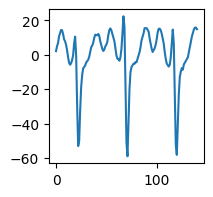

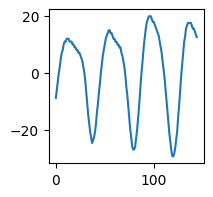

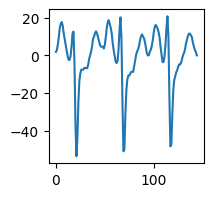

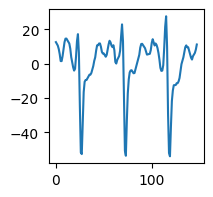

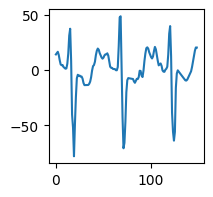

...

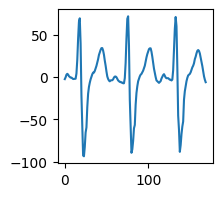

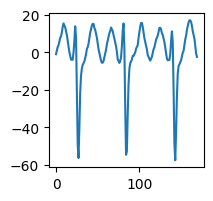

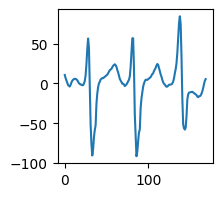

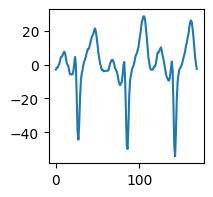

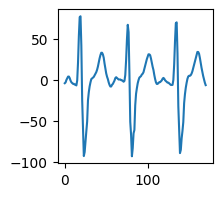

In [69]:
for idx, i in enumerate(x):
  if idx < 100:
    # print(s[idx])
    plt.plot(i)
    plt.show()

Largest

In [70]:
x, y = sort(x_tr, y_tr, type_='len', order='dec')

1150


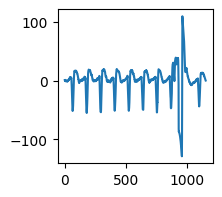

773


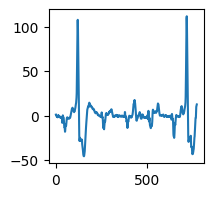

693


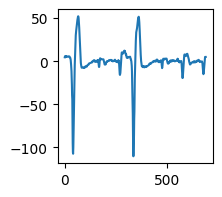

661


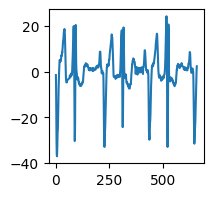

642


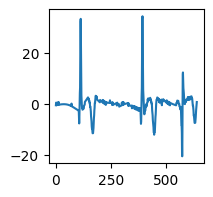

593


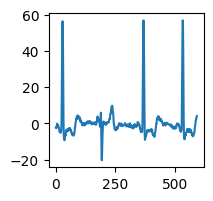

592


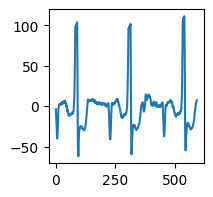

584


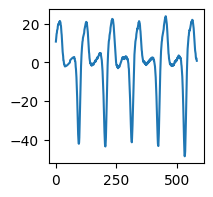

555


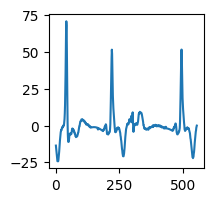

555


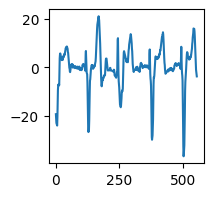

550


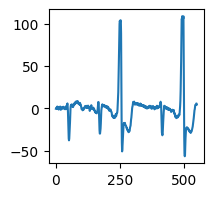

545


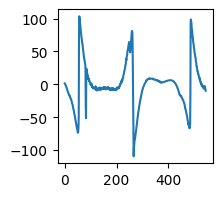

541


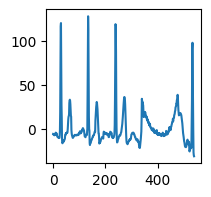

536


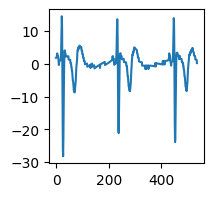

535


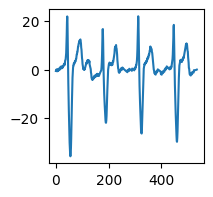

530


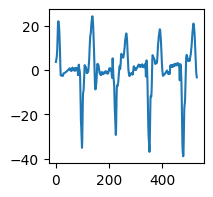

527


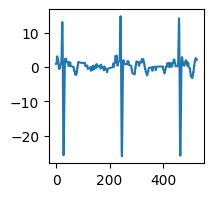

527


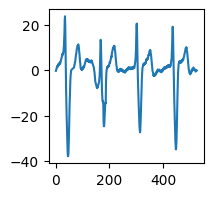

524


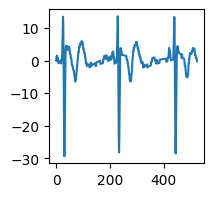

521


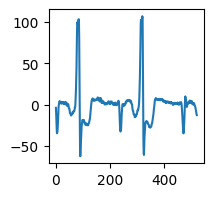

519


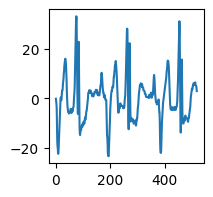

516


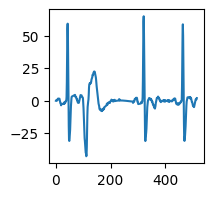

514


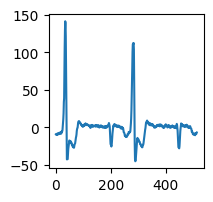

514


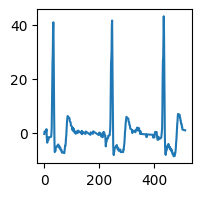

511


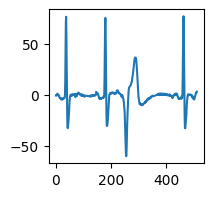

508


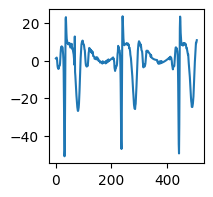

502


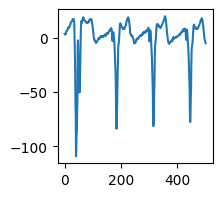

497


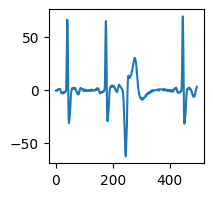

488


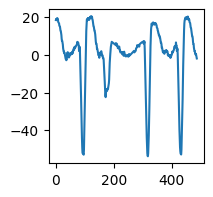

486


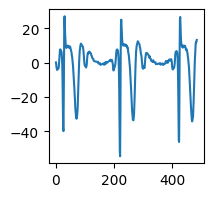

484


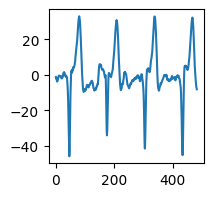

483


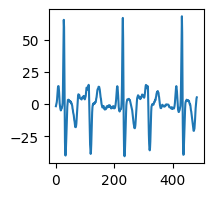

483


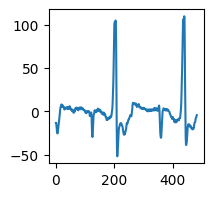

481


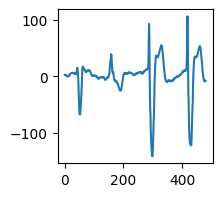

481


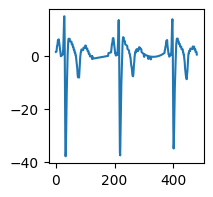

481


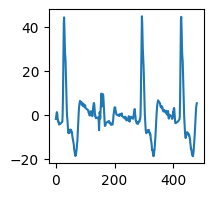

479


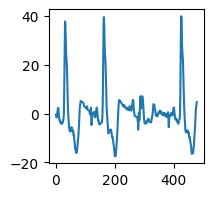

478


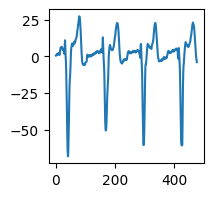

477


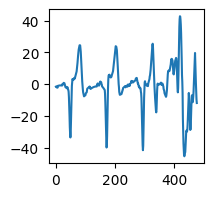

477


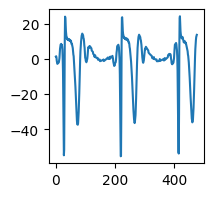

476


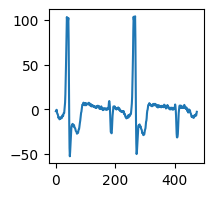

474


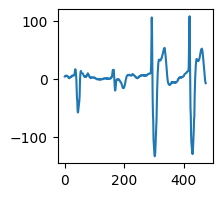

472


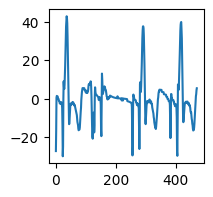

470


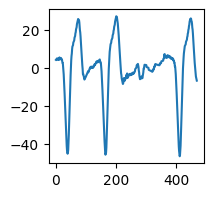

467


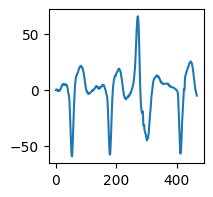

466


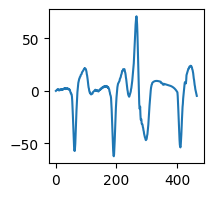

464


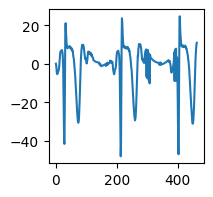

464


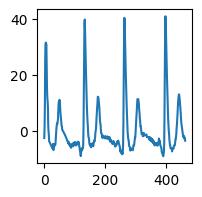

464


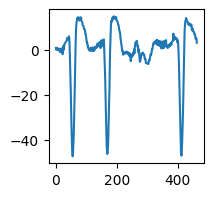

463


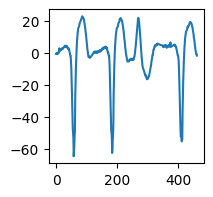

463


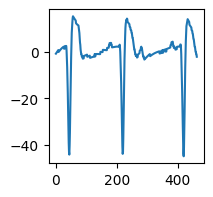

463


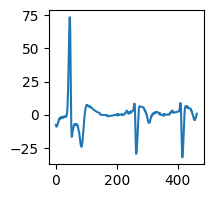

462


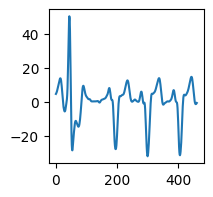

461


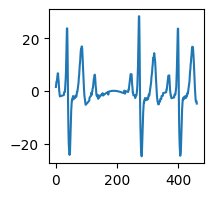

458


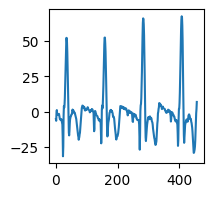

458


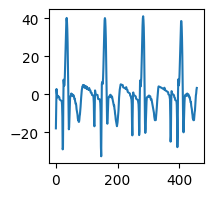

458


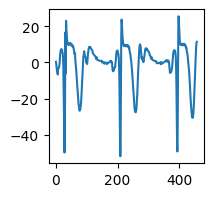

458


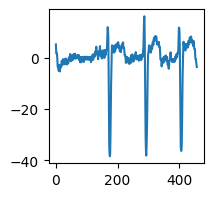

457


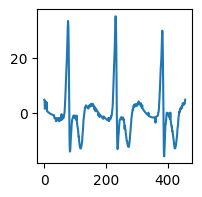

456


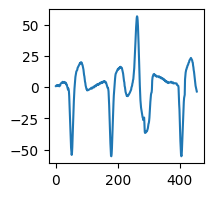

456


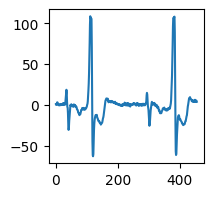

454


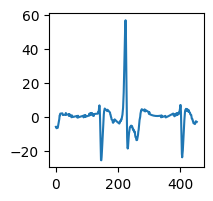

454


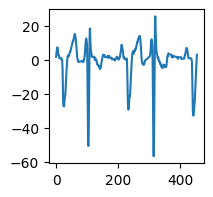

453


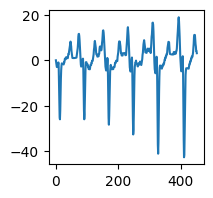

452


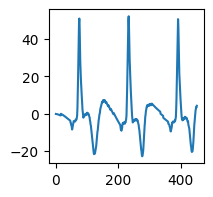

452


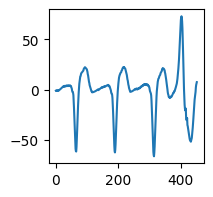

451


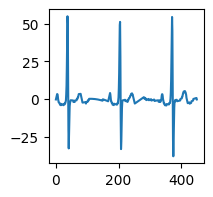

451


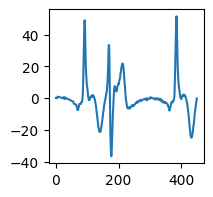

449


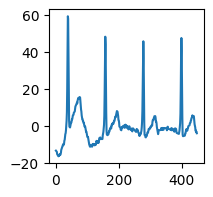

449


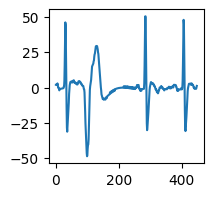

449


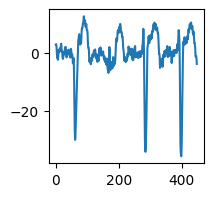

448


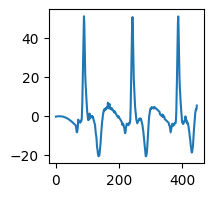

445


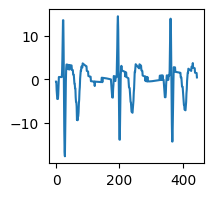

444


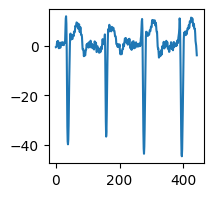

443


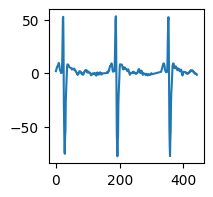

441


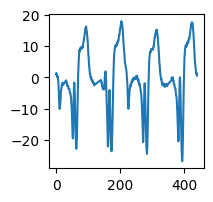

440


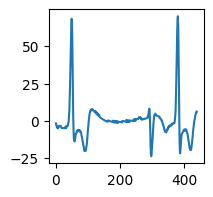

440


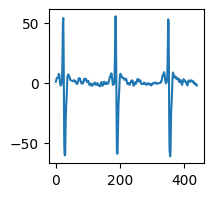

439


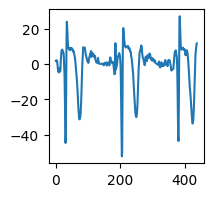

437


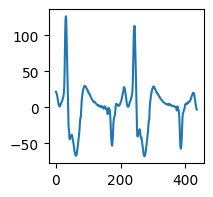

436


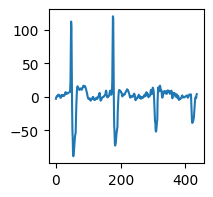

435


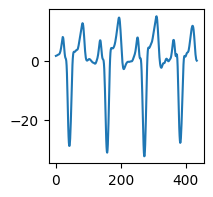

435


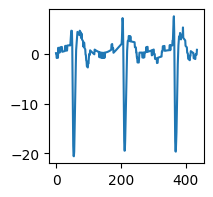

435


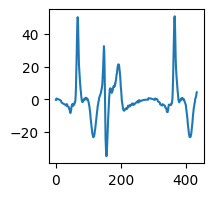

434


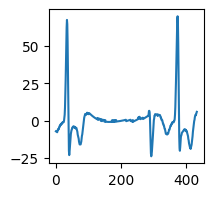

434


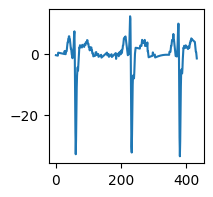

433


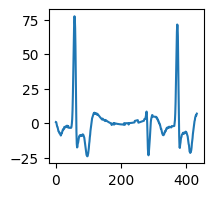

433


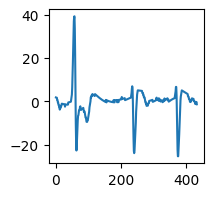

432


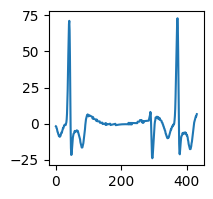

432


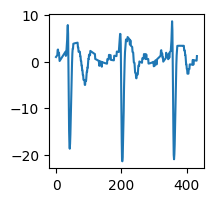

431


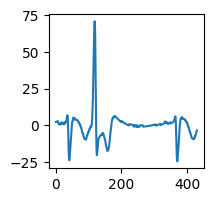

431


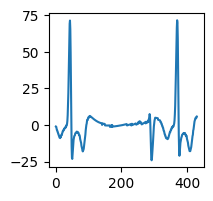

431


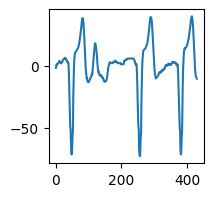

431


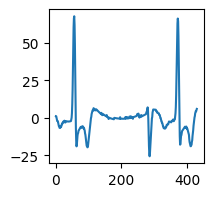

430


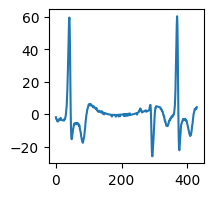

430


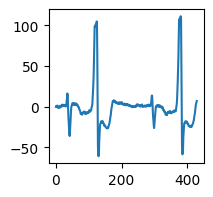

430


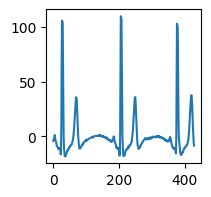

430


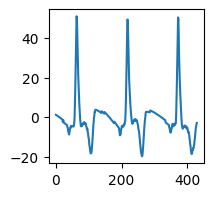

429


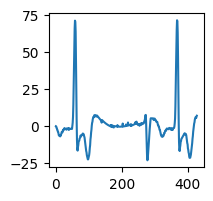

429


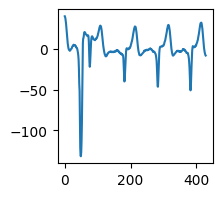

In [71]:
for idx, i in enumerate(x):
  if idx < 100:
    print(len(i))
    plt.plot(i)
    plt.show()

## Outliers filter

In [72]:
def remove_lim(signals, ys, lim):
  new_s = []
  new_y = []

  for idx, s in enumerate(signals):
    if len(s) < 600:
      new_s.append(s)
      new_y.append(ys[idx])

  return np.array(new_s), np.array(new_y)

In [73]:
x_tr, y_tr = remove_lim(x_tr, y_tr, 600)
x_va, y_va = remove_lim(x_va, y_va, 600)
x_te, y_te = remove_lim(x_te, y_te, 600)

<ipython-input-72-8eff2c7137dc>:10: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array(new_s), np.array(new_y)


<ipython-input-74-e99017abb615>:2: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fig.tight_layout(pad=5.0)


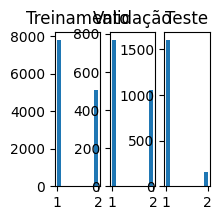

In [74]:
fig, axs = plt.subplots(1, 3)
fig.tight_layout(pad=5.0)

axs[0].hist(y_tr)
axs[0].title.set_text('Treinamento')

axs[1].hist(y_va)
axs[1].title.set_text('Validação')

axs[2].hist(y_te)
axs[2].title.set_text('Teste')

In [75]:
lsup = len(max(np.concatenate((x_tr, x_va, x_te)), key = len))

In [76]:
linf = len(min(np.concatenate((x_tr, x_va, x_te)), key = len))

In [77]:
def norm_len_2(s, lim):

    for i, sig in enumerate(s):
        n = math.floor(lim) - len(sig)
        zeros = np.zeros(int(n))
        s[i] = np.concatenate((sig, zeros), axis=None)

    return s

In [78]:
x_va = norm_len_2(x_va, lsup)
x_tr = norm_len_2(x_tr, lsup)
x_te = norm_len_2(x_te, lsup)

In [79]:
del cross_val_score, sio, mat73, i, norm_len_2, requests, train_test_split
gc.collect()

170421

In [80]:
y_va = [int(i-1) for i in y_va]
y_tr = [int(i-1) for i in y_tr]
y_te = [int(i-1) for i in y_te]

In [81]:
y_va = np.array(y_va)
y_tr = np.array(y_tr)
y_te = np.array(y_te)

In [82]:
x_tr = np.array(list(x_tr))
x_va = np.array(list(x_va))
x_te = np.array(list(x_te))

In [83]:
x_va.shape

(1277, 593)

In [84]:
inp_shape = (x_tr.shape[1], 1)

In [85]:
from keras.models import Sequential, load_model
from keras.layers import Dense, Flatten, LSTM, Dropout

from bayes_opt import BayesianOptimization
from bayes_opt.util import UtilityFunction, load_logs
from bayes_opt.logger import JSONLogger
from bayes_opt.event import Events

from tensorflow.keras.optimizers import Adam, Adadelta,Adamax

from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from math import floor
from sklearn.metrics import accuracy_score, f1_score, balanced_accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn import metrics

import tensorflow as tf
import os

In [86]:
def network(lstm_layers, dense_layers, units, neurons_ini, optimizer, learning_rate, dropout):

    # Define custom initializers for kernel and bias
    '''kernel_init = Constant(value=0.1)
    matrix = np.full((units, 4*units), 0.1)
    matrix = gram_schmidt(matrix)
    matrix = Constant(value=matrix)'''


    classificador_1 = Sequential()

    for i in range(lstm_layers):
        if i == 0:
            classificador_1.add(LSTM(units=units, return_sequences = True,  activation='tanh',
                                     recurrent_activation='sigmoid', recurrent_dropout=0 ,
                                     input_shape=inp_shape))
        else:
            classificador_1.add(LSTM(units=units, return_sequences = True,  activation='tanh',
                                     recurrent_activation='sigmoid', recurrent_dropout=0))

    classificador_1.add(Flatten())

    for i in range(dense_layers):
        classificador_1.add(Dense(neurons_ini, activation='relu'))
        classificador_1.add(Dropout(dropout))
        neurons_ini = neurons_ini/2

    classificador_1.add(Dense(1, activation='sigmoid'))

    classificador_1.compile(loss='binary_crossentropy', optimizer=optimizer(learning_rate=learning_rate),weighted_metrics=['accuracy'])

    return classificador_1

In [87]:
melhor = 0

In [88]:
import re

def extract_index(name):
    # Extract the index from the dataset name
    match = re.search(r"\d+$", name)
    if match:
        return int(match.group())
    else:
        return None

In [89]:
def evaluate_network(lstm_layers, dense_layers, units, neurons_ini, optimizer, batch_size, learning_rate, dropout):

    lstm_layers = round(lstm_layers)
    dense_layers = round(dense_layers)
    units = 20*round(units)
    neurons_ini = 2**round(neurons_ini)
    optimizer = round(optimizer)
    learning_rate = round(learning_rate)
    batch_size = 2**round(batch_size)

    optimizer_array = [Adam, Adadelta, Adamax]
    optimizer_val = optimizer_array[optimizer]

    learn_array = [0.001, 0.01, 0.1]
    learn_val = learn_array[learning_rate]

    model = network(lstm_layers, dense_layers, units, neurons_ini, optimizer_val, learn_val, dropout)

    es = EarlyStopping(monitor="val_accuracy", mode='max', verbose=0, patience=15)

    checkpoint = ModelCheckpoint('_pesos_lstm1.h5', monitor="val_accuracy", verbose=0,
                                      save_best_only=True, mode='max')

    history_1 = model.fit(x_tr, y_tr, validation_data = (x_va, y_va),
                          epochs=150, batch_size = batch_size, callbacks=[checkpoint, es],
                          class_weight = {0 : np.count_nonzero(y_tr == 0)/len(y_tr), 1: np.count_nonzero(y_tr == 1)/len(y_tr)},
                          verbose=0, use_multiprocessing=True, workers=8)

    model = load_model('_pesos_lstm1.h5')

    os.remove("_pesos_lstm1.h5")

    #plot history
    plt.rcParams['figure.figsize']=(20,5)
    plt.rcParams.update({'font.size': 20})

    plt.plot(history_1.history['accuracy'])
    plt.plot(history_1.history['val_accuracy'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'va'], loc='upper left')
    plt.savefig("history.png")
    plt.show()

    #predict
    y_pred = model.predict(x_te)
    y_pred = (np.asarray(y_pred)).round()
    y_pred = y_pred.astype(int)
    y_tes = y_te

    for i in y_pred:
      if math.isnan(i):
        pdb.set_trace()

    #plot confusion matrix
    plt.rcParams['figure.figsize']=(2,2)
    plt.rcParams.update({'font.size': 10})


    cf_matrix = confusion_matrix(y_tes, y_pred)
    cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = cf_matrix, display_labels = ['1','2'])
    cm_display.plot()
    plt.show()

    #display report
    relatorio = classification_report(y_tes, y_pred, target_names = ['1','2'])
    print(relatorio)

    #calculating score
    y_pred = model.predict(x_va)
    y_pred = (np.asarray(y_pred)).round()
    y_pred = y_pred.astype(int)
    y_val = np.array(y_va)

    # score = accuracy_score(y_val, y_pred) * f1_score(y_val, y_pred, average='weighted')
    score = math.sqrt(balanced_accuracy_score(y_val, y_pred) * f1_score(y_val, y_pred, average='weighted'))

    gc.collect()
    return score

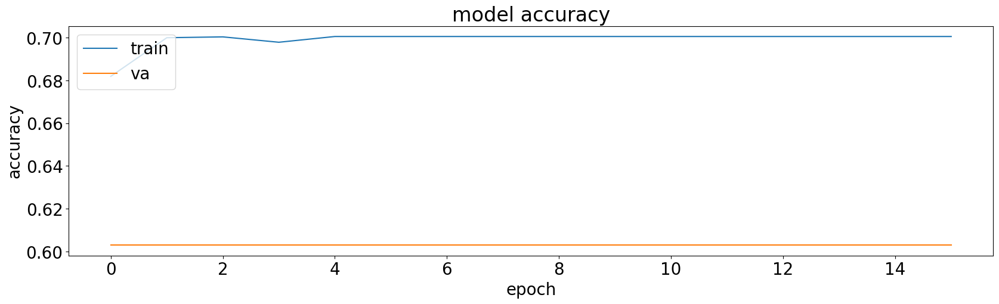

56/56 [==============================] - 1s 10ms/step


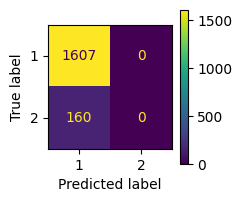

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

13/40 [========>.....................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 0s 10ms/step


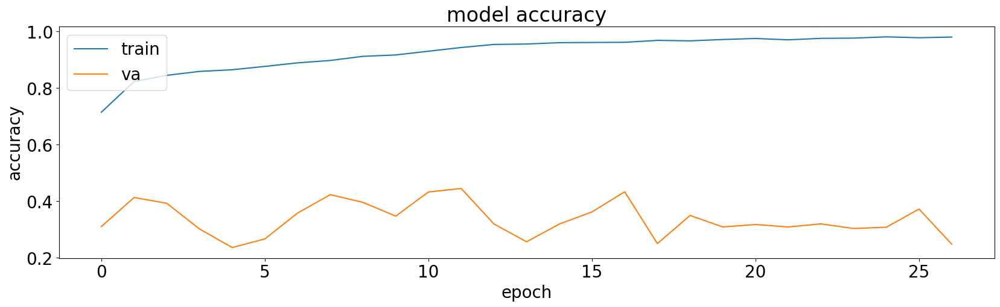

56/56 [==============================] - 1s 8ms/step


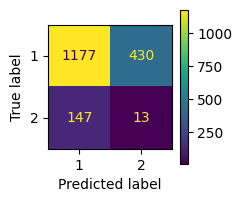

              precision    recall  f1-score   support

           1       0.89      0.73      0.80      1607
           2       0.03      0.08      0.04       160

    accuracy                           0.67      1767
   macro avg       0.46      0.41      0.42      1767
weighted avg       0.81      0.67      0.73      1767

40/40 [==============================] - 0s 8ms/step


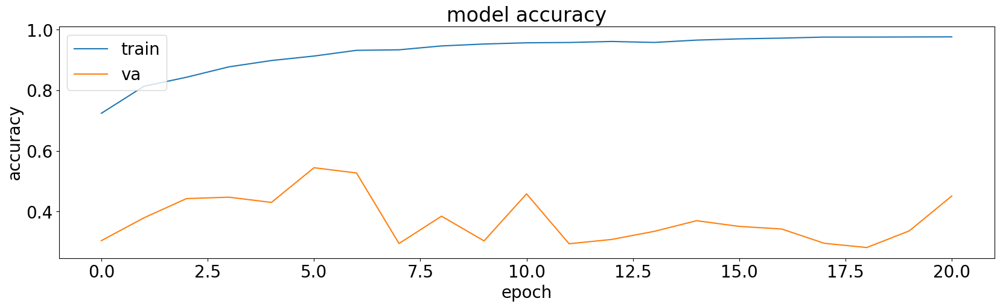

56/56 [==============================] - 1s 14ms/step


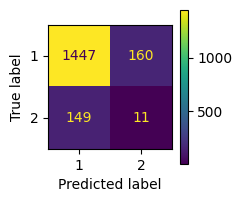

              precision    recall  f1-score   support

           1       0.91      0.90      0.90      1607
           2       0.06      0.07      0.07       160

    accuracy                           0.83      1767
   macro avg       0.49      0.48      0.48      1767
weighted avg       0.83      0.83      0.83      1767

40/40 [==============================] - 1s 14ms/step


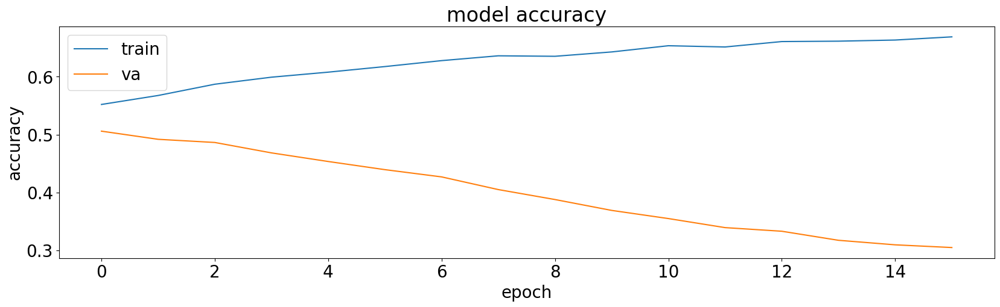

56/56 [==============================] - 1s 7ms/step


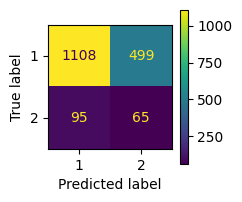

              precision    recall  f1-score   support

           1       0.92      0.69      0.79      1607
           2       0.12      0.41      0.18       160

    accuracy                           0.66      1767
   macro avg       0.52      0.55      0.48      1767
weighted avg       0.85      0.66      0.73      1767

40/40 [==============================] - 0s 7ms/step


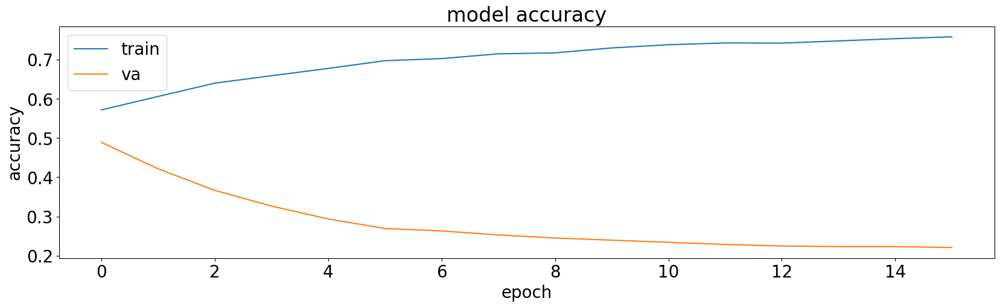

56/56 [==============================] - 2s 17ms/step


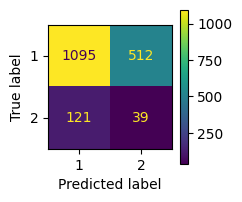

              precision    recall  f1-score   support

           1       0.90      0.68      0.78      1607
           2       0.07      0.24      0.11       160

    accuracy                           0.64      1767
   macro avg       0.49      0.46      0.44      1767
weighted avg       0.83      0.64      0.72      1767

40/40 [==============================] - 1s 14ms/step


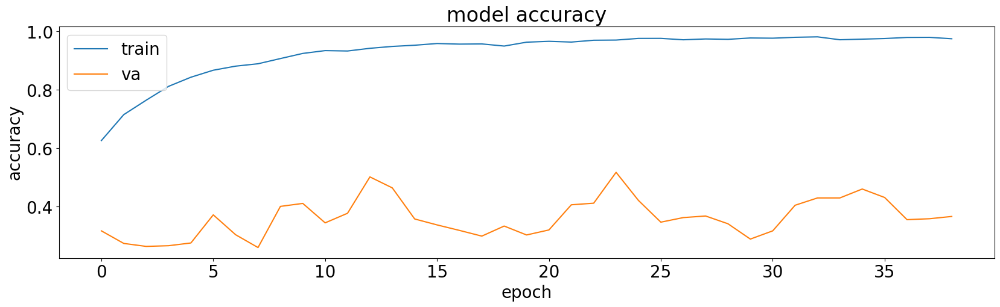

56/56 [==============================] - 1s 8ms/step


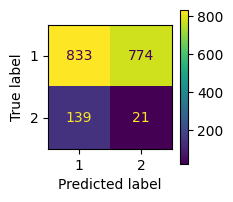

              precision    recall  f1-score   support

           1       0.86      0.52      0.65      1607
           2       0.03      0.13      0.04       160

    accuracy                           0.48      1767
   macro avg       0.44      0.32      0.34      1767
weighted avg       0.78      0.48      0.59      1767

40/40 [==============================] - 0s 8ms/step


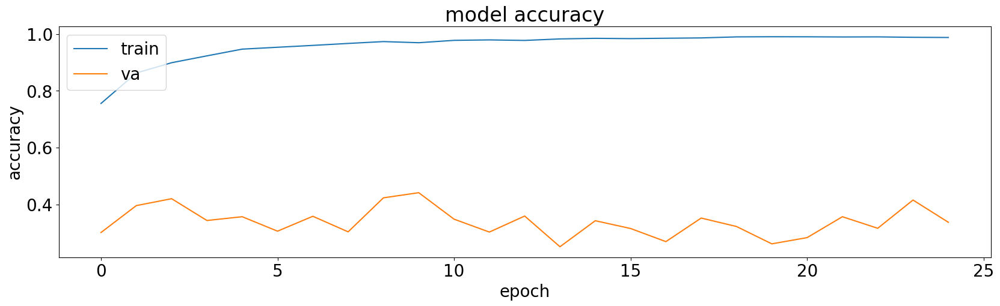

56/56 [==============================] - 2s 19ms/step


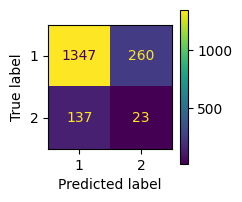

              precision    recall  f1-score   support

           1       0.91      0.84      0.87      1607
           2       0.08      0.14      0.10       160

    accuracy                           0.78      1767
   macro avg       0.49      0.49      0.49      1767
weighted avg       0.83      0.78      0.80      1767

40/40 [==============================] - 1s 16ms/step


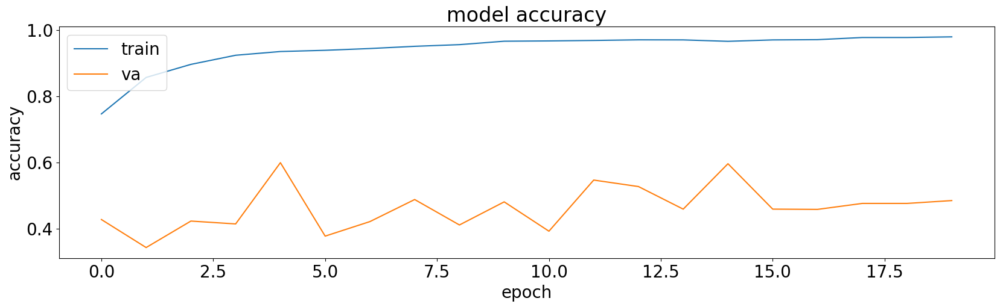

56/56 [==============================] - 1s 8ms/step


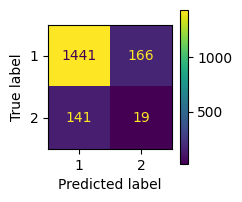

              precision    recall  f1-score   support

           1       0.91      0.90      0.90      1607
           2       0.10      0.12      0.11       160

    accuracy                           0.83      1767
   macro avg       0.51      0.51      0.51      1767
weighted avg       0.84      0.83      0.83      1767

40/40 [==============================] - 0s 8ms/step


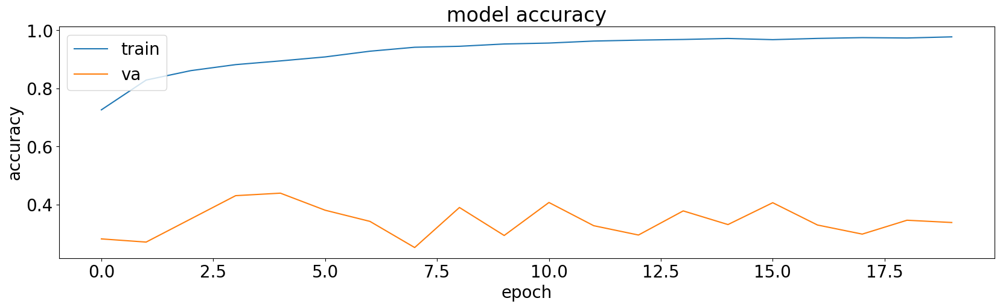

56/56 [==============================] - 1s 8ms/step


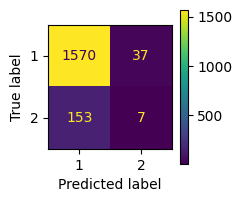

              precision    recall  f1-score   support

           1       0.91      0.98      0.94      1607
           2       0.16      0.04      0.07       160

    accuracy                           0.89      1767
   macro avg       0.54      0.51      0.51      1767
weighted avg       0.84      0.89      0.86      1767

40/40 [==============================] - 0s 8ms/step


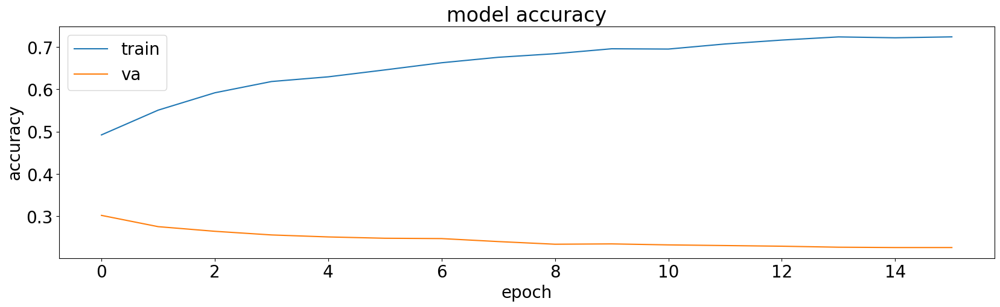

56/56 [==============================] - 1s 8ms/step


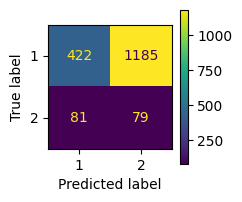

              precision    recall  f1-score   support

           1       0.84      0.26      0.40      1607
           2       0.06      0.49      0.11       160

    accuracy                           0.28      1767
   macro avg       0.45      0.38      0.26      1767
weighted avg       0.77      0.28      0.37      1767

40/40 [==============================] - 0s 8ms/step


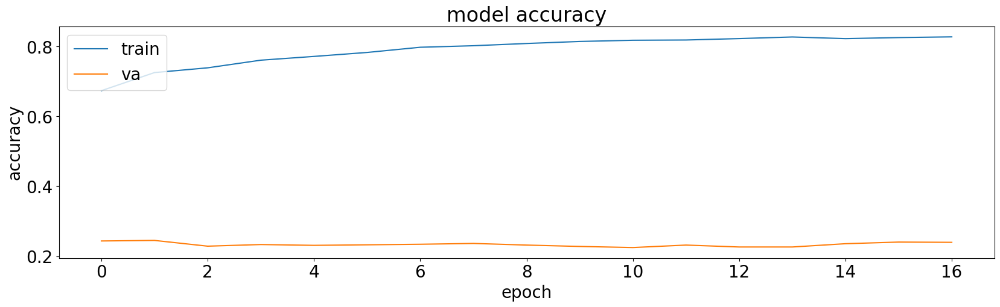

56/56 [==============================] - 3s 31ms/step


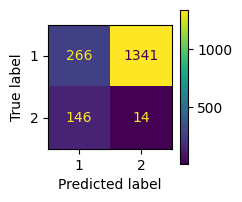

              precision    recall  f1-score   support

           1       0.65      0.17      0.26      1607
           2       0.01      0.09      0.02       160

    accuracy                           0.16      1767
   macro avg       0.33      0.13      0.14      1767
weighted avg       0.59      0.16      0.24      1767

40/40 [==============================] - 1s 29ms/step


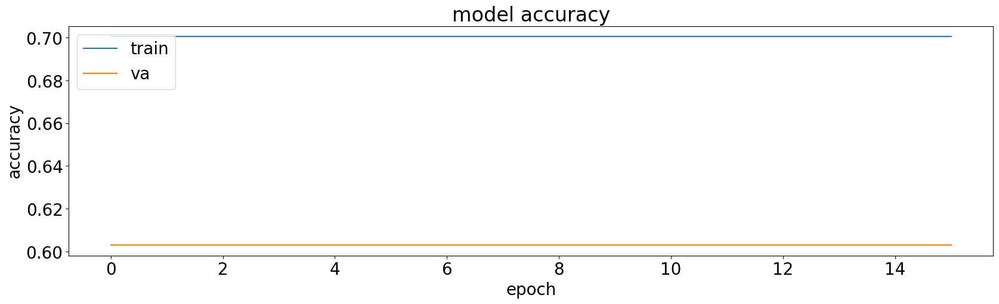

56/56 [==============================] - 1s 16ms/step


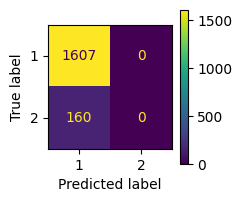

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 9/40 [=====>........................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 16ms/step


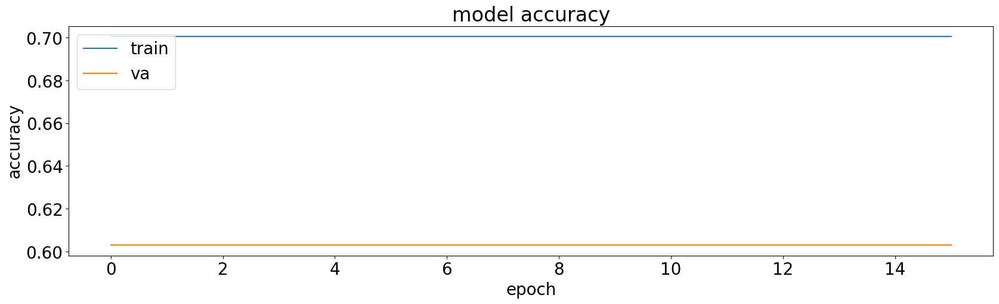

56/56 [==============================] - 1s 14ms/step


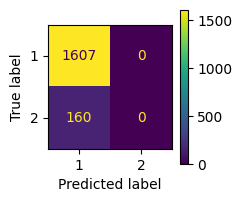

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 9/40 [=====>........................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 14ms/step


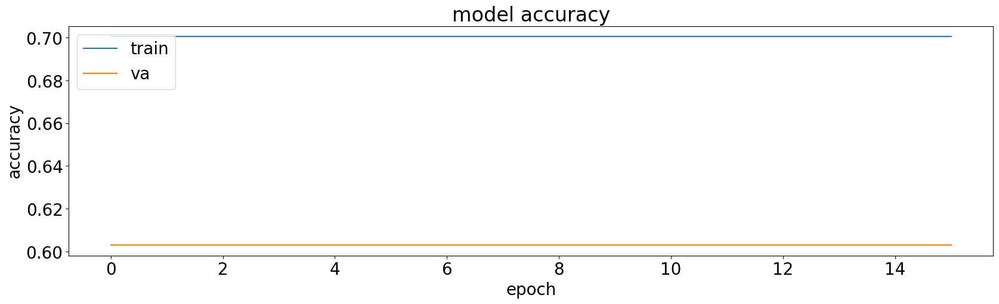

56/56 [==============================] - 1s 14ms/step


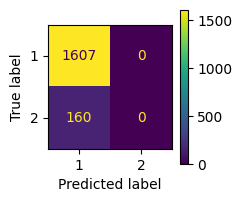

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 9/40 [=====>........................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 14ms/step


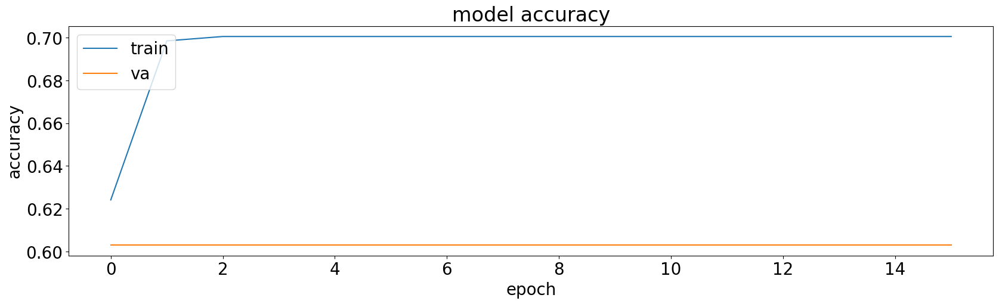

56/56 [==============================] - 3s 35ms/step


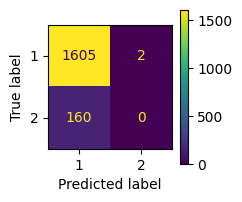

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

40/40 [==============================] - 1s 33ms/step


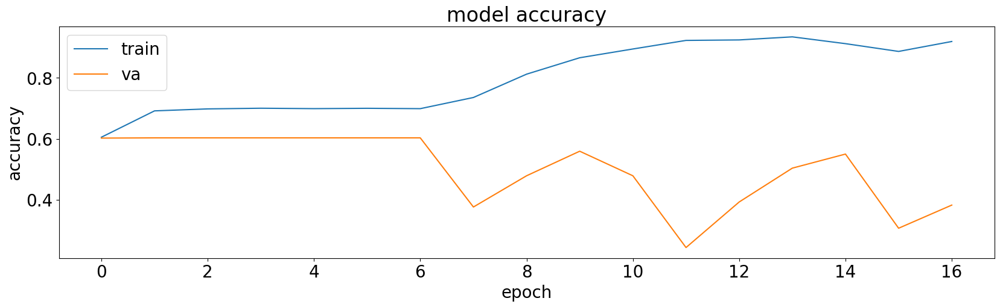

56/56 [==============================] - 3s 34ms/step


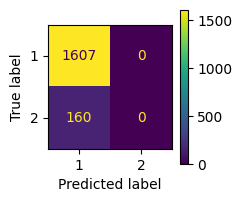

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 3/40 [=>............................] - ETA: 1s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 33ms/step


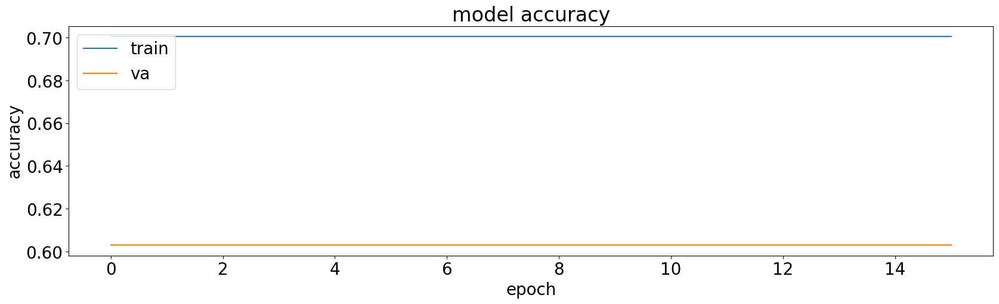

56/56 [==============================] - 1s 14ms/step


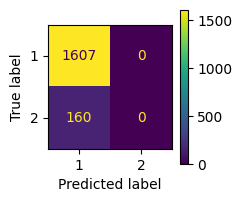

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 9/40 [=====>........................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 14ms/step


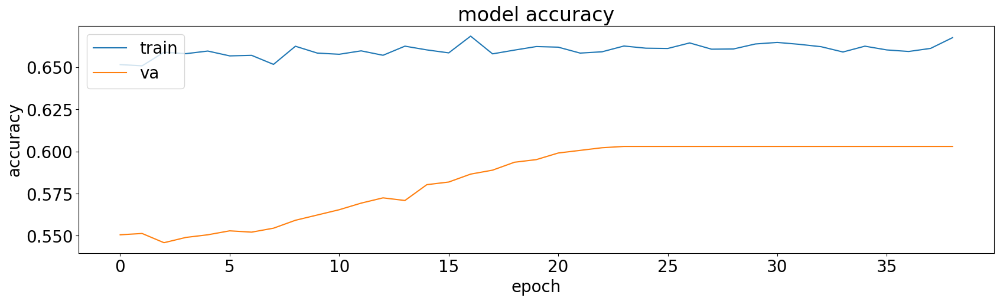

56/56 [==============================] - 3s 31ms/step


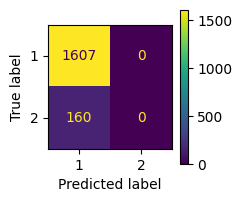

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 5/40 [==>...........................] - ETA: 1s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 29ms/step


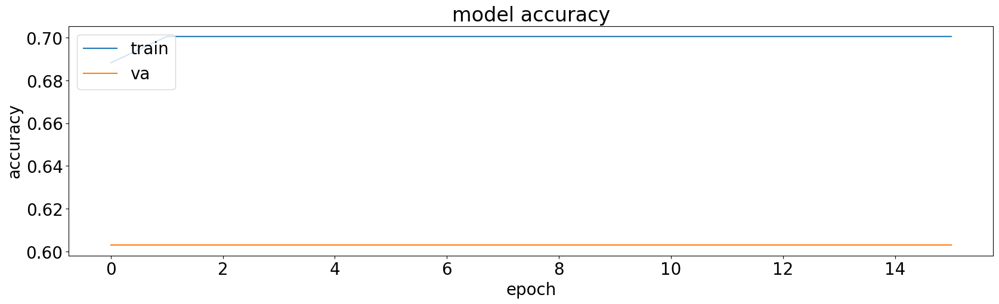

56/56 [==============================] - 2s 21ms/step


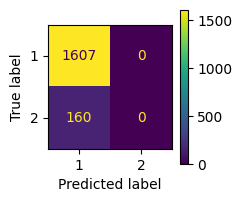

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 7/40 [====>.........................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 21ms/step


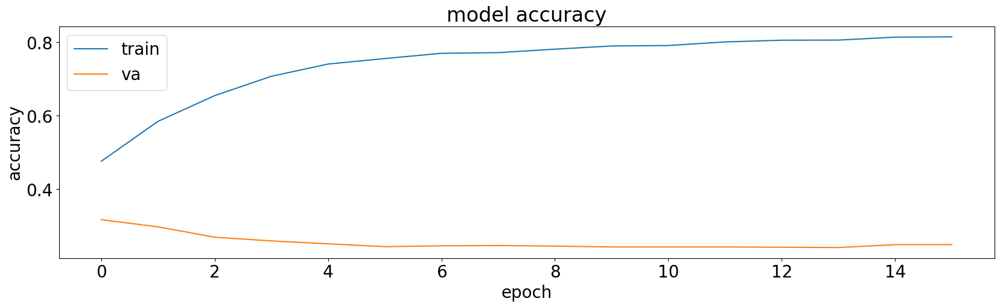

56/56 [==============================] - 2s 22ms/step


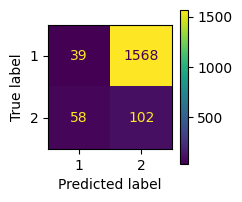

              precision    recall  f1-score   support

           1       0.40      0.02      0.05      1607
           2       0.06      0.64      0.11       160

    accuracy                           0.08      1767
   macro avg       0.23      0.33      0.08      1767
weighted avg       0.37      0.08      0.05      1767

40/40 [==============================] - 1s 22ms/step


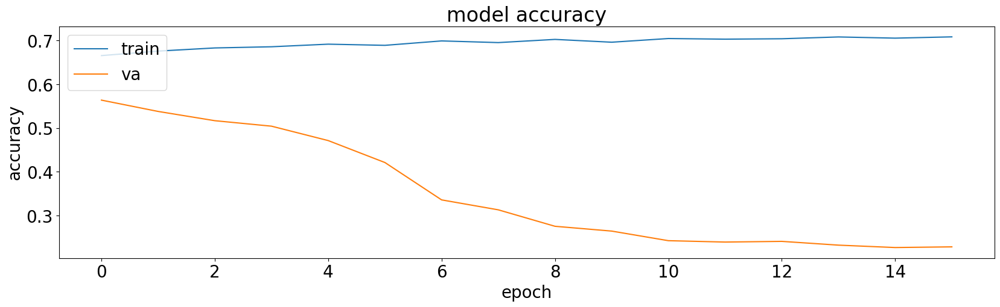

56/56 [==============================] - 1s 14ms/step


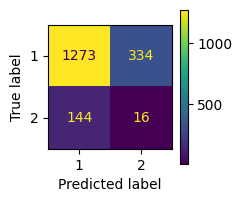

              precision    recall  f1-score   support

           1       0.90      0.79      0.84      1607
           2       0.05      0.10      0.06       160

    accuracy                           0.73      1767
   macro avg       0.47      0.45      0.45      1767
weighted avg       0.82      0.73      0.77      1767

40/40 [==============================] - 1s 14ms/step


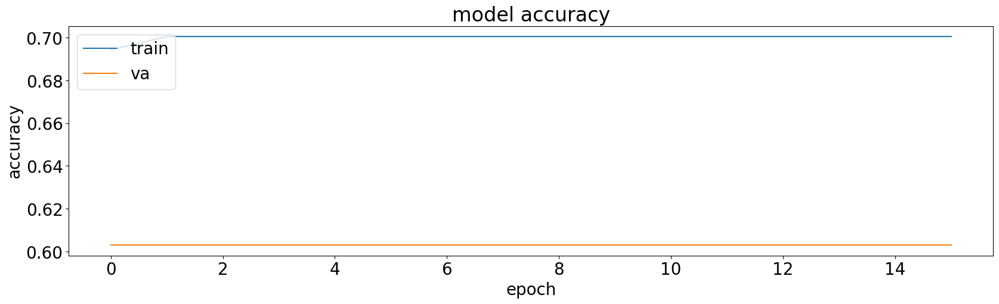

56/56 [==============================] - 3s 33ms/step


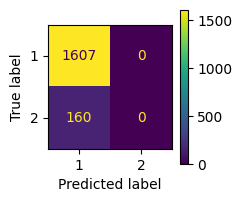

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 5/40 [==>...........................] - ETA: 1s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 30ms/step


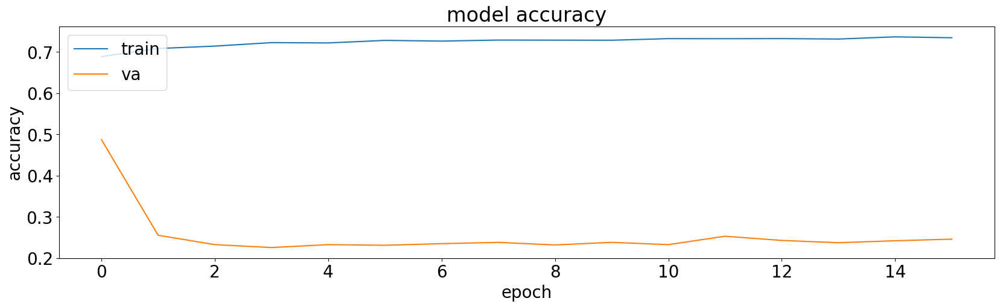

56/56 [==============================] - 1s 14ms/step


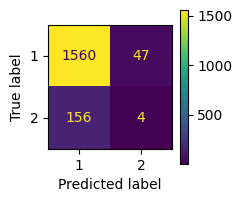

              precision    recall  f1-score   support

           1       0.91      0.97      0.94      1607
           2       0.08      0.03      0.04       160

    accuracy                           0.89      1767
   macro avg       0.49      0.50      0.49      1767
weighted avg       0.83      0.89      0.86      1767

40/40 [==============================] - 1s 14ms/step


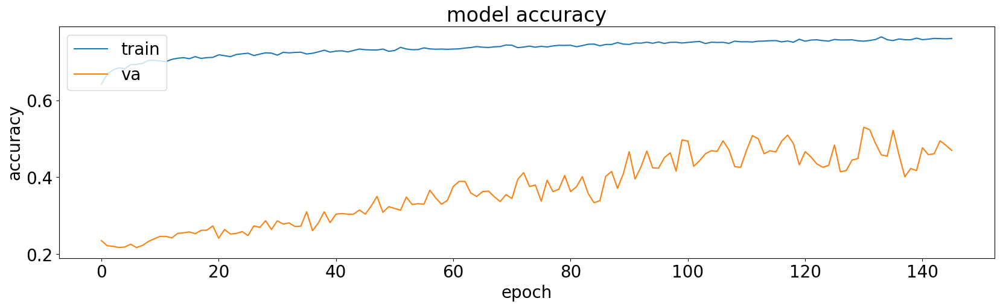

56/56 [==============================] - 3s 32ms/step


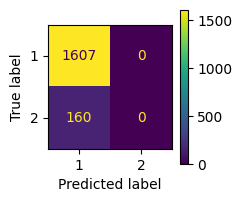

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 5/40 [==>...........................] - ETA: 1s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 30ms/step


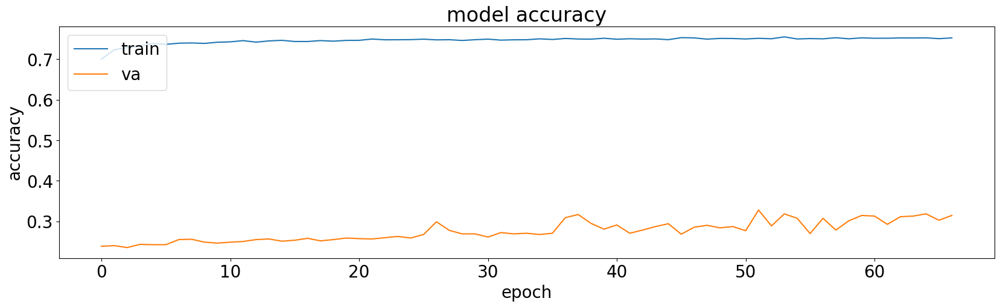

56/56 [==============================] - 1s 14ms/step


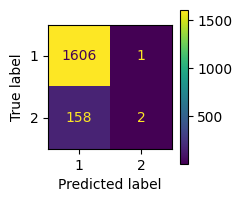

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.67      0.01      0.02       160

    accuracy                           0.91      1767
   macro avg       0.79      0.51      0.49      1767
weighted avg       0.89      0.91      0.87      1767

40/40 [==============================] - 1s 14ms/step


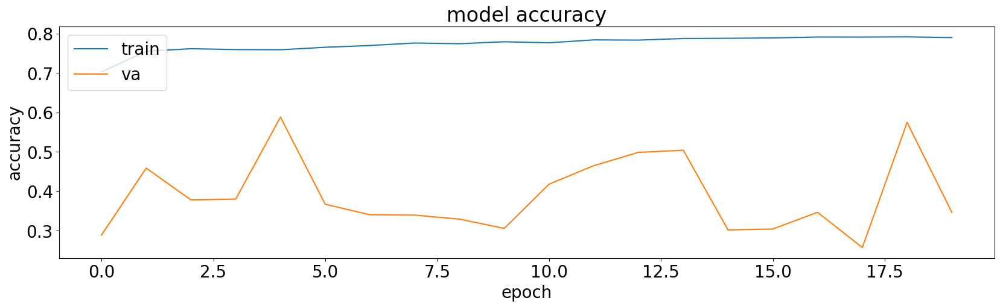

56/56 [==============================] - 4s 45ms/step


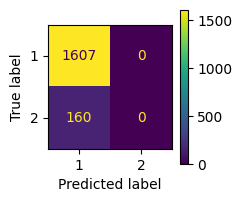

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 3/40 [=>............................] - ETA: 1s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 2s 43ms/step


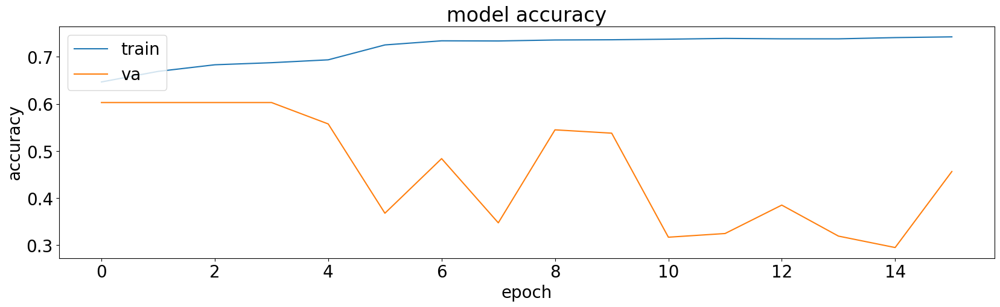

56/56 [==============================] - 4s 46ms/step


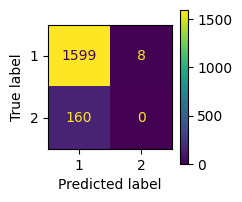

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.90      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.90      0.86      1767

40/40 [==============================] - 2s 45ms/step


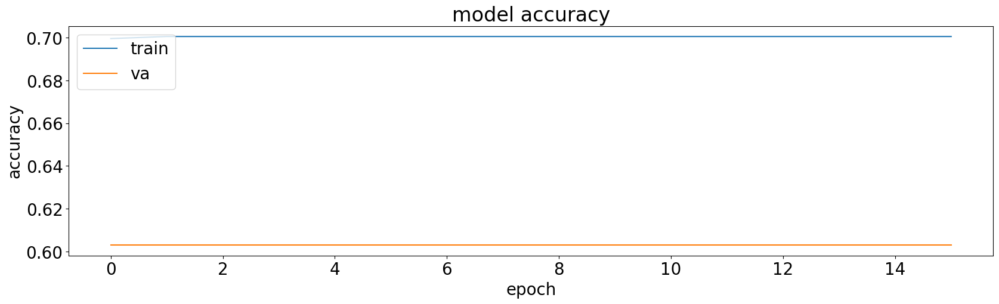

56/56 [==============================] - 2s 26ms/step


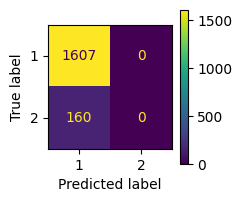

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 4/40 [==>...........................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 24ms/step


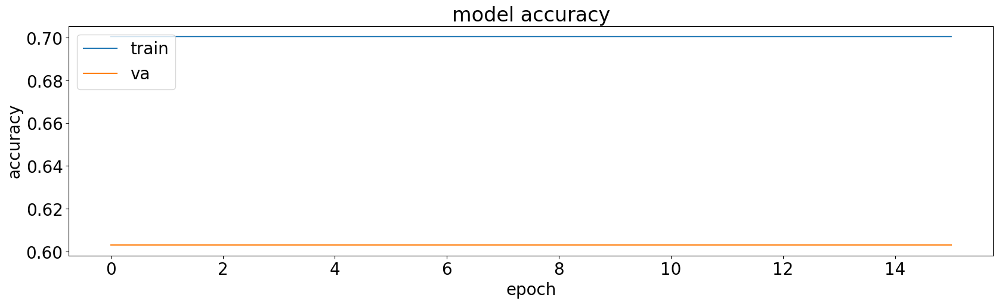

56/56 [==============================] - 1s 16ms/step


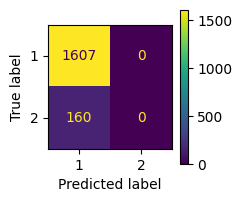

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 9/40 [=====>........................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 16ms/step


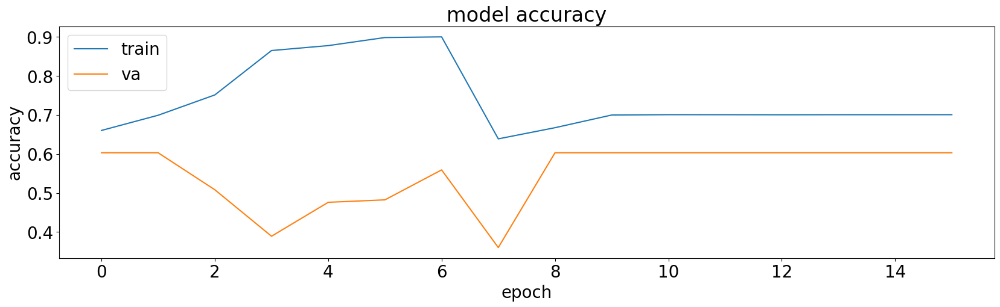

56/56 [==============================] - 1s 8ms/step


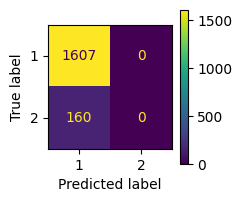

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

15/40 [==========>...................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 0s 8ms/step


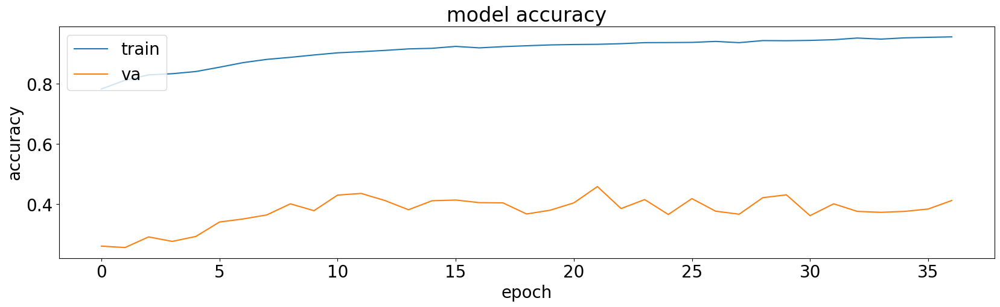

56/56 [==============================] - 1s 7ms/step


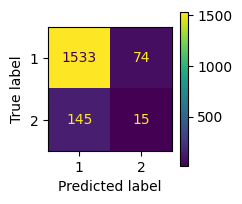

              precision    recall  f1-score   support

           1       0.91      0.95      0.93      1607
           2       0.17      0.09      0.12       160

    accuracy                           0.88      1767
   macro avg       0.54      0.52      0.53      1767
weighted avg       0.85      0.88      0.86      1767

40/40 [==============================] - 0s 7ms/step


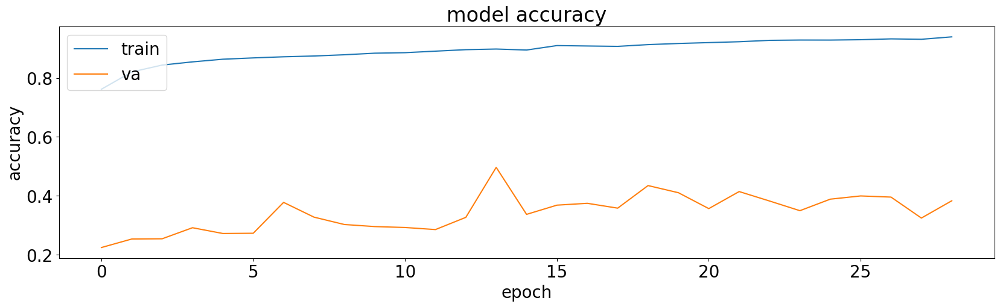

56/56 [==============================] - 2s 24ms/step


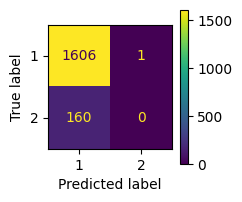

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

40/40 [==============================] - 1s 21ms/step


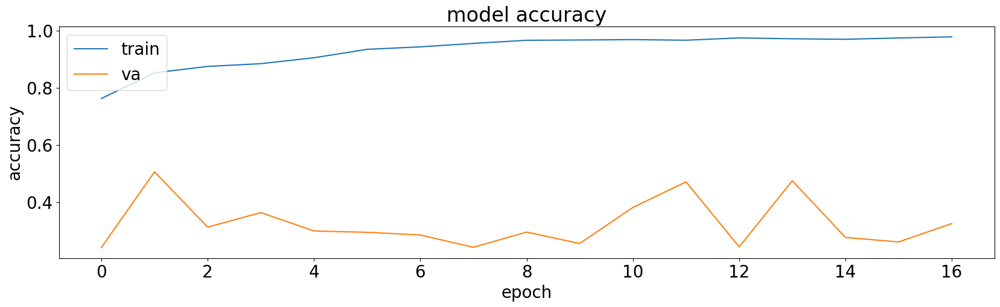

56/56 [==============================] - 3s 34ms/step


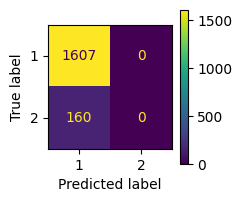

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 3/40 [=>............................] - ETA: 1s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 32ms/step


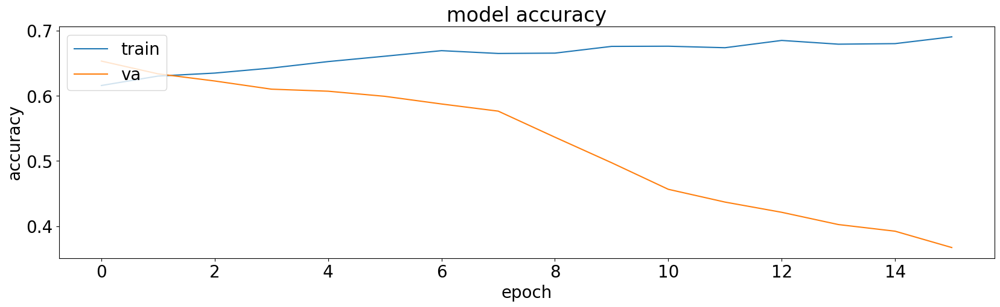

56/56 [==============================] - 3s 28ms/step


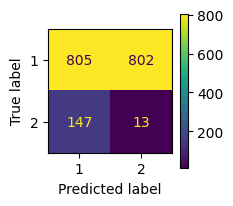

              precision    recall  f1-score   support

           1       0.85      0.50      0.63      1607
           2       0.02      0.08      0.03       160

    accuracy                           0.46      1767
   macro avg       0.43      0.29      0.33      1767
weighted avg       0.77      0.46      0.57      1767

40/40 [==============================] - 1s 26ms/step


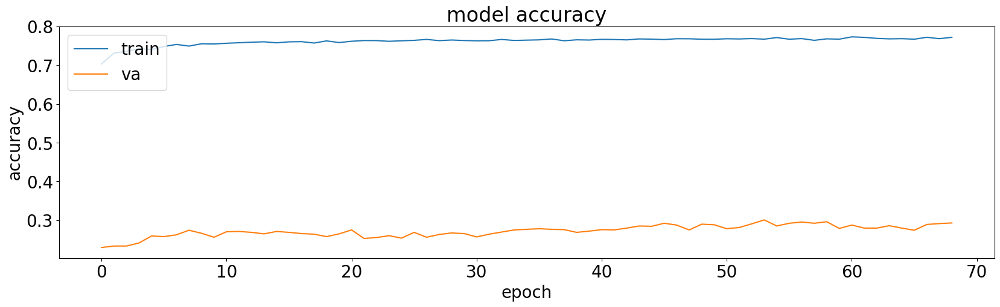

56/56 [==============================] - 1s 8ms/step


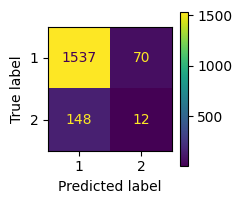

              precision    recall  f1-score   support

           1       0.91      0.96      0.93      1607
           2       0.15      0.07      0.10       160

    accuracy                           0.88      1767
   macro avg       0.53      0.52      0.52      1767
weighted avg       0.84      0.88      0.86      1767

40/40 [==============================] - 0s 8ms/step


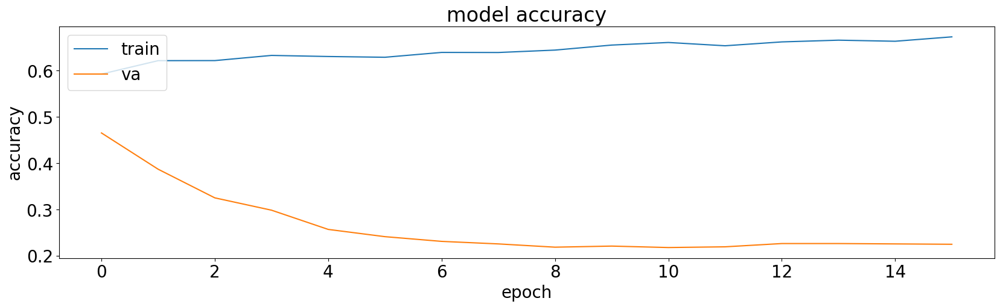

56/56 [==============================] - 3s 32ms/step


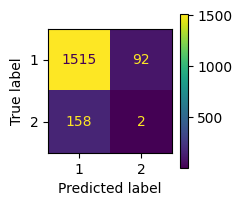

              precision    recall  f1-score   support

           1       0.91      0.94      0.92      1607
           2       0.02      0.01      0.02       160

    accuracy                           0.86      1767
   macro avg       0.46      0.48      0.47      1767
weighted avg       0.83      0.86      0.84      1767

40/40 [==============================] - 1s 30ms/step


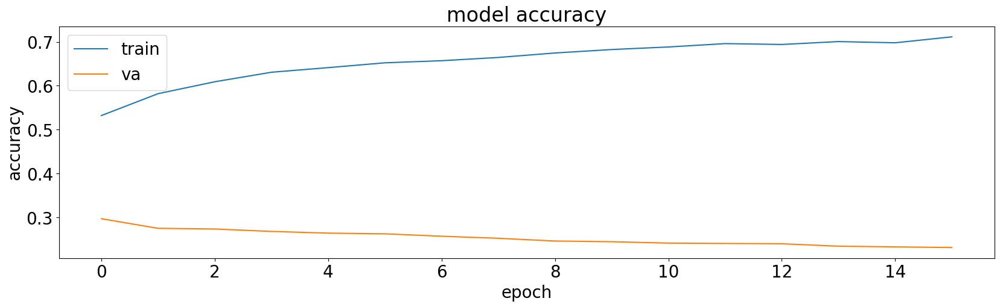

56/56 [==============================] - 1s 9ms/step


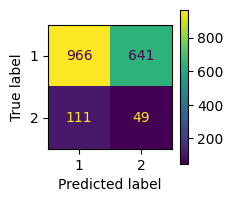

              precision    recall  f1-score   support

           1       0.90      0.60      0.72      1607
           2       0.07      0.31      0.12       160

    accuracy                           0.57      1767
   macro avg       0.48      0.45      0.42      1767
weighted avg       0.82      0.57      0.67      1767

40/40 [==============================] - 0s 9ms/step


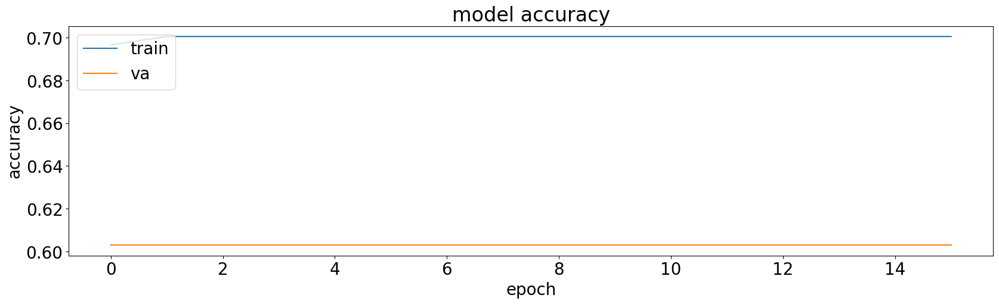

56/56 [==============================] - 2s 26ms/step


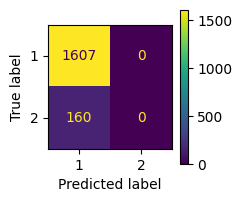

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 4/40 [==>...........................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 24ms/step


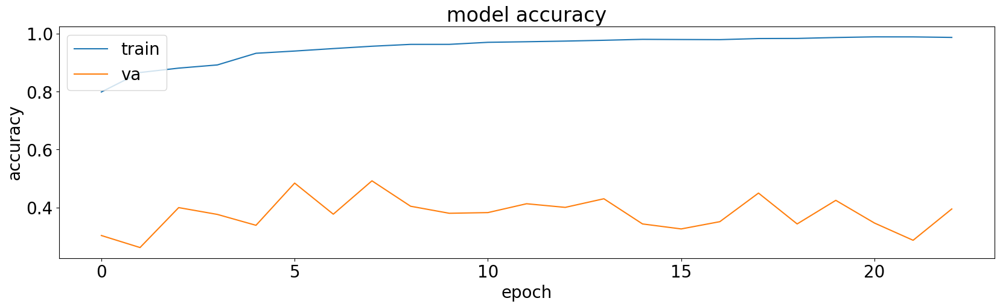

56/56 [==============================] - 1s 11ms/step


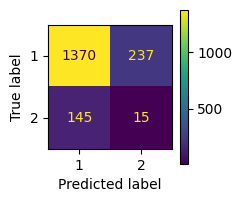

              precision    recall  f1-score   support

           1       0.90      0.85      0.88      1607
           2       0.06      0.09      0.07       160

    accuracy                           0.78      1767
   macro avg       0.48      0.47      0.48      1767
weighted avg       0.83      0.78      0.80      1767

40/40 [==============================] - 0s 11ms/step


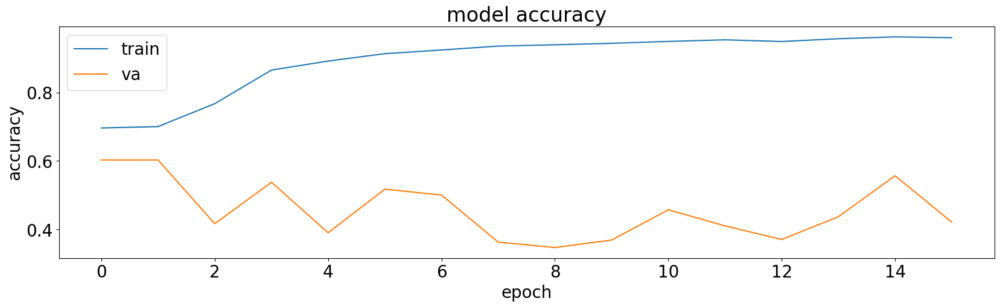

56/56 [==============================] - 1s 14ms/step


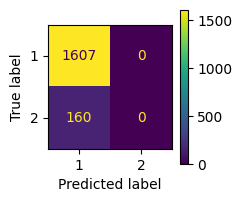

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 9/40 [=====>........................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 14ms/step


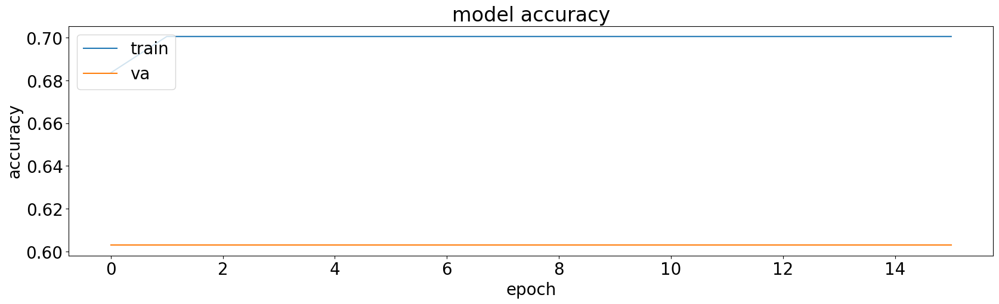

56/56 [==============================] - 1s 14ms/step


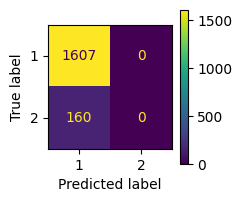

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 9/40 [=====>........................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 14ms/step


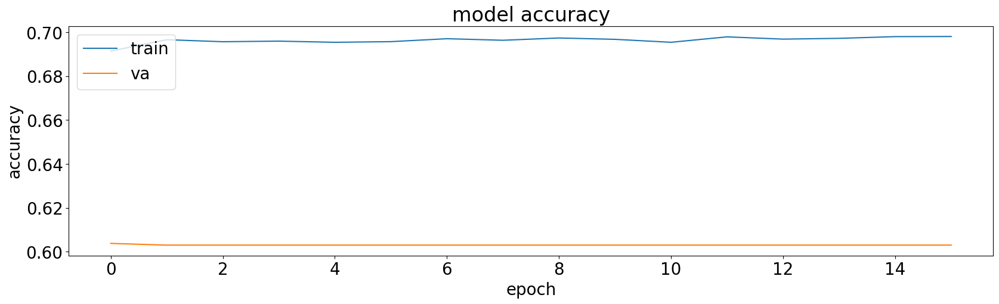

56/56 [==============================] - 1s 14ms/step


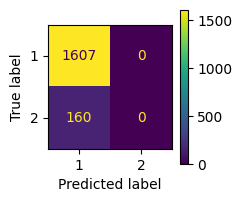

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 9/40 [=====>........................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 14ms/step


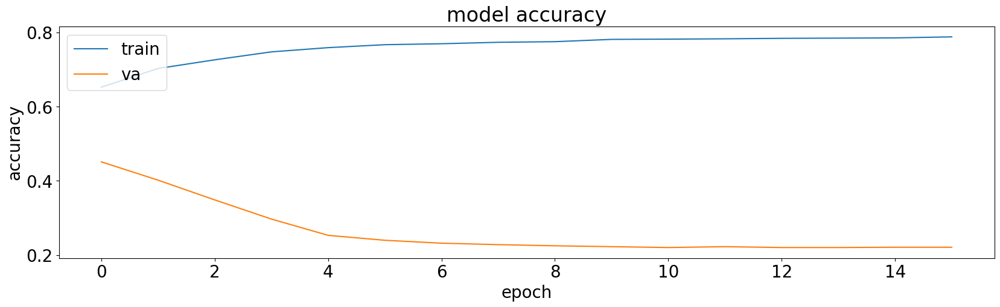

56/56 [==============================] - 2s 24ms/step


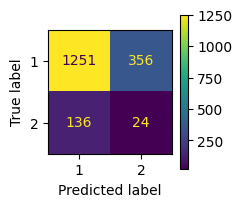

              precision    recall  f1-score   support

           1       0.90      0.78      0.84      1607
           2       0.06      0.15      0.09       160

    accuracy                           0.72      1767
   macro avg       0.48      0.46      0.46      1767
weighted avg       0.83      0.72      0.77      1767

40/40 [==============================] - 1s 21ms/step


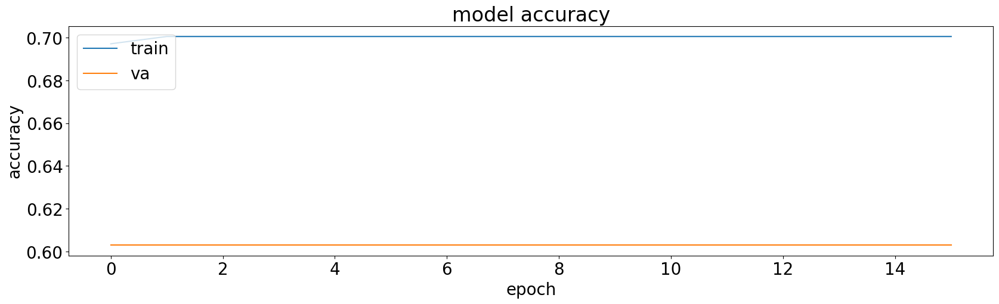

56/56 [==============================] - 1s 14ms/step


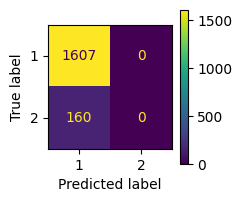

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 9/40 [=====>........................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 14ms/step


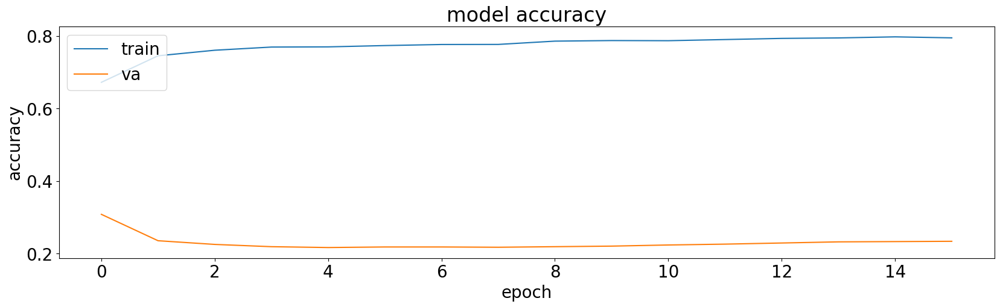

56/56 [==============================] - 1s 16ms/step


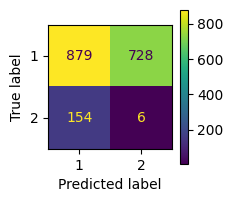

              precision    recall  f1-score   support

           1       0.85      0.55      0.67      1607
           2       0.01      0.04      0.01       160

    accuracy                           0.50      1767
   macro avg       0.43      0.29      0.34      1767
weighted avg       0.77      0.50      0.61      1767

40/40 [==============================] - 1s 16ms/step


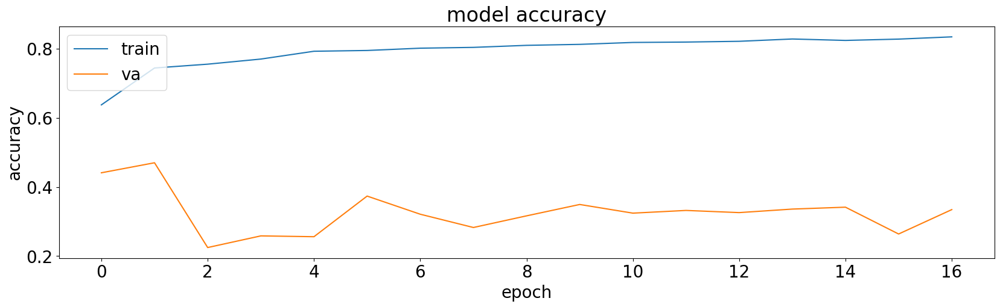

56/56 [==============================] - 1s 14ms/step


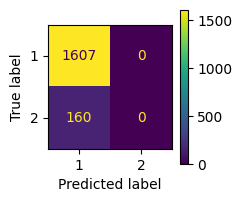

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 9/40 [=====>........................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 14ms/step


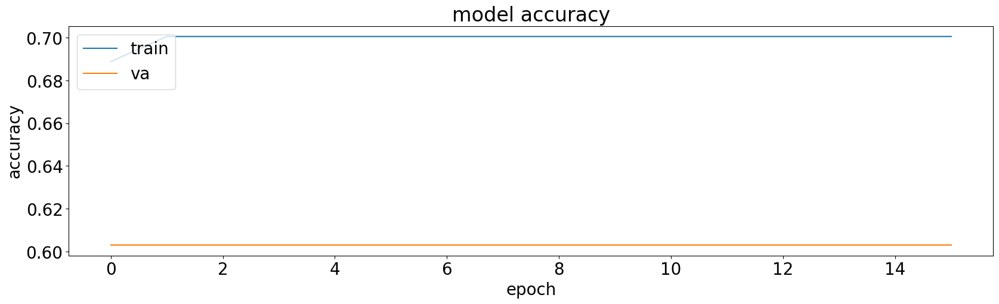

56/56 [==============================] - 1s 12ms/step


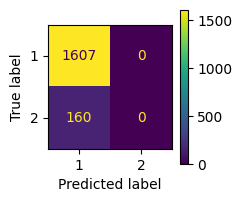

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

11/40 [=======>......................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 0s 11ms/step


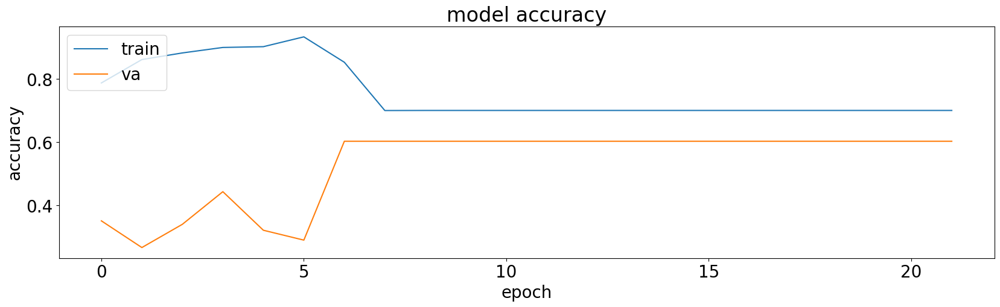

56/56 [==============================] - 2s 20ms/step


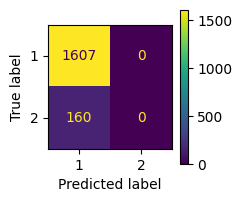

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 7/40 [====>.........................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 20ms/step


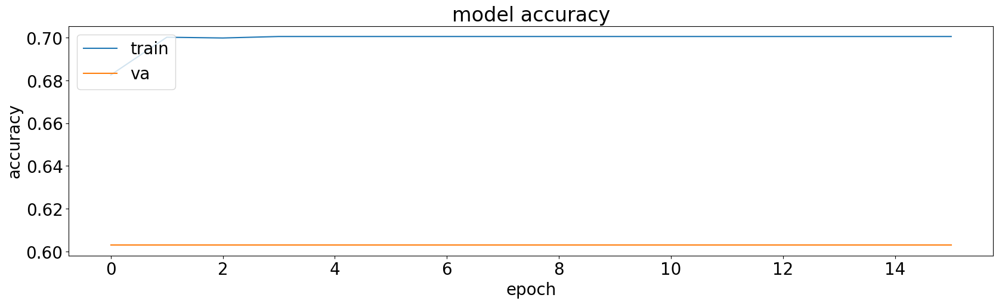

56/56 [==============================] - 2s 20ms/step


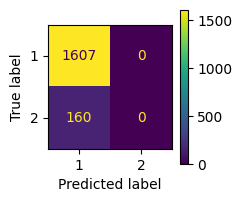

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 7/40 [====>.........................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 20ms/step


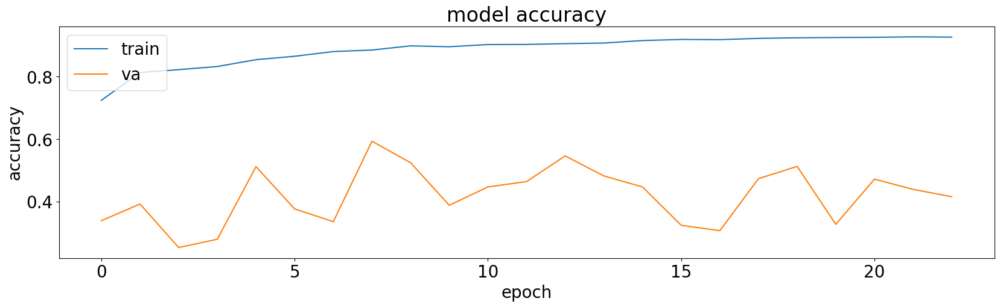

56/56 [==============================] - 4s 47ms/step


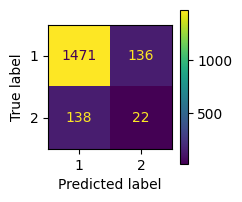

              precision    recall  f1-score   support

           1       0.91      0.92      0.91      1607
           2       0.14      0.14      0.14       160

    accuracy                           0.84      1767
   macro avg       0.53      0.53      0.53      1767
weighted avg       0.84      0.84      0.84      1767

40/40 [==============================] - 2s 45ms/step


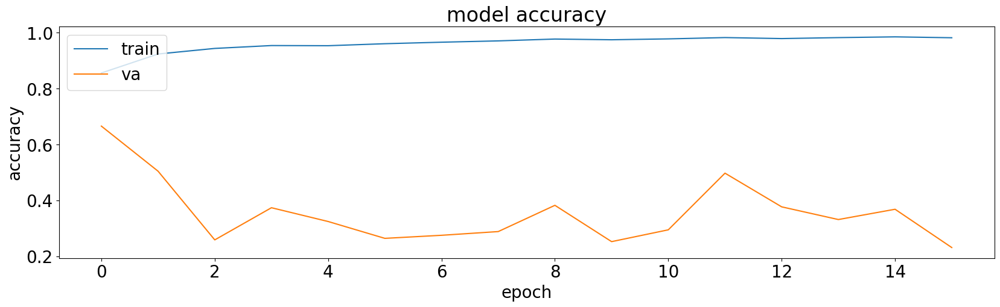

56/56 [==============================] - 3s 34ms/step


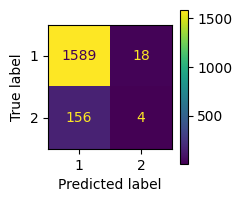

              precision    recall  f1-score   support

           1       0.91      0.99      0.95      1607
           2       0.18      0.03      0.04       160

    accuracy                           0.90      1767
   macro avg       0.55      0.51      0.50      1767
weighted avg       0.84      0.90      0.87      1767

40/40 [==============================] - 1s 32ms/step


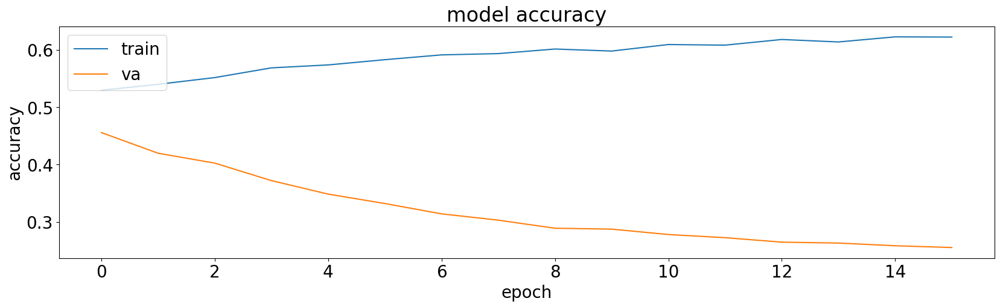

56/56 [==============================] - 1s 8ms/step


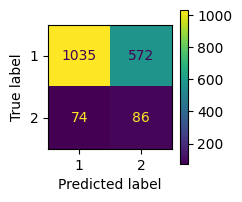

              precision    recall  f1-score   support

           1       0.93      0.64      0.76      1607
           2       0.13      0.54      0.21       160

    accuracy                           0.63      1767
   macro avg       0.53      0.59      0.49      1767
weighted avg       0.86      0.63      0.71      1767

40/40 [==============================] - 0s 8ms/step


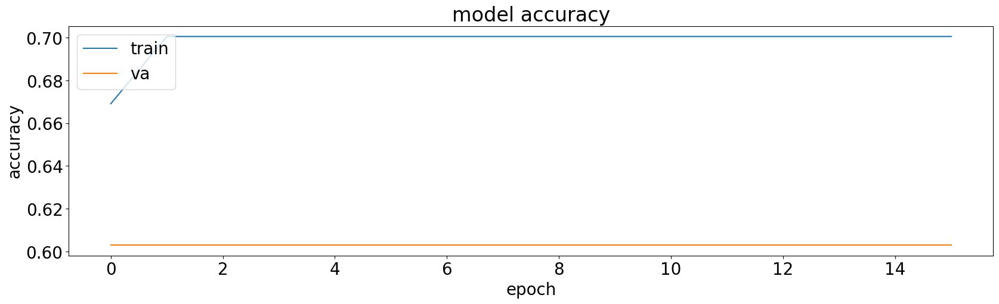

56/56 [==============================] - 1s 12ms/step


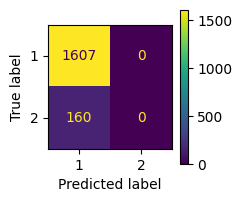

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

11/40 [=======>......................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 0s 12ms/step


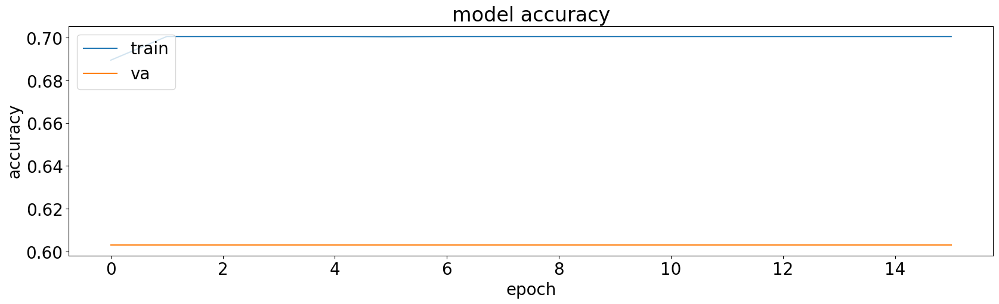

56/56 [==============================] - 3s 42ms/step


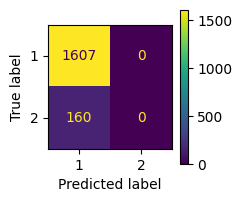

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 3/40 [=>............................] - ETA: 1s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 2s 40ms/step


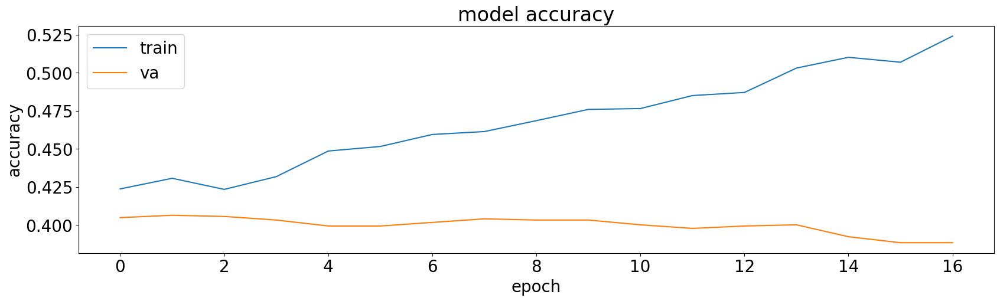

56/56 [==============================] - 3s 31ms/step


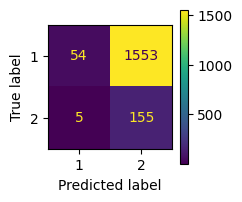

              precision    recall  f1-score   support

           1       0.92      0.03      0.06      1607
           2       0.09      0.97      0.17       160

    accuracy                           0.12      1767
   macro avg       0.50      0.50      0.12      1767
weighted avg       0.84      0.12      0.07      1767

40/40 [==============================] - 1s 28ms/step


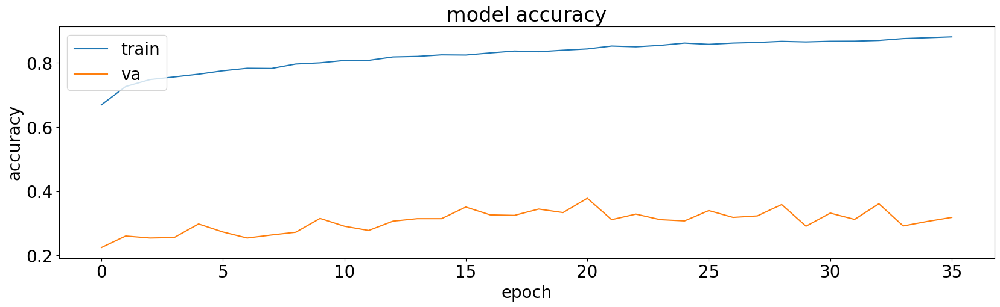

56/56 [==============================] - 1s 14ms/step


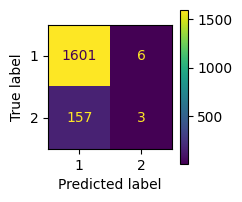

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.33      0.02      0.04       160

    accuracy                           0.91      1767
   macro avg       0.62      0.51      0.49      1767
weighted avg       0.86      0.91      0.87      1767

40/40 [==============================] - 1s 14ms/step


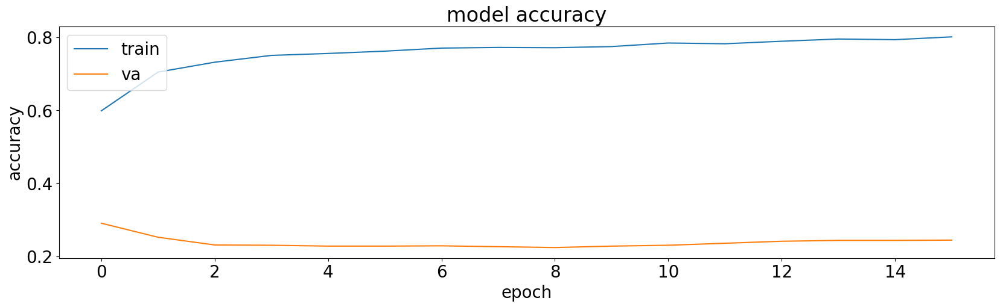

56/56 [==============================] - 2s 24ms/step


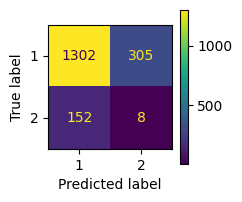

              precision    recall  f1-score   support

           1       0.90      0.81      0.85      1607
           2       0.03      0.05      0.03       160

    accuracy                           0.74      1767
   macro avg       0.46      0.43      0.44      1767
weighted avg       0.82      0.74      0.78      1767

40/40 [==============================] - 1s 21ms/step


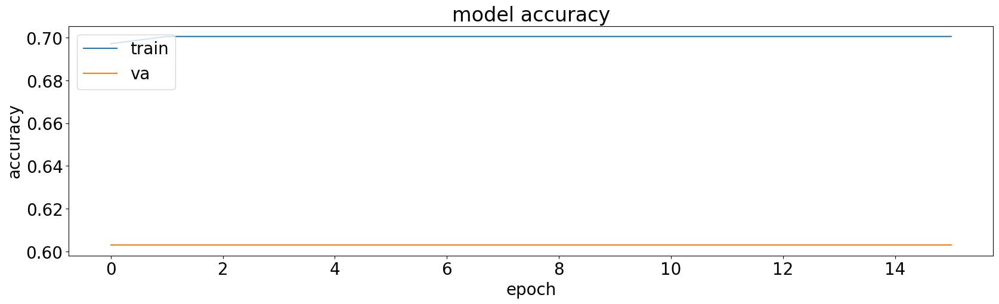

56/56 [==============================] - 2s 27ms/step


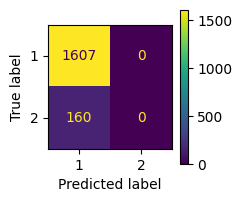

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 4/40 [==>...........................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 24ms/step


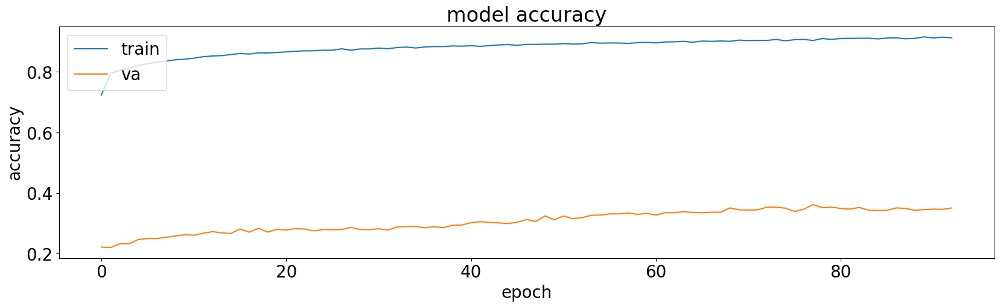

56/56 [==============================] - 2s 23ms/step


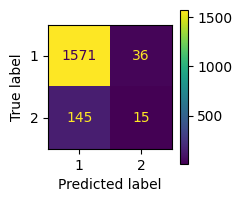

              precision    recall  f1-score   support

           1       0.92      0.98      0.95      1607
           2       0.29      0.09      0.14       160

    accuracy                           0.90      1767
   macro avg       0.60      0.54      0.54      1767
weighted avg       0.86      0.90      0.87      1767

40/40 [==============================] - 1s 22ms/step


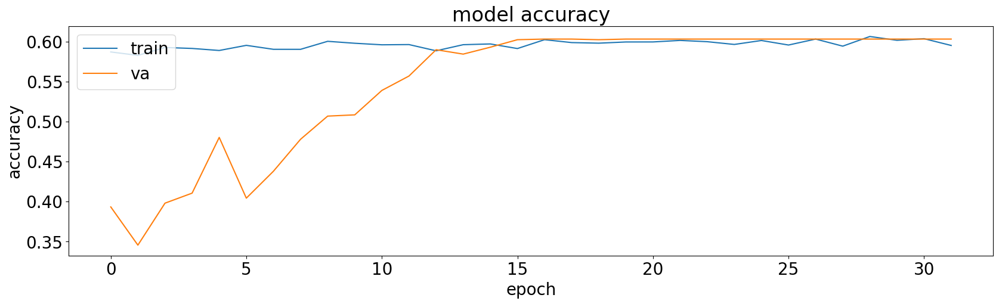

56/56 [==============================] - 2s 22ms/step


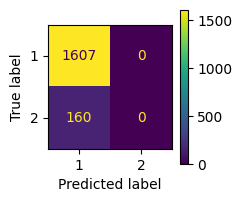

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 7/40 [====>.........................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 20ms/step


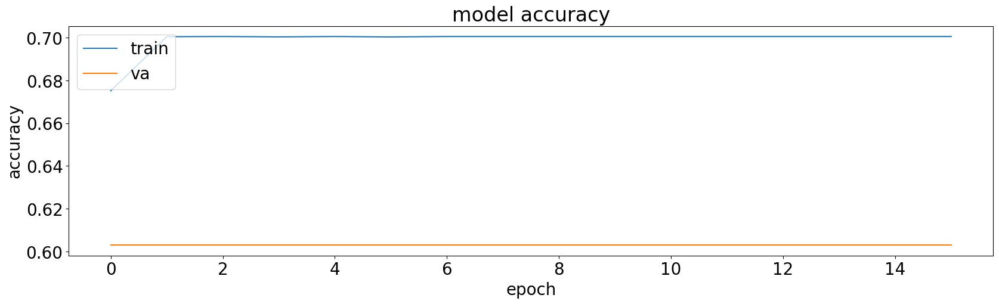

56/56 [==============================] - 1s 12ms/step


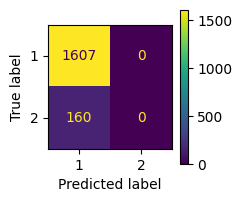

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

11/40 [=======>......................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 0s 12ms/step


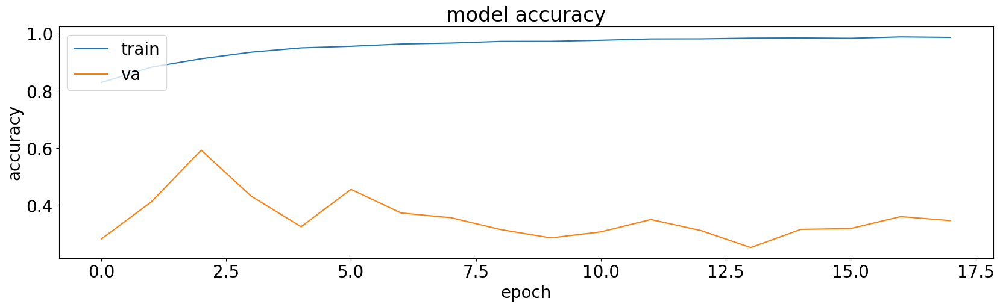

56/56 [==============================] - 2s 24ms/step


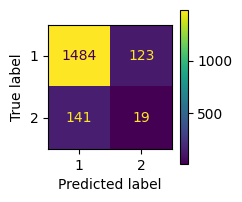

              precision    recall  f1-score   support

           1       0.91      0.92      0.92      1607
           2       0.13      0.12      0.13       160

    accuracy                           0.85      1767
   macro avg       0.52      0.52      0.52      1767
weighted avg       0.84      0.85      0.85      1767

40/40 [==============================] - 1s 22ms/step


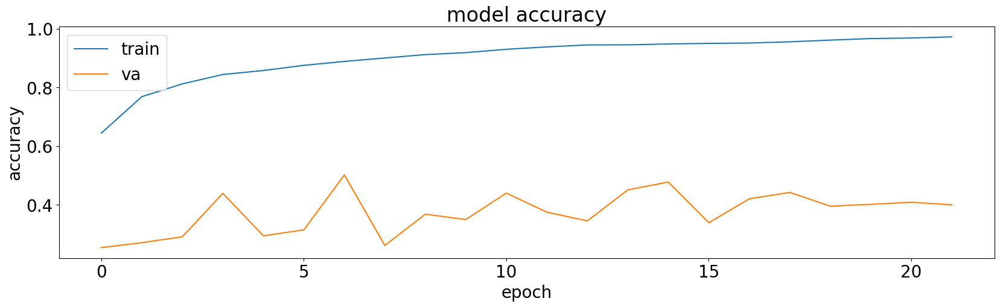

56/56 [==============================] - 1s 8ms/step


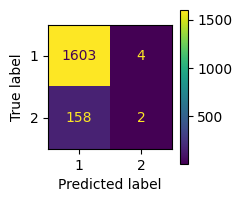

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.33      0.01      0.02       160

    accuracy                           0.91      1767
   macro avg       0.62      0.51      0.49      1767
weighted avg       0.86      0.91      0.87      1767

40/40 [==============================] - 0s 8ms/step


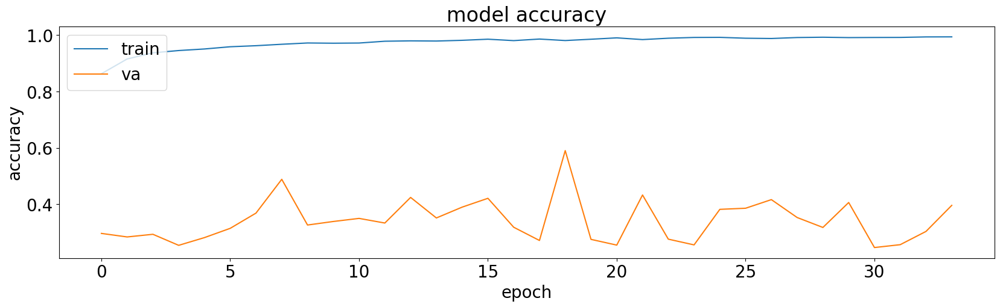

56/56 [==============================] - 3s 34ms/step


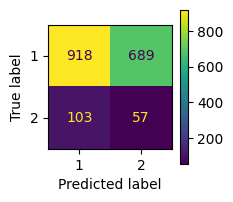

              precision    recall  f1-score   support

           1       0.90      0.57      0.70      1607
           2       0.08      0.36      0.13       160

    accuracy                           0.55      1767
   macro avg       0.49      0.46      0.41      1767
weighted avg       0.82      0.55      0.65      1767

40/40 [==============================] - 1s 32ms/step


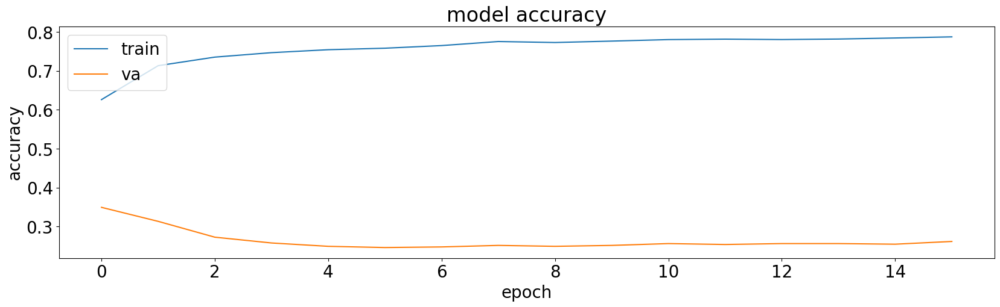

56/56 [==============================] - 1s 14ms/step


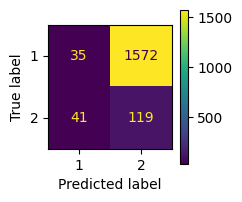

              precision    recall  f1-score   support

           1       0.46      0.02      0.04      1607
           2       0.07      0.74      0.13       160

    accuracy                           0.09      1767
   macro avg       0.27      0.38      0.09      1767
weighted avg       0.43      0.09      0.05      1767

40/40 [==============================] - 1s 14ms/step


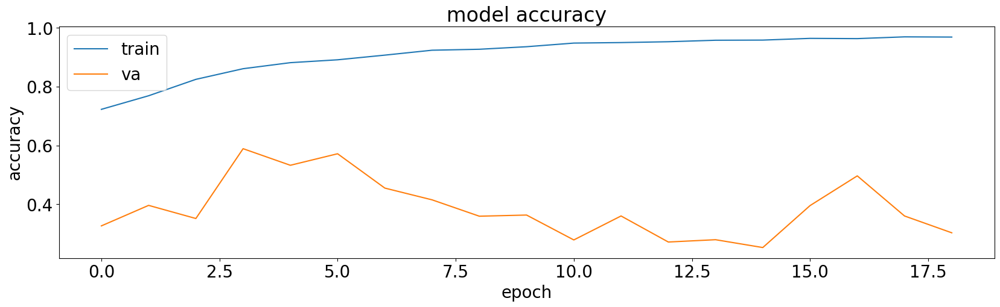

56/56 [==============================] - 2s 24ms/step


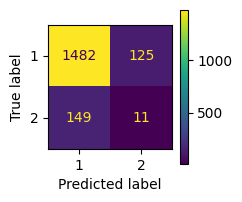

              precision    recall  f1-score   support

           1       0.91      0.92      0.92      1607
           2       0.08      0.07      0.07       160

    accuracy                           0.84      1767
   macro avg       0.49      0.50      0.49      1767
weighted avg       0.83      0.84      0.84      1767

40/40 [==============================] - 1s 22ms/step


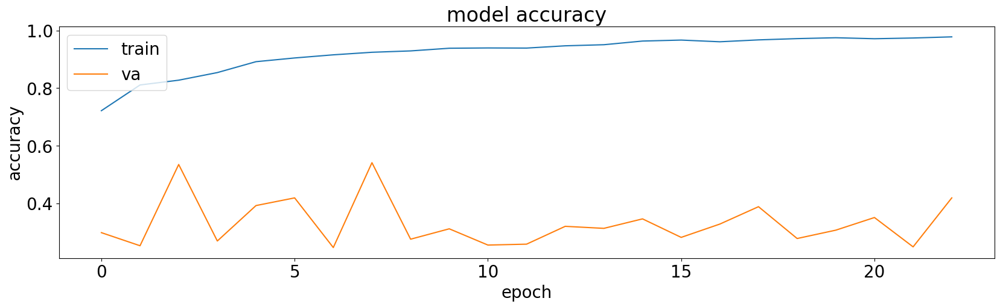

56/56 [==============================] - 3s 31ms/step


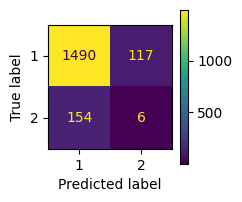

              precision    recall  f1-score   support

           1       0.91      0.93      0.92      1607
           2       0.05      0.04      0.04       160

    accuracy                           0.85      1767
   macro avg       0.48      0.48      0.48      1767
weighted avg       0.83      0.85      0.84      1767

40/40 [==============================] - 1s 29ms/step


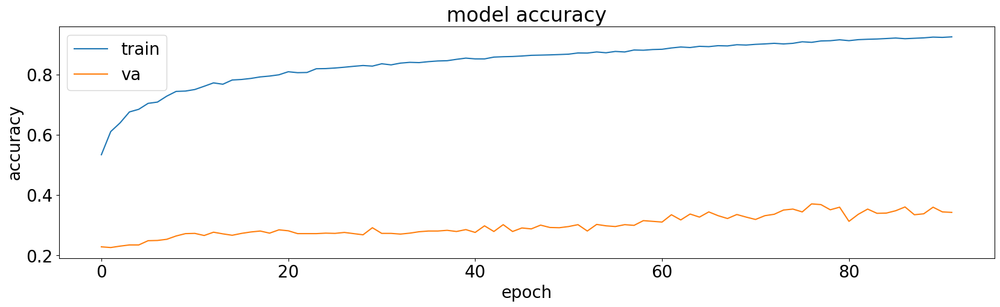

56/56 [==============================] - 2s 22ms/step


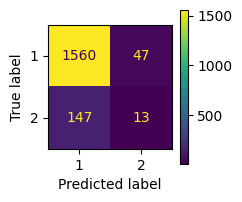

              precision    recall  f1-score   support

           1       0.91      0.97      0.94      1607
           2       0.22      0.08      0.12       160

    accuracy                           0.89      1767
   macro avg       0.57      0.53      0.53      1767
weighted avg       0.85      0.89      0.87      1767

40/40 [==============================] - 1s 20ms/step


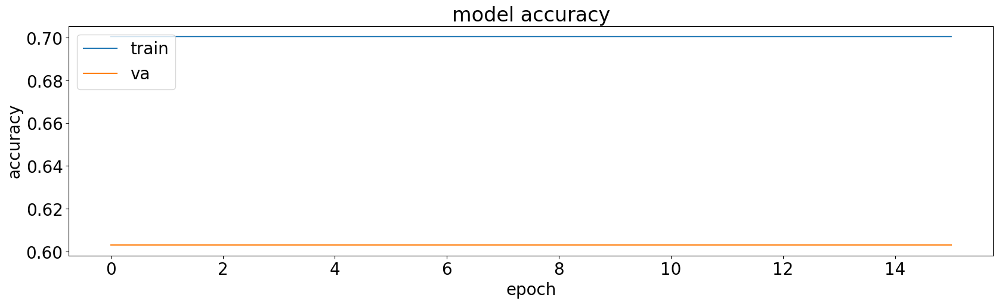

56/56 [==============================] - 1s 7ms/step


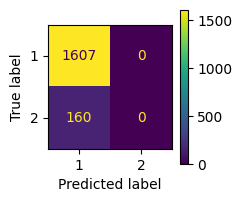

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

15/40 [==========>...................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 0s 8ms/step


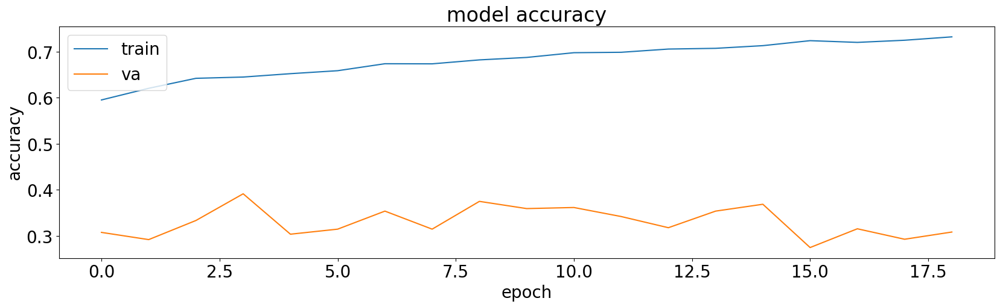

56/56 [==============================] - 1s 8ms/step


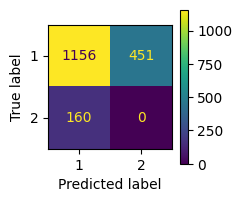

              precision    recall  f1-score   support

           1       0.88      0.72      0.79      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.65      1767
   macro avg       0.44      0.36      0.40      1767
weighted avg       0.80      0.65      0.72      1767

40/40 [==============================] - 0s 8ms/step


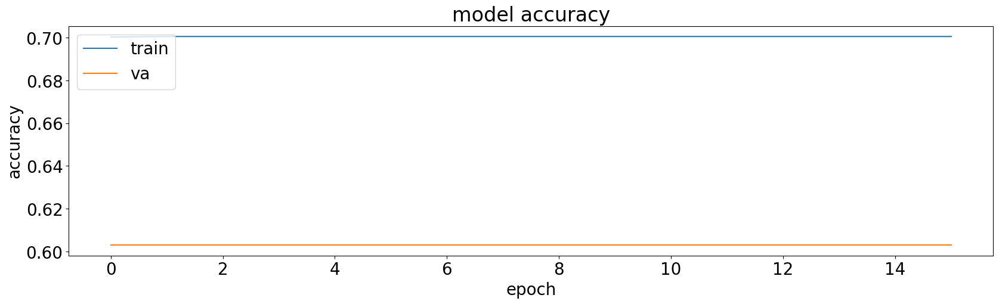

56/56 [==============================] - 4s 45ms/step


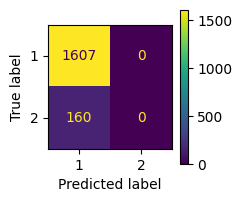

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 3/40 [=>............................] - ETA: 1s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 2s 43ms/step


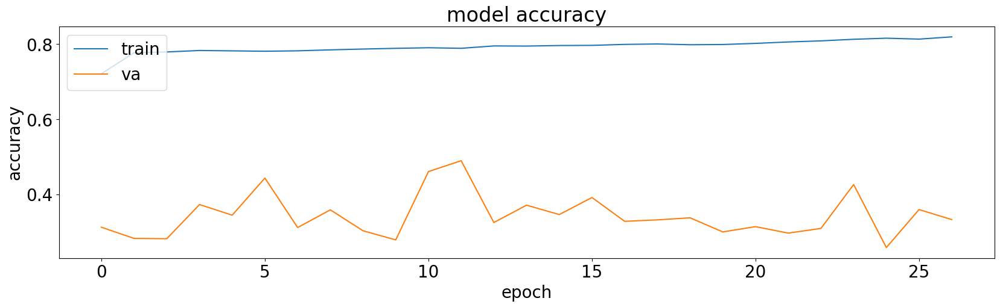

56/56 [==============================] - 1s 14ms/step


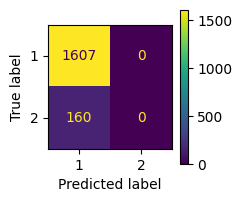

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 9/40 [=====>........................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 15ms/step


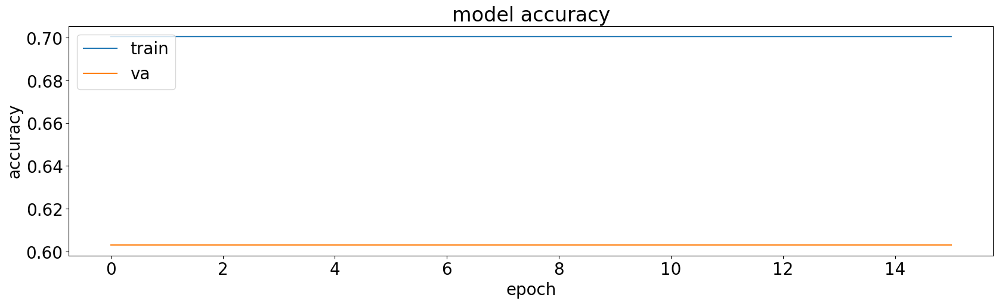

56/56 [==============================] - 1s 16ms/step


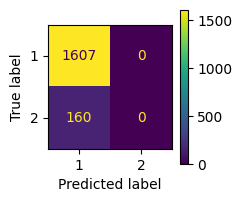

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 9/40 [=====>........................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 16ms/step


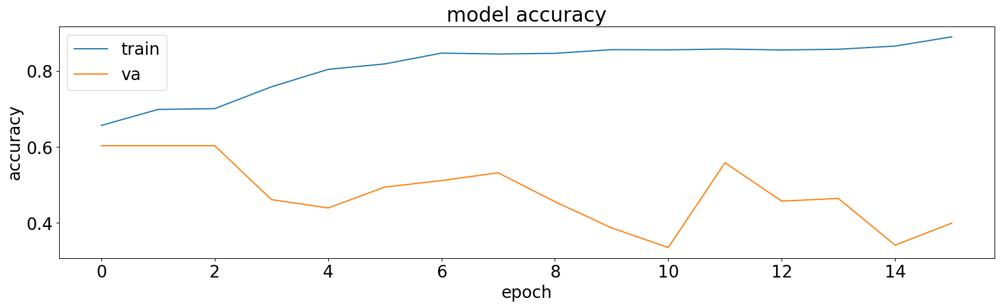

56/56 [==============================] - 1s 16ms/step


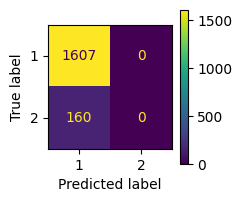

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 9/40 [=====>........................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 16ms/step


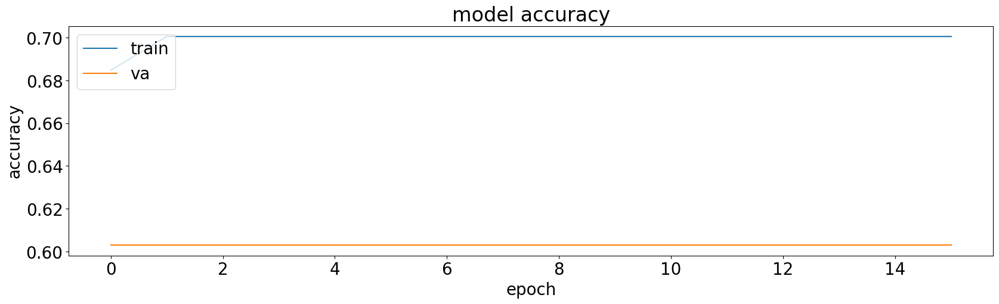

56/56 [==============================] - 3s 34ms/step


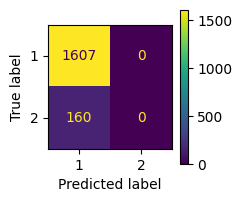

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 3/40 [=>............................] - ETA: 1s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 32ms/step


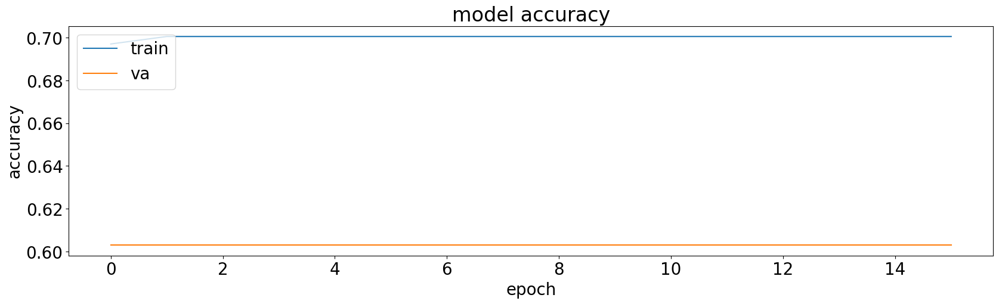

56/56 [==============================] - 3s 31ms/step


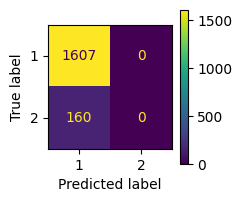

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 5/40 [==>...........................] - ETA: 1s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 29ms/step


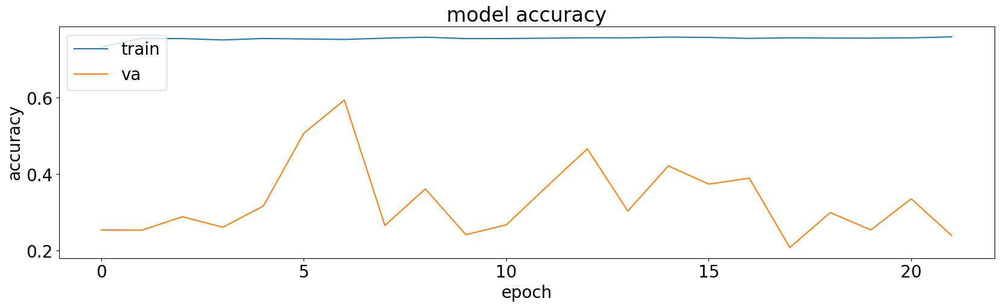

56/56 [==============================] - 1s 14ms/step


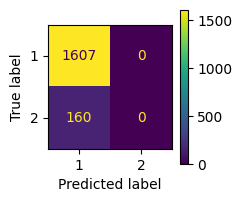

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 9/40 [=====>........................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 14ms/step


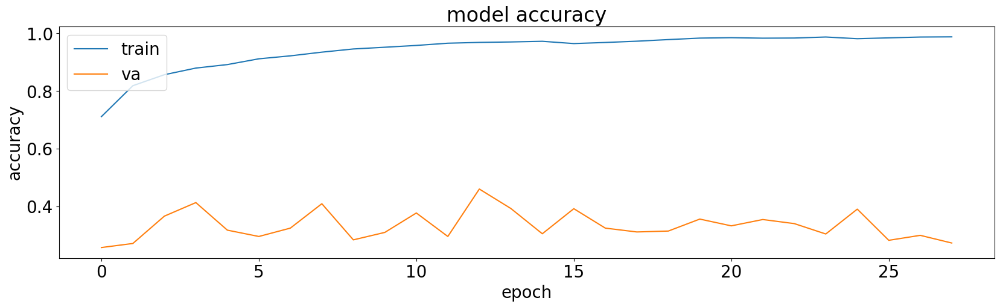

56/56 [==============================] - 1s 8ms/step


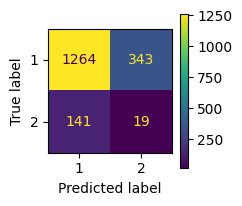

              precision    recall  f1-score   support

           1       0.90      0.79      0.84      1607
           2       0.05      0.12      0.07       160

    accuracy                           0.73      1767
   macro avg       0.48      0.45      0.46      1767
weighted avg       0.82      0.73      0.77      1767

40/40 [==============================] - 0s 8ms/step


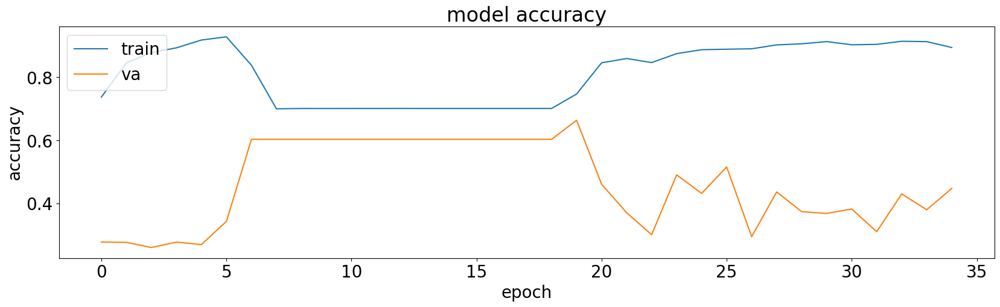

56/56 [==============================] - 1s 10ms/step


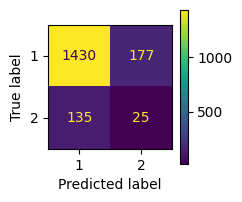

              precision    recall  f1-score   support

           1       0.91      0.89      0.90      1607
           2       0.12      0.16      0.14       160

    accuracy                           0.82      1767
   macro avg       0.52      0.52      0.52      1767
weighted avg       0.84      0.82      0.83      1767

40/40 [==============================] - 0s 10ms/step


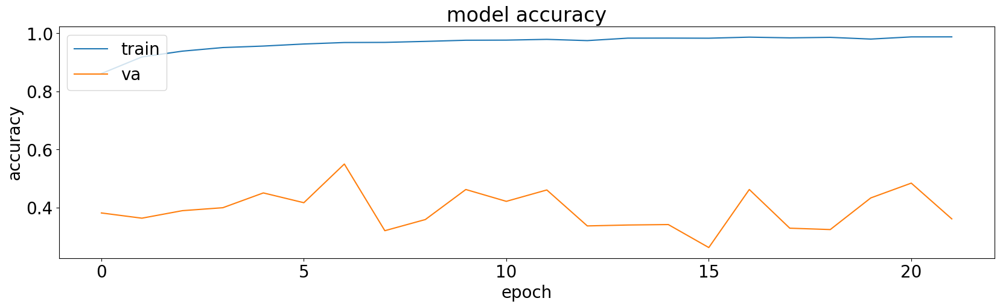

56/56 [==============================] - 3s 34ms/step


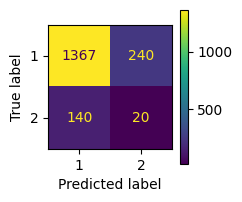

              precision    recall  f1-score   support

           1       0.91      0.85      0.88      1607
           2       0.08      0.12      0.10       160

    accuracy                           0.78      1767
   macro avg       0.49      0.49      0.49      1767
weighted avg       0.83      0.78      0.81      1767

40/40 [==============================] - 1s 31ms/step


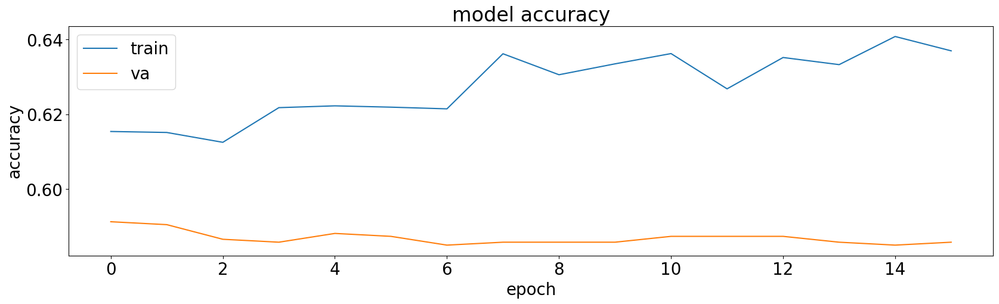

56/56 [==============================] - 3s 29ms/step


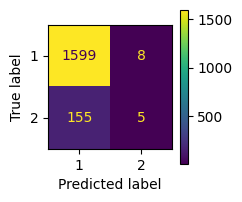

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.38      0.03      0.06       160

    accuracy                           0.91      1767
   macro avg       0.65      0.51      0.50      1767
weighted avg       0.86      0.91      0.87      1767

40/40 [==============================] - 1s 26ms/step


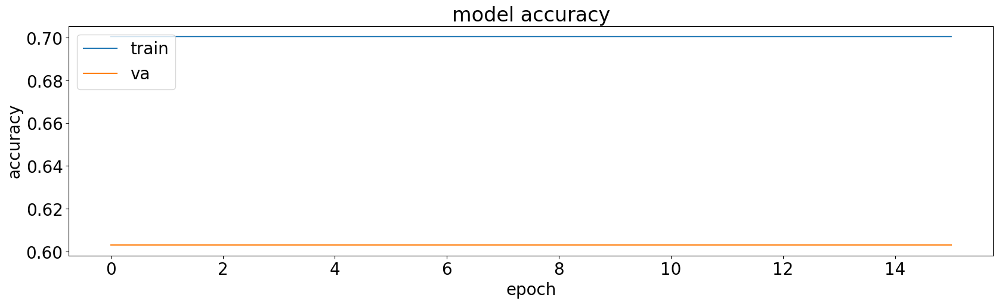

56/56 [==============================] - 2s 26ms/step


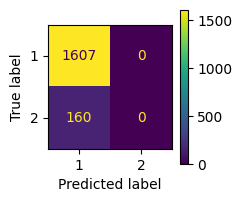

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 4/40 [==>...........................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 24ms/step


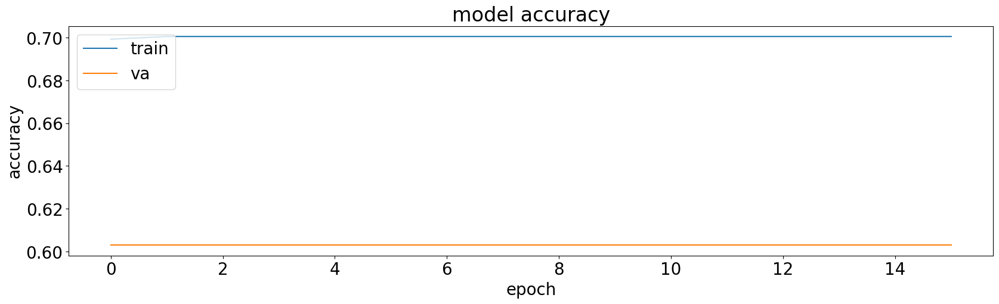

56/56 [==============================] - 1s 14ms/step


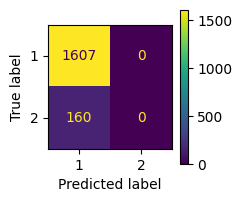

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 9/40 [=====>........................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 14ms/step


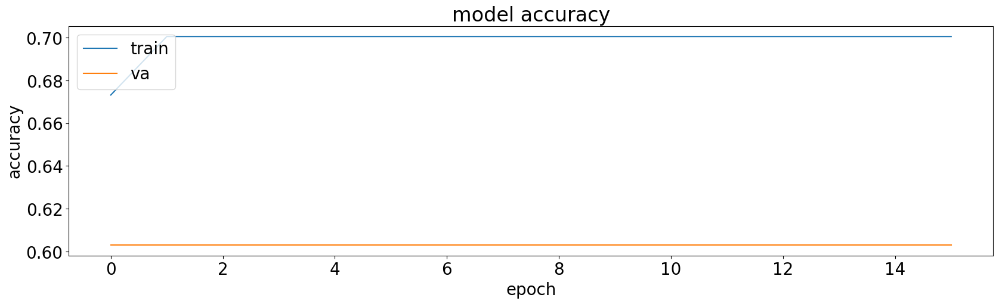

56/56 [==============================] - 3s 34ms/step


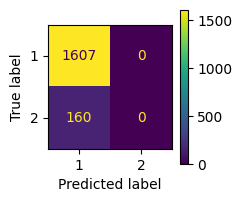

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 3/40 [=>............................] - ETA: 1s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 32ms/step


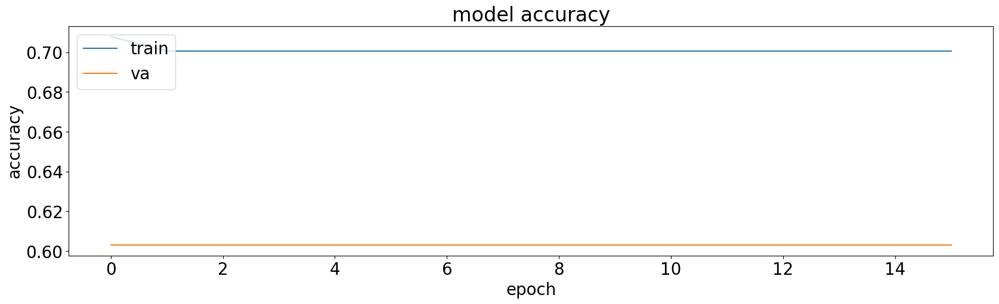

56/56 [==============================] - 2s 20ms/step


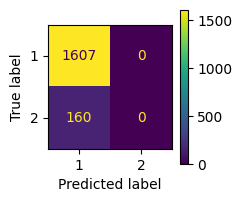

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 7/40 [====>.........................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 20ms/step


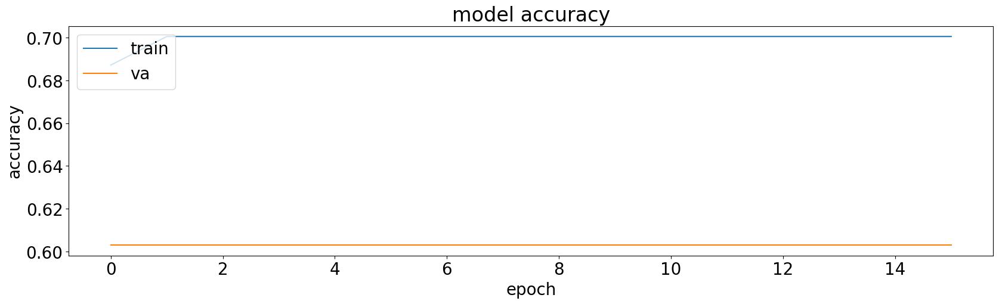

56/56 [==============================] - 3s 34ms/step


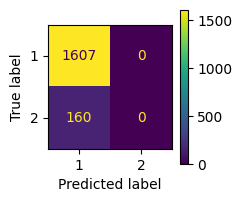

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 3/40 [=>............................] - ETA: 1s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 33ms/step


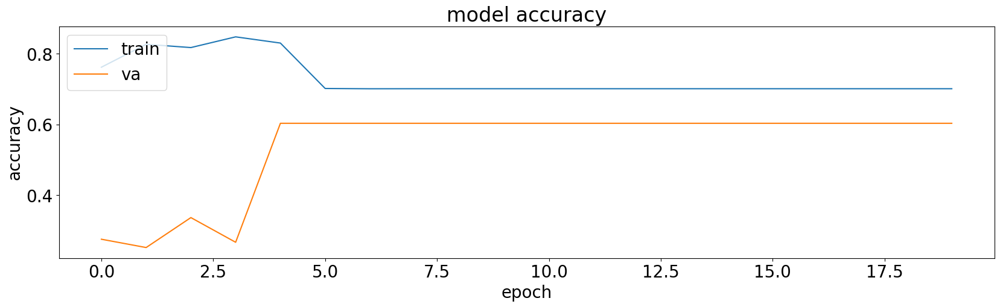

56/56 [==============================] - 2s 20ms/step


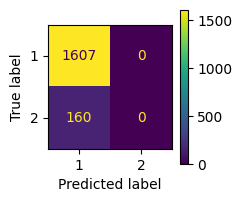

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 7/40 [====>.........................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 20ms/step


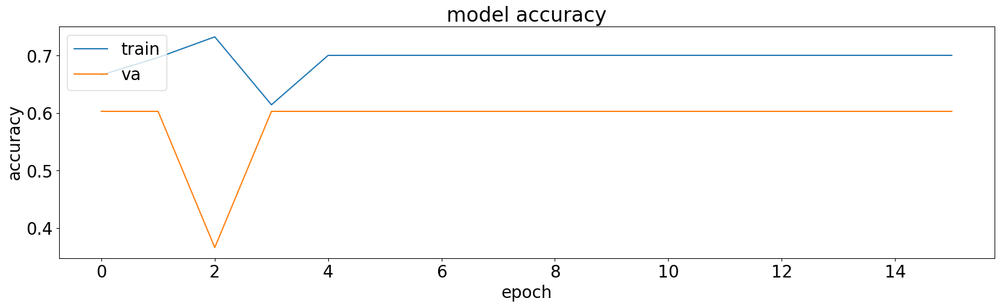

56/56 [==============================] - 1s 10ms/step


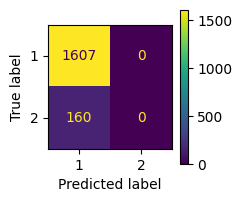

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

13/40 [========>.....................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 0s 10ms/step


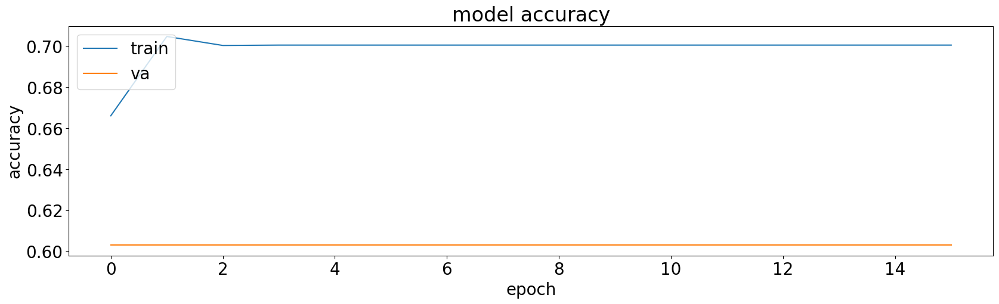

56/56 [==============================] - 2s 20ms/step


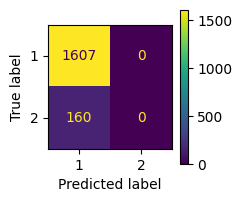

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 7/40 [====>.........................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 20ms/step


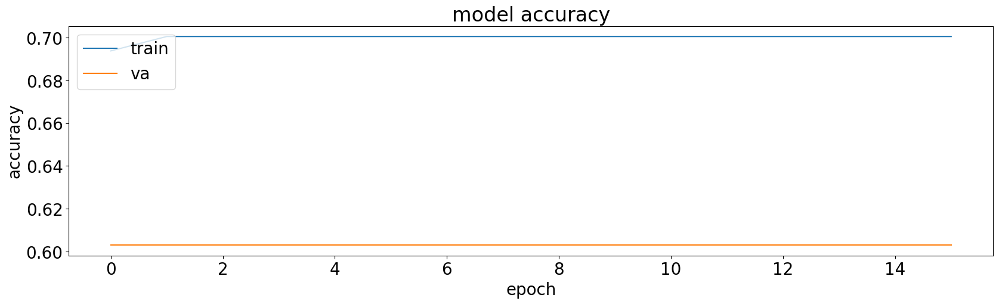

56/56 [==============================] - 2s 23ms/step


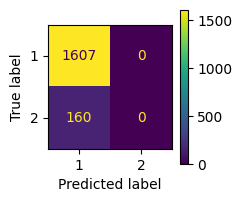

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 7/40 [====>.........................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 21ms/step


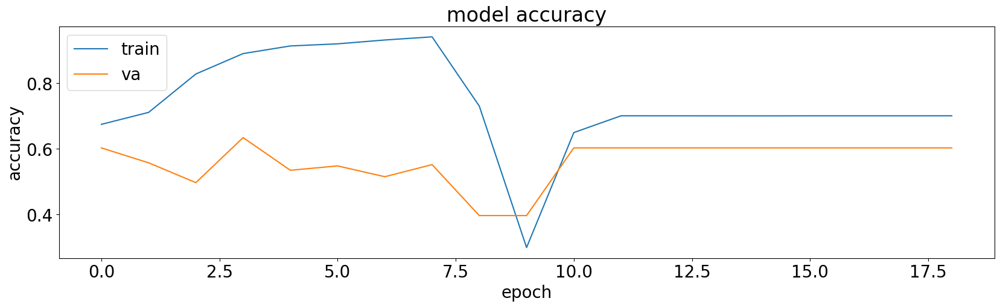

56/56 [==============================] - 1s 10ms/step


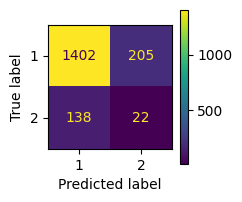

              precision    recall  f1-score   support

           1       0.91      0.87      0.89      1607
           2       0.10      0.14      0.11       160

    accuracy                           0.81      1767
   macro avg       0.50      0.50      0.50      1767
weighted avg       0.84      0.81      0.82      1767

40/40 [==============================] - 0s 9ms/step


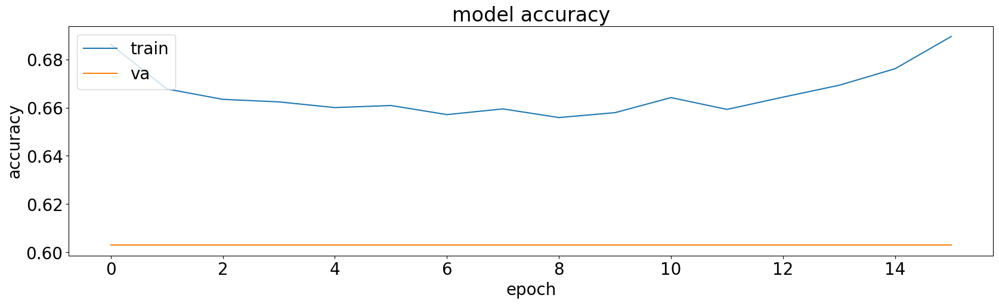

56/56 [==============================] - 2s 23ms/step


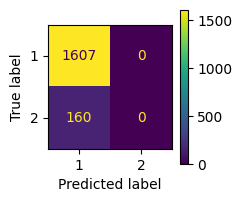

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 4/40 [==>...........................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 21ms/step


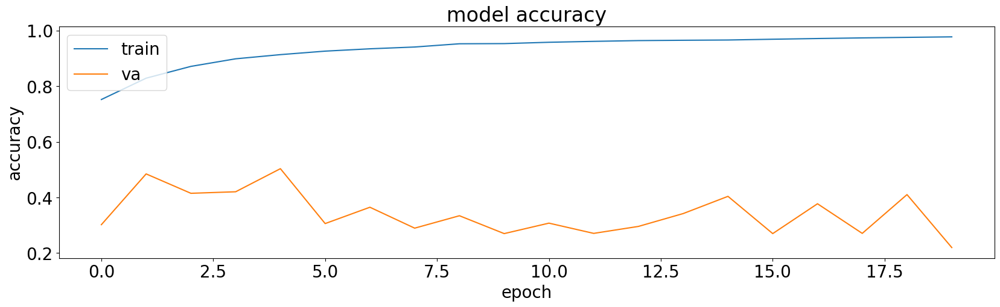

56/56 [==============================] - 2s 24ms/step


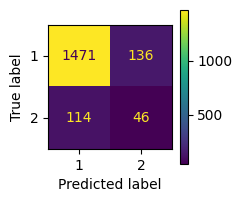

              precision    recall  f1-score   support

           1       0.93      0.92      0.92      1607
           2       0.25      0.29      0.27       160

    accuracy                           0.86      1767
   macro avg       0.59      0.60      0.60      1767
weighted avg       0.87      0.86      0.86      1767

40/40 [==============================] - 1s 21ms/step


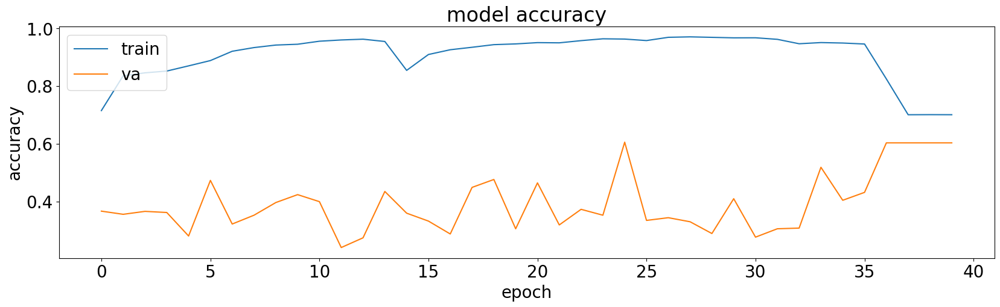

56/56 [==============================] - 1s 10ms/step


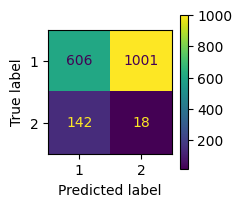

              precision    recall  f1-score   support

           1       0.81      0.38      0.51      1607
           2       0.02      0.11      0.03       160

    accuracy                           0.35      1767
   macro avg       0.41      0.24      0.27      1767
weighted avg       0.74      0.35      0.47      1767

40/40 [==============================] - 0s 10ms/step


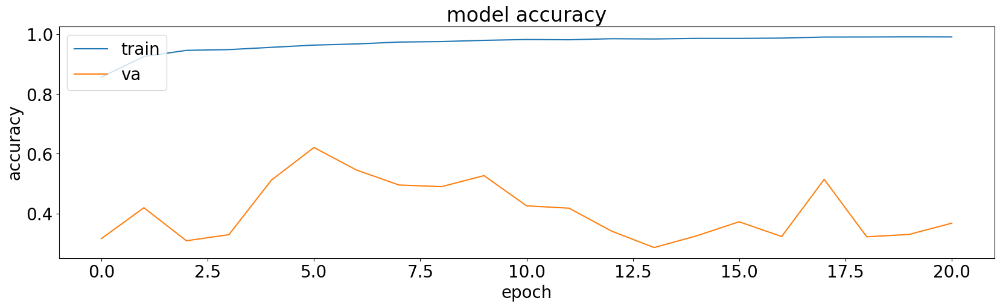

56/56 [==============================] - 3s 34ms/step


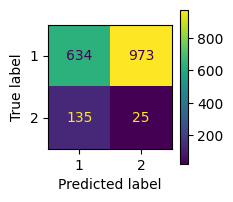

              precision    recall  f1-score   support

           1       0.82      0.39      0.53      1607
           2       0.03      0.16      0.04       160

    accuracy                           0.37      1767
   macro avg       0.42      0.28      0.29      1767
weighted avg       0.75      0.37      0.49      1767

40/40 [==============================] - 1s 32ms/step


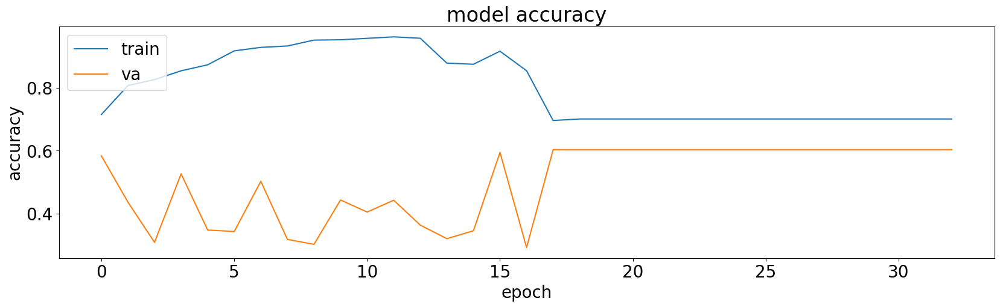

56/56 [==============================] - 1s 10ms/step


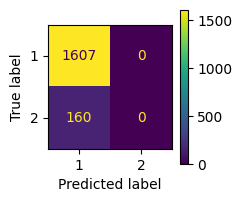

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

13/40 [========>.....................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 0s 10ms/step


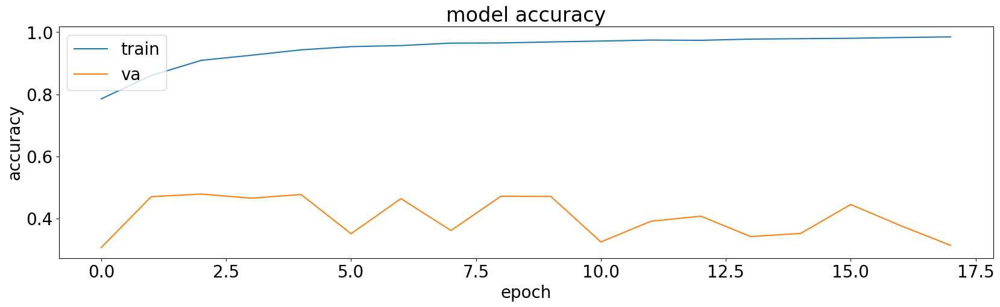

56/56 [==============================] - 2s 24ms/step


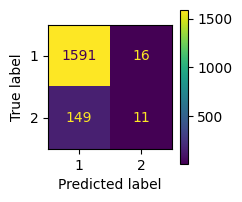

              precision    recall  f1-score   support

           1       0.91      0.99      0.95      1607
           2       0.41      0.07      0.12       160

    accuracy                           0.91      1767
   macro avg       0.66      0.53      0.53      1767
weighted avg       0.87      0.91      0.88      1767

40/40 [==============================] - 1s 21ms/step


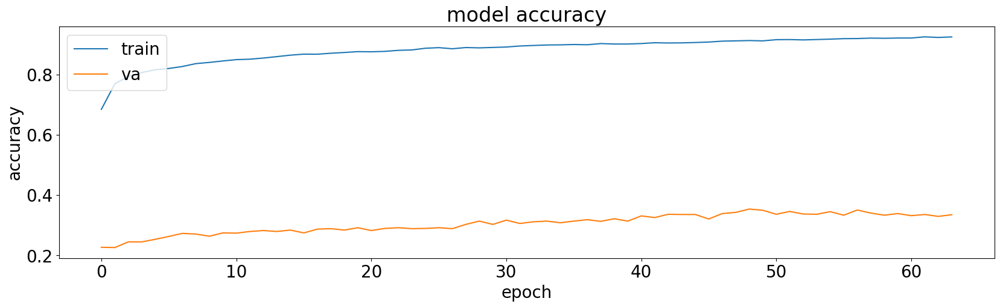

56/56 [==============================] - 1s 7ms/step


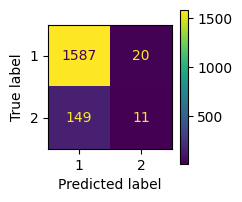

              precision    recall  f1-score   support

           1       0.91      0.99      0.95      1607
           2       0.35      0.07      0.12       160

    accuracy                           0.90      1767
   macro avg       0.63      0.53      0.53      1767
weighted avg       0.86      0.90      0.87      1767

40/40 [==============================] - 0s 8ms/step


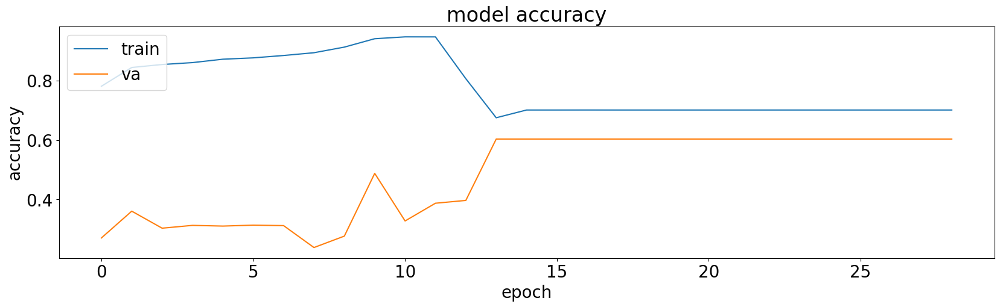

56/56 [==============================] - 1s 10ms/step


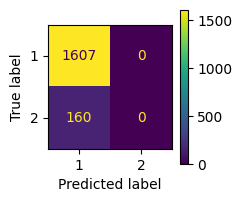

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

12/40 [========>.....................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 0s 10ms/step


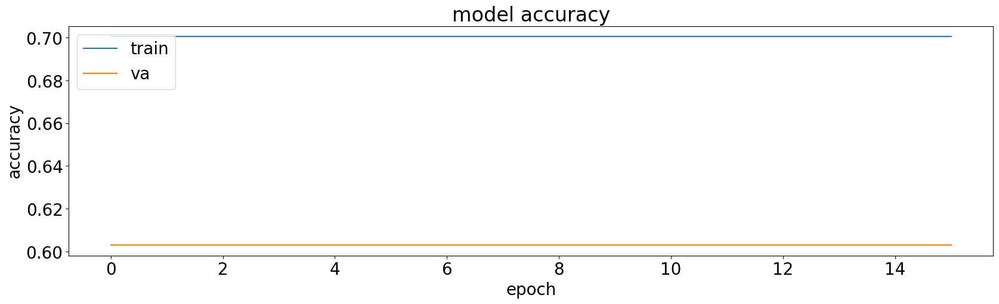

56/56 [==============================] - 2s 22ms/step


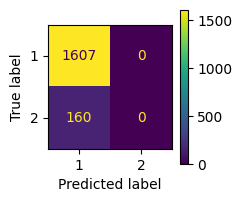

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 4/40 [==>...........................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 20ms/step


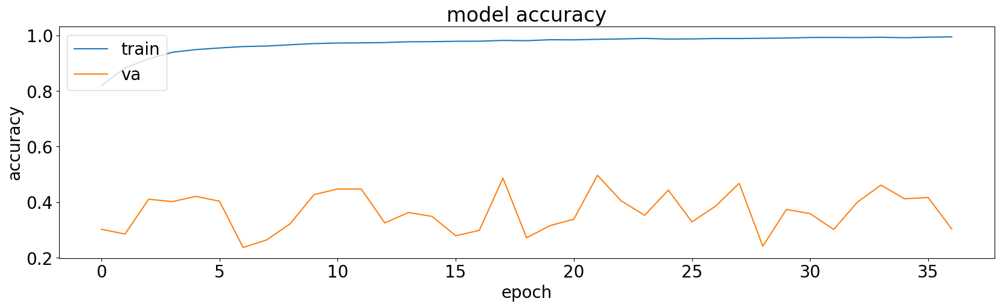

56/56 [==============================] - 2s 24ms/step


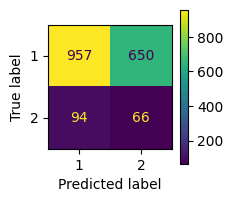

              precision    recall  f1-score   support

           1       0.91      0.60      0.72      1607
           2       0.09      0.41      0.15       160

    accuracy                           0.58      1767
   macro avg       0.50      0.50      0.44      1767
weighted avg       0.84      0.58      0.67      1767

40/40 [==============================] - 1s 22ms/step


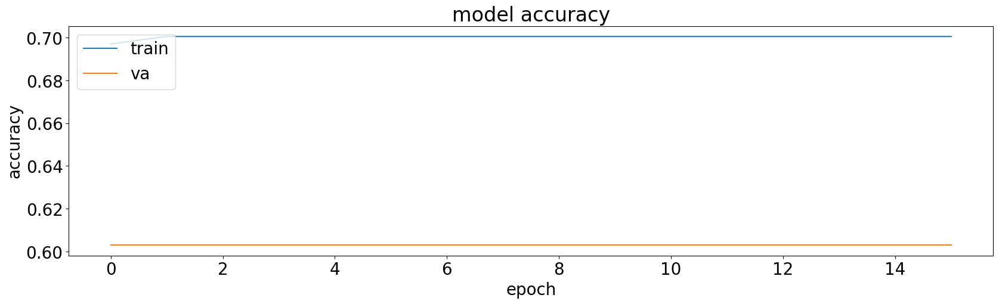

56/56 [==============================] - 2s 22ms/step


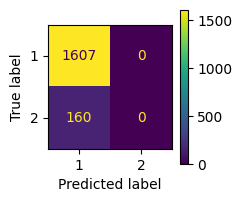

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 7/40 [====>.........................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 20ms/step


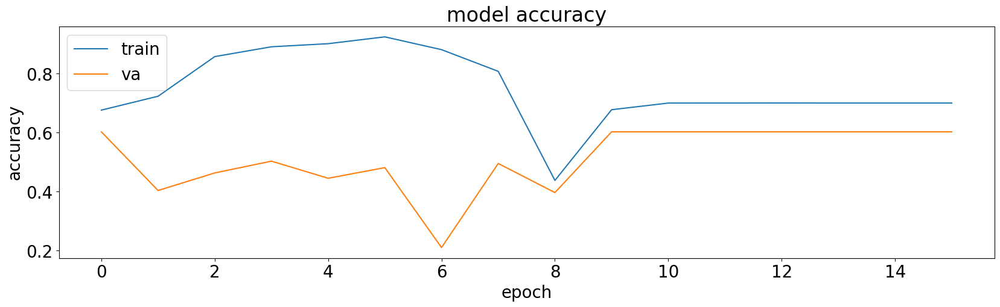

56/56 [==============================] - 1s 10ms/step


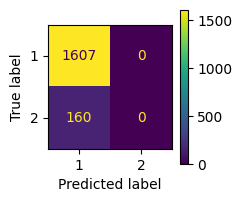

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

13/40 [========>.....................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 0s 10ms/step


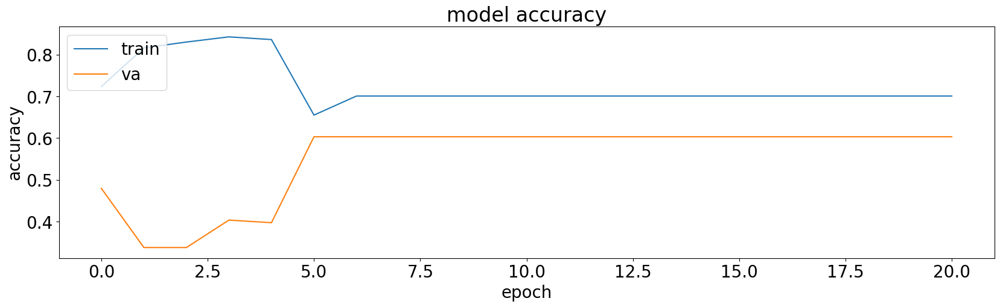

56/56 [==============================] - 1s 10ms/step


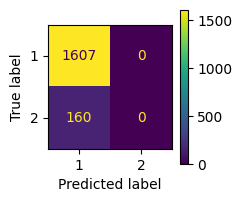

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

12/40 [========>.....................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 0s 10ms/step


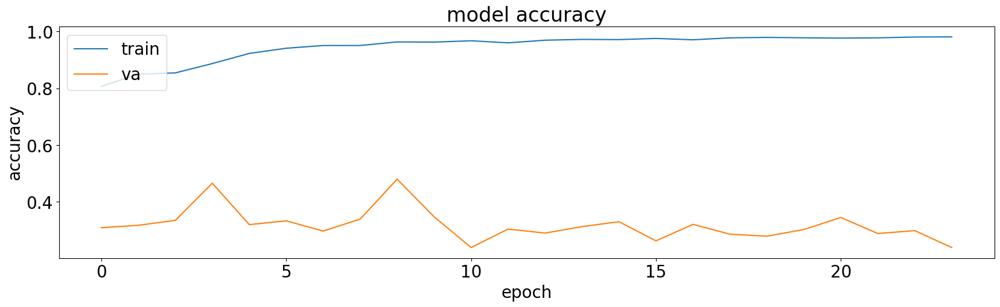

56/56 [==============================] - 2s 26ms/step


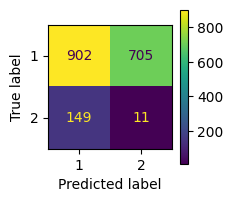

              precision    recall  f1-score   support

           1       0.86      0.56      0.68      1607
           2       0.02      0.07      0.03       160

    accuracy                           0.52      1767
   macro avg       0.44      0.32      0.35      1767
weighted avg       0.78      0.52      0.62      1767

40/40 [==============================] - 1s 23ms/step


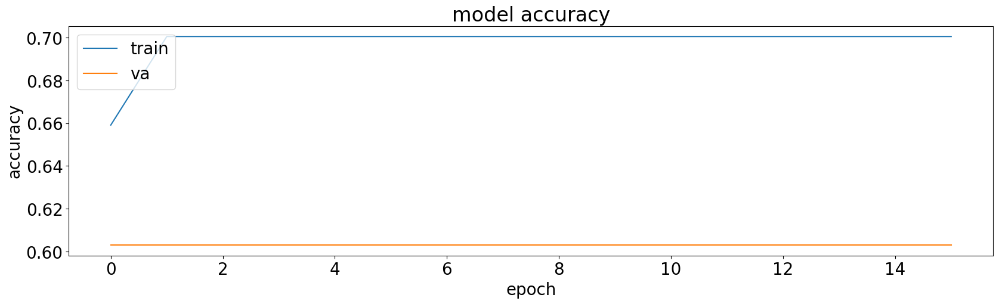

56/56 [==============================] - 1s 9ms/step


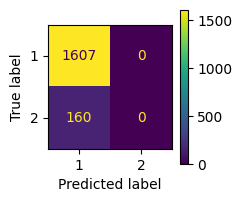

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

13/40 [========>.....................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 0s 8ms/step


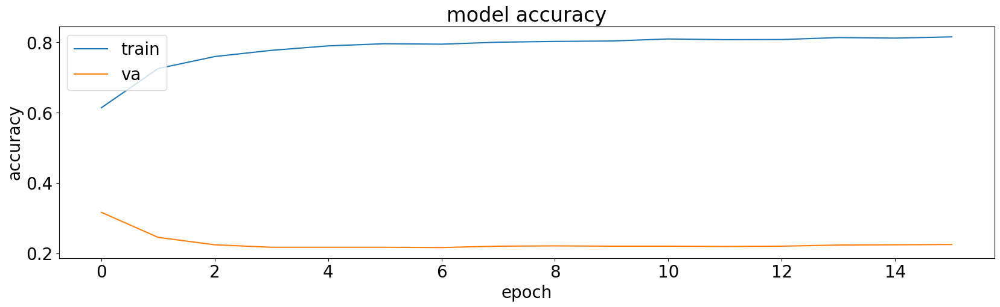

56/56 [==============================] - 1s 14ms/step


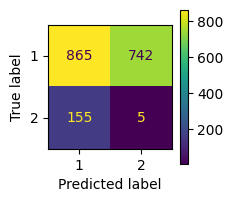

              precision    recall  f1-score   support

           1       0.85      0.54      0.66      1607
           2       0.01      0.03      0.01       160

    accuracy                           0.49      1767
   macro avg       0.43      0.28      0.33      1767
weighted avg       0.77      0.49      0.60      1767

40/40 [==============================] - 1s 14ms/step


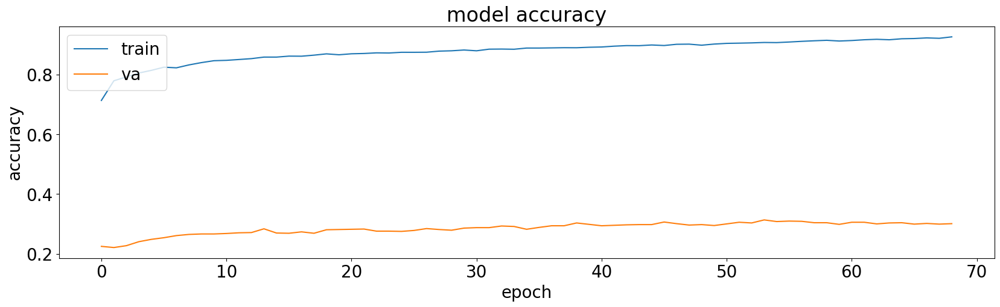

56/56 [==============================] - 1s 13ms/step


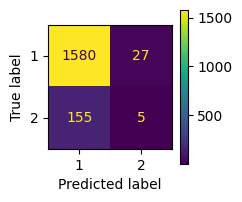

              precision    recall  f1-score   support

           1       0.91      0.98      0.95      1607
           2       0.16      0.03      0.05       160

    accuracy                           0.90      1767
   macro avg       0.53      0.51      0.50      1767
weighted avg       0.84      0.90      0.86      1767

40/40 [==============================] - 1s 14ms/step


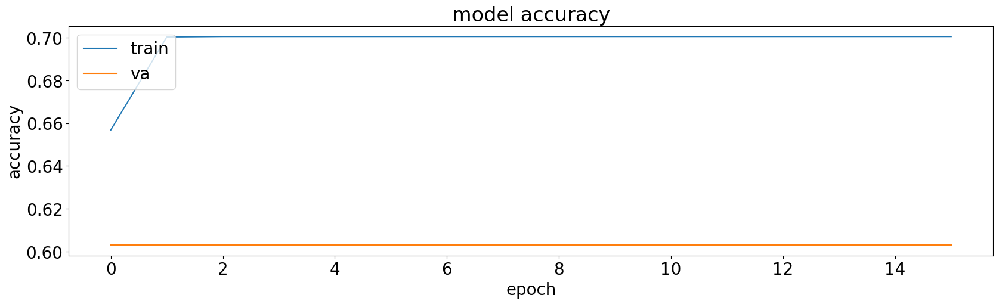

56/56 [==============================] - 1s 8ms/step


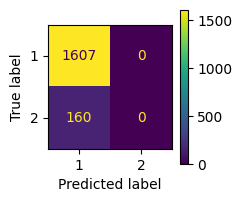

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

14/40 [=========>....................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 0s 8ms/step


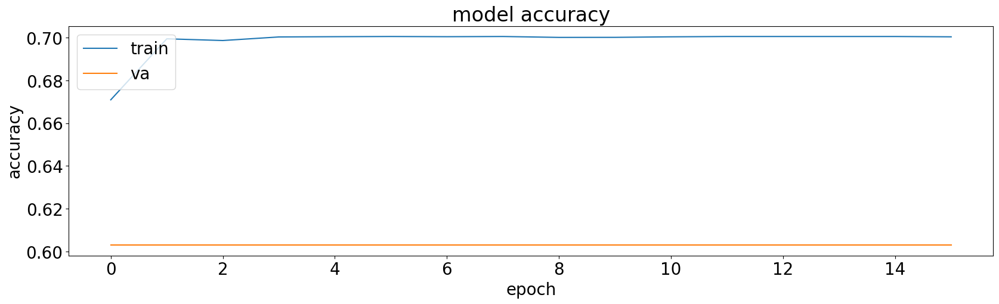

56/56 [==============================] - 1s 10ms/step


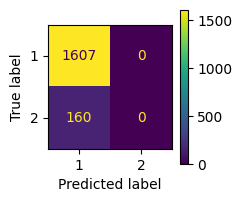

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

13/40 [========>.....................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 0s 10ms/step


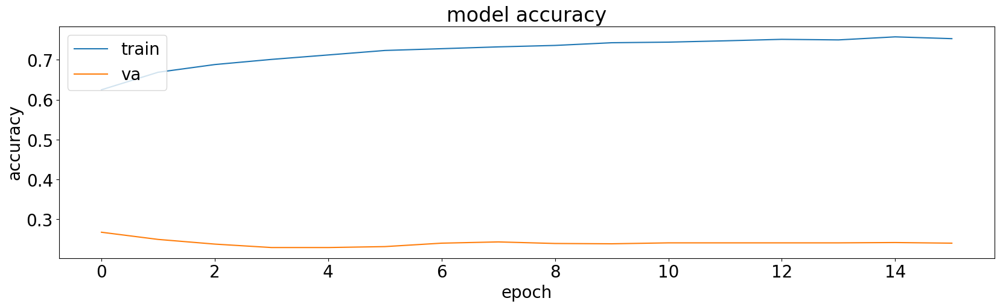

56/56 [==============================] - 2s 21ms/step


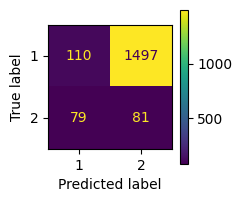

              precision    recall  f1-score   support

           1       0.58      0.07      0.12      1607
           2       0.05      0.51      0.09       160

    accuracy                           0.11      1767
   macro avg       0.32      0.29      0.11      1767
weighted avg       0.53      0.11      0.12      1767

40/40 [==============================] - 1s 21ms/step


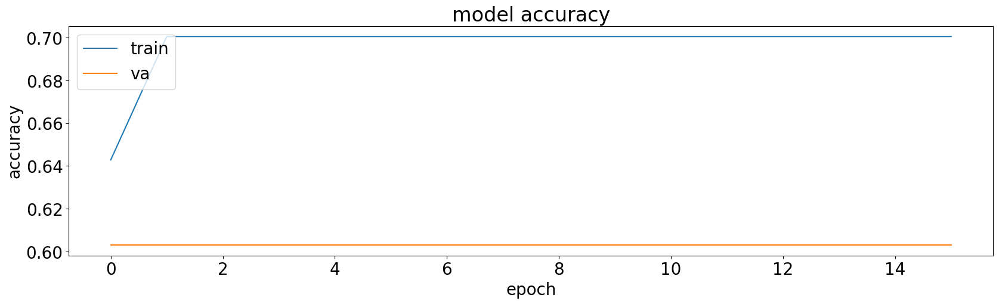

56/56 [==============================] - 3s 30ms/step


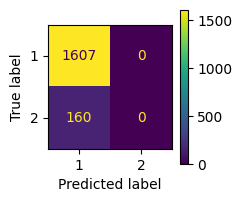

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 5/40 [==>...........................] - ETA: 1s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 28ms/step


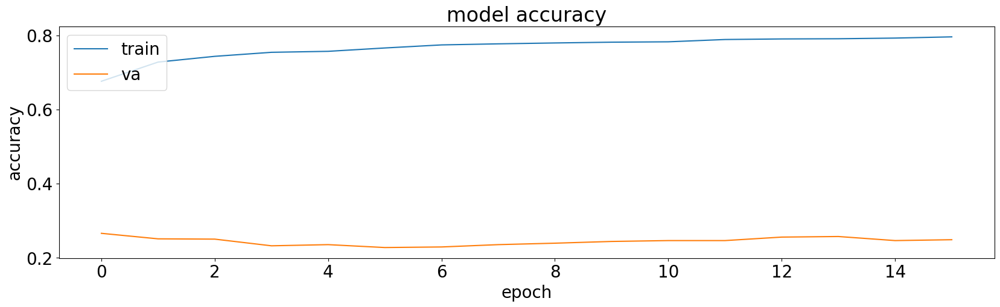

56/56 [==============================] - 2s 24ms/step


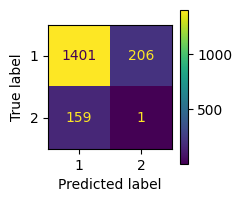

              precision    recall  f1-score   support

           1       0.90      0.87      0.88      1607
           2       0.00      0.01      0.01       160

    accuracy                           0.79      1767
   macro avg       0.45      0.44      0.45      1767
weighted avg       0.82      0.79      0.81      1767

40/40 [==============================] - 1s 21ms/step


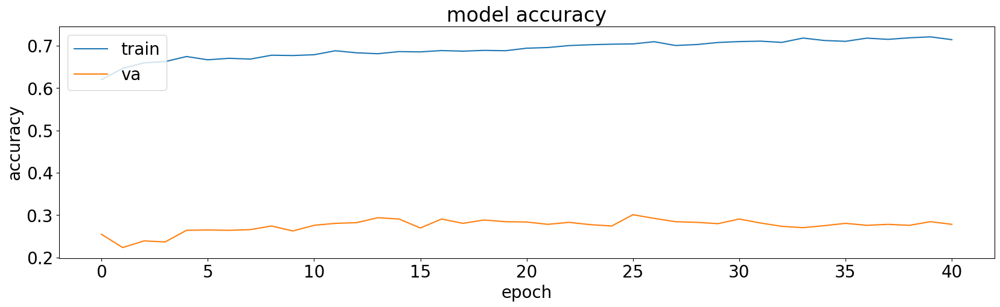

56/56 [==============================] - 3s 34ms/step


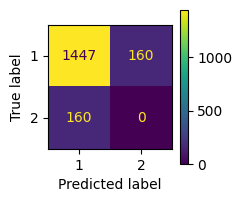

              precision    recall  f1-score   support

           1       0.90      0.90      0.90      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.82      1767
   macro avg       0.45      0.45      0.45      1767
weighted avg       0.82      0.82      0.82      1767

40/40 [==============================] - 1s 32ms/step


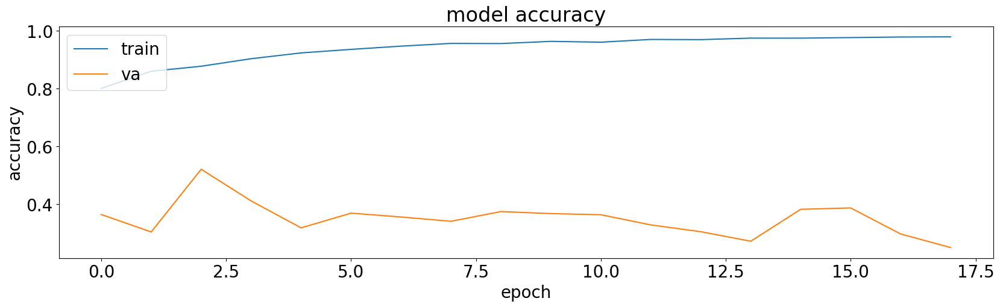

56/56 [==============================] - 1s 14ms/step


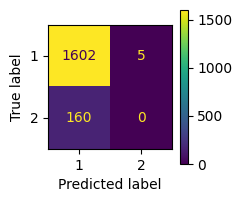

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.86      1767

40/40 [==============================] - 1s 13ms/step


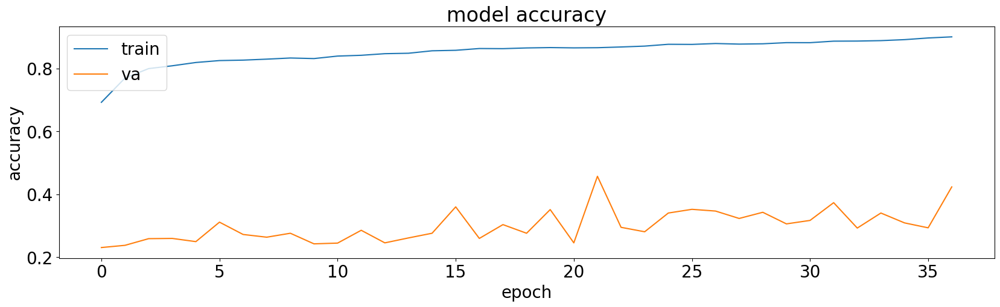

56/56 [==============================] - 2s 25ms/step


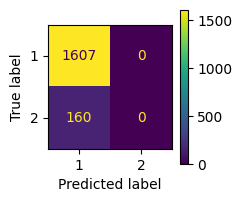

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 4/40 [==>...........................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 24ms/step


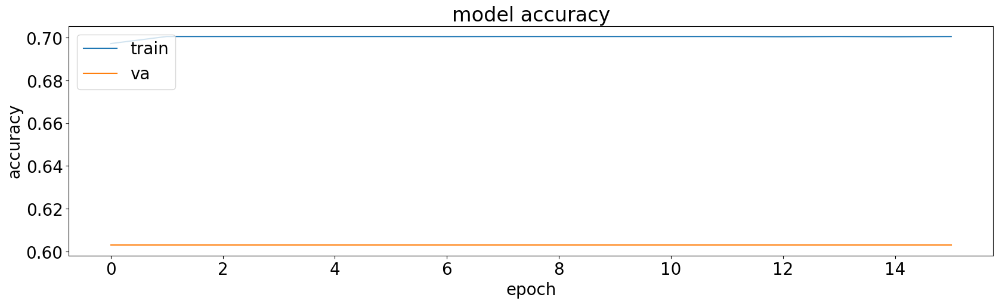

56/56 [==============================] - 2s 22ms/step


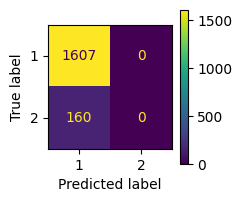

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 7/40 [====>.........................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 20ms/step


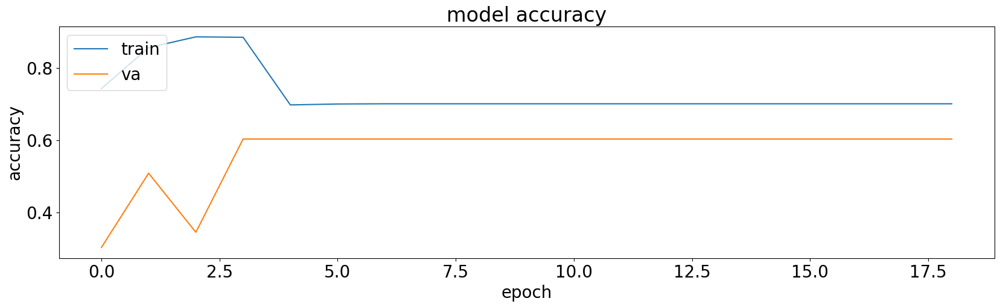

56/56 [==============================] - 1s 10ms/step


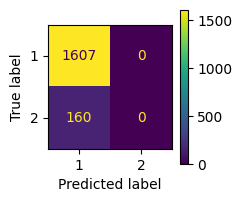

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

13/40 [========>.....................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 0s 10ms/step


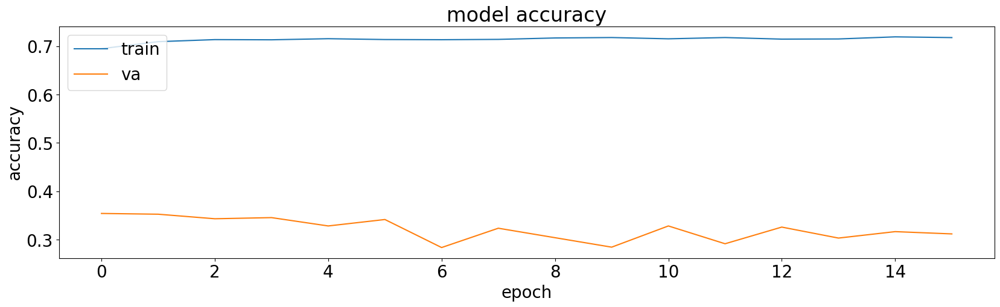

56/56 [==============================] - 3s 42ms/step


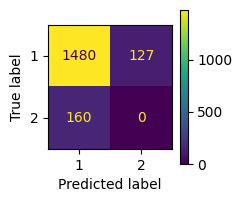

              precision    recall  f1-score   support

           1       0.90      0.92      0.91      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.84      1767
   macro avg       0.45      0.46      0.46      1767
weighted avg       0.82      0.84      0.83      1767

40/40 [==============================] - 2s 40ms/step


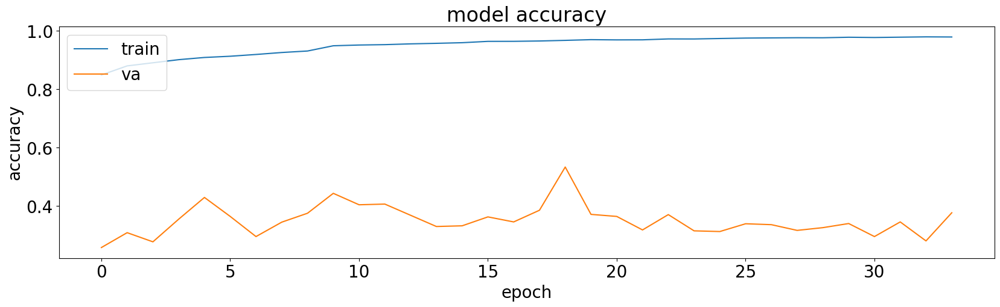

56/56 [==============================] - 4s 47ms/step


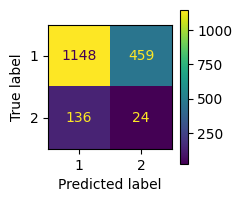

              precision    recall  f1-score   support

           1       0.89      0.71      0.79      1607
           2       0.05      0.15      0.07       160

    accuracy                           0.66      1767
   macro avg       0.47      0.43      0.43      1767
weighted avg       0.82      0.66      0.73      1767

40/40 [==============================] - 2s 46ms/step


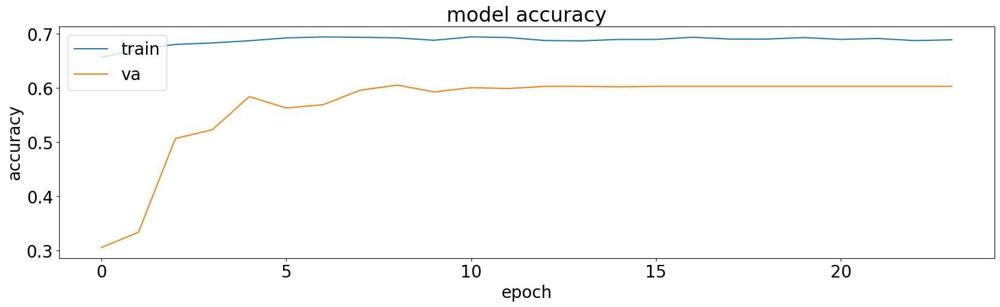

56/56 [==============================] - 4s 51ms/step


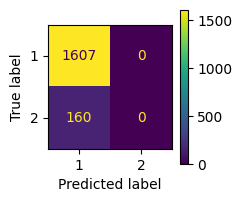

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 2/40 [>.............................] - ETA: 1s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 2s 50ms/step


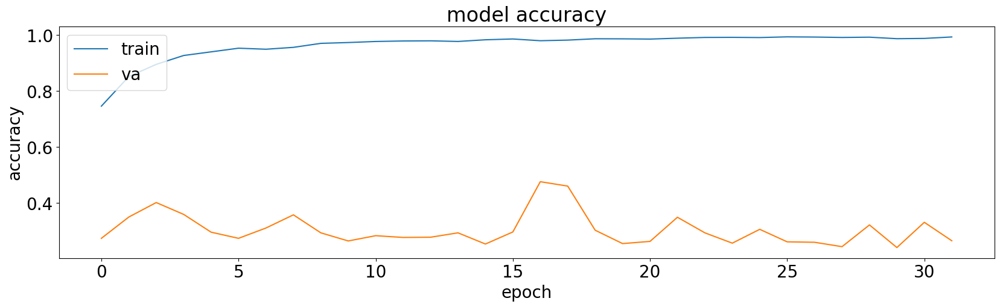

56/56 [==============================] - 1s 10ms/step


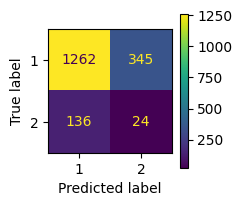

              precision    recall  f1-score   support

           1       0.90      0.79      0.84      1607
           2       0.07      0.15      0.09       160

    accuracy                           0.73      1767
   macro avg       0.48      0.47      0.47      1767
weighted avg       0.83      0.73      0.77      1767

40/40 [==============================] - 0s 10ms/step


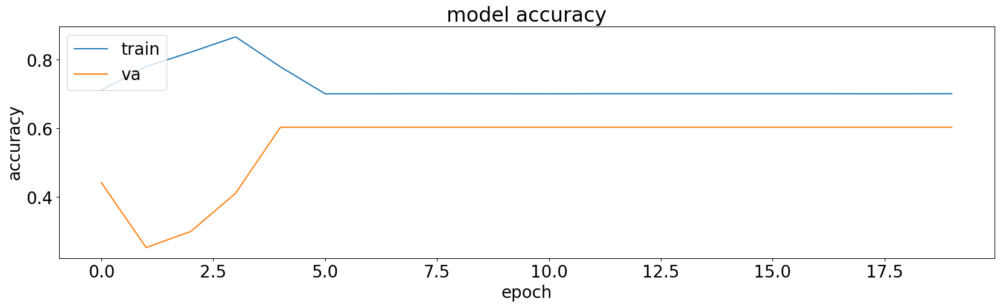

56/56 [==============================] - 1s 10ms/step


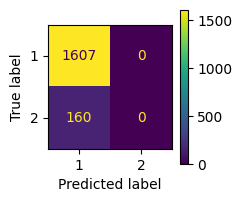

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

13/40 [========>.....................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 0s 10ms/step


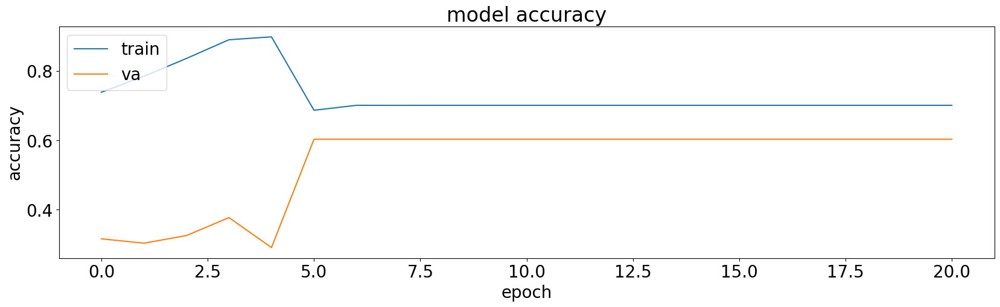

56/56 [==============================] - 1s 10ms/step


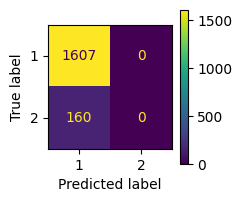

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

13/40 [========>.....................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 0s 10ms/step


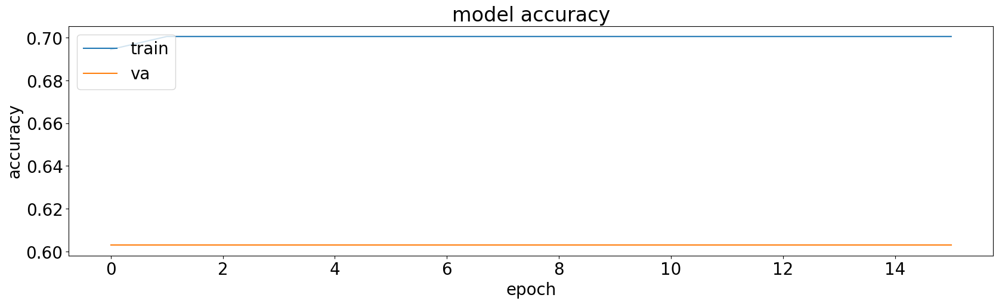

56/56 [==============================] - 2s 26ms/step


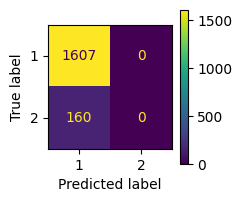

              precision    recall  f1-score   support

           1       0.91      1.00      0.95      1607
           2       0.00      0.00      0.00       160

    accuracy                           0.91      1767
   macro avg       0.45      0.50      0.48      1767
weighted avg       0.83      0.91      0.87      1767

 4/40 [==>...........................] - ETA: 0s

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


40/40 [==============================] - 1s 24ms/step


KeyboardInterrupt: ignored

In [95]:

pbounds = {'lstm_layers': (1, 4),
          'dense_layers': (1, 4),
          'units': (3, 12),
          'neurons_ini': (2, 7),
          'optimizer': (0, 2),
          'batch_size': (6, 9),
          'learning_rate': (0, 2),
          'dropout': (0.3, 0.6)
        }

optimizer = BayesianOptimization(
    f=evaluate_network,
    pbounds=pbounds,
    random_state=1
)

load_logs(optimizer, logs=["./logs.json"])
logger = JSONLogger(path="./logs.json")
optimizer.subscribe(Events.OPTIMIZATION_STEP, logger)
optimizer.maximize(init_points=0, n_iter=211)

In [104]:
run["data"].upload_files("./logs.json")

In [105]:
run.stop()

Shutting down background jobs, please wait a moment...
Done!
All 0 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/gabrie1-s/NACA-data-extraction/e/NAC-26/metadata


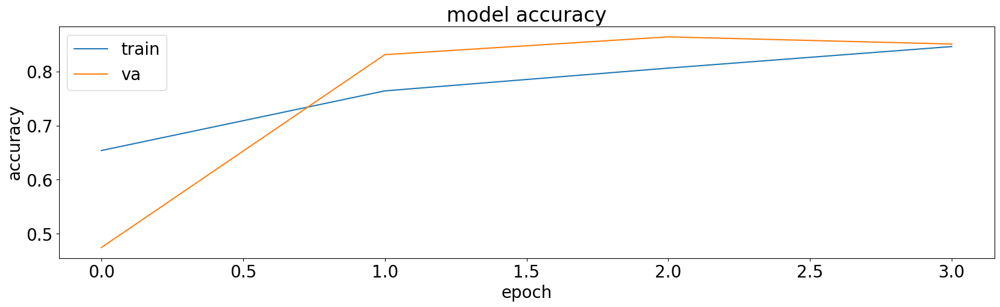

86/86 [==============================] - 2s 14ms/step
> <ipython-input-109-c6396cd0c89e>(52)evaluate_network()
     50 
     51     #plot confusion matrix
---> 52     plt.rcParams['figure.figsize']=(2,2)
     53     plt.rcParams.update({'font.size': 10})
     54 

ipdb> c


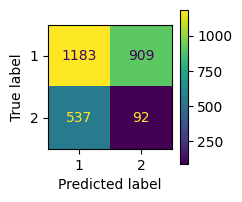

              precision    recall  f1-score   support

           1       0.69      0.57      0.62      2092
           2       0.09      0.15      0.11       629

    accuracy                           0.47      2721
   macro avg       0.39      0.36      0.37      2721
weighted avg       0.55      0.47      0.50      2721

50/50 [==============================] - 1s 17ms/step


In [ ]:
# evaluate_network(batch_size = 6.267, dense_layers = 3.928 , dropout = 0.4027, learning_rate = 0.9463 , lstm_layers = 2.375 , neurons_ini = 5.145,
#                  optimizer = 4.466, units  = 5.031)

#7.174     | 2.517     | 0.5257    | 0.9912    | 1.403     | 6.825     | 0.4284    | 6.115
# evaluate_network(batch_size = 7.174, dense_layers = 2.517 , dropout = 0.5257, learning_rate = 0.9912 , lstm_layers = 1.403 , neurons_ini = 6.825,
#                  optimizer = 0.4284, units  = 6.115)

#  8.67      | 2.654     | 0.5151    | 0.5792    | 1.866     | 6.218     | 4.438     | 4.806
model, _ = evaluate_network(batch_size = 8.67, dense_layers = 2.654 , dropout = 0.5151, learning_rate = 0.5792 , lstm_layers = 1.866 , neurons_ini = 6.218,
                 optimizer = 1, units  = 4.806)

In [ ]:
model = load_model('/content/_melhores_pesos.h5')

41/41 [==============================] - 1s 12ms/step


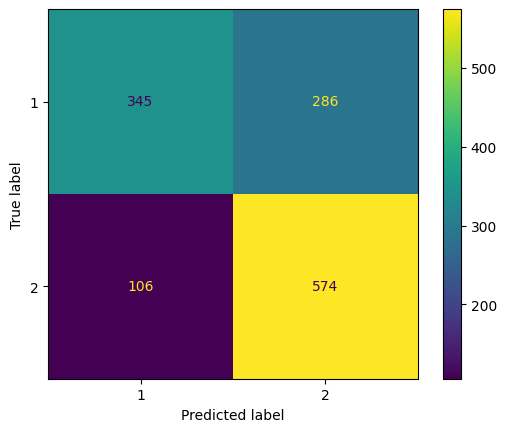

              precision    recall  f1-score   support

           1       0.76      0.55      0.64       631
           2       0.67      0.84      0.75       680

    accuracy                           0.70      1311
   macro avg       0.72      0.70      0.69      1311
weighted avg       0.71      0.70      0.69      1311



In [ ]:
y_pred = model.predict(x_valid)

y_pred = pd.DataFrame(y_pred)
y_pred.columns = [1, 2]
y_pred = y_pred.idxmax(axis=1)

y_te = pd.DataFrame(y_valid)
y_te.columns = [1, 2]
y_te = y_te.idxmax(axis=1)

cf_matrix = confusion_matrix(y_te, y_pred)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = cf_matrix, display_labels = ['1','2'])
cm_display.plot()
plt.show()

relatorio = classification_report(y_te, y_pred, target_names = ['1','2'])
print(relatorio)

In [ ]:
def print_history(history, n):
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('accuracy ' + str(n))
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'valid'], loc='upper left')
    # plt.savefig('plot '+classe+'.png')
    plt.show()

In [ ]:
def generate_report(classificador, x_valid, y_valid, columns):
  y_pred = classificador.predict(x_valid)
  y_pred = pd.DataFrame(y_pred)
  y_pred.columns = columns
  y_pred = y_pred.idxmax(axis=1)

  y_valid = pd.DataFrame(y_valid)
  y_valid.columns = columns
  y_valid = y_valid.idxmax(axis=1)

  relatorio = classification_report(y_valid, y_pred)
  print(relatorio)

In [ ]:
class AdaBoost:

    def __init__(self):
        self.alphas = []
        self.G_M = []
        self.M = None
        self.training_errors = []
        self.prediction_errors = []

    def __not_eq(self, a, b):
      if np.array_equal(a, b):
        return 0
      else:
        return 1

    def __idmax(self, y_pred):
      result = []
      for val in y_pred:
        idx = np.argmax(val)
        aux = np.zeros(len(val))
        aux[idx] = 1
        result.append(aux)

      return np.array(result)

    def __compute_error(self, y, y_pred, w_i):
        error = 0
        for i in range(len(y)):
          error += w_i[i] * self.__not_eq(y[i], y_pred[i])
        error = error/sum(w_i)
        return error

    def __compute_alpha(self, error):
        return np.log((1 - error) / error)

    def __update_weights(self, w_i, alpha, y, y_pred):
        return w_i * np.exp(alpha * (self.__not_eq(y, y_pred)))

    def fit(self, x, y, validation_data=None, M=100, epochs=None, batch_size=None, callbacks=None):

        # Clear before calling
        self.alphas = []
        self.training_errors = []
        self.M = M
        best_acc = []
        best_h = []
        best_G = []

        # Iterate over M weak classifiers
        for m in range(0, M):

            # Set weights for current boosting iteration
            if m == 0:
                w_i = np.ones(len(y)) * 1 / len(y)  # At m = 0, weights are all the same and equal to 1 / N
            else:
                # (d) Update w_i
                w_i = self.__update_weights(w_i, alpha_m, y, y_pred)

            # (a) Fit weak classifier and predict labels

            #G_m = create_cnn(self.optimizer)
            G_m = load_model("_melhores_pesos.h5")


            checkpoint = ModelCheckpoint('_pesos_cnn1d.hdf5', monitor="val_accuracy", verbose=1,
                                      save_best_only=True, mode='max')

            history = G_m.fit(x, y, sample_weight = w_i, validation_data=validation_data,
                    epochs=epochs, batch_size=batch_size, callbacks=[checkpoint, callbacks])

            print_history(history, m)

            G_m = load_model('_pesos_cnn1d.hdf5')

            os.remove('_pesos_cnn1d.hdf5')
            # open('_pesos_cnn1d.hdf5', 'w').close()

            #Calcula a acurácia sobre a validação
            y_pred = G_m.predict(validation_data[0])

            idx = np.argmax(y_pred, axis=-1)
            y_pred = np.zeros( y_pred.shape )
            y_pred[ np.arange(y_pred.shape[0]), idx] = 1

            acc= accuracy_score(validation_data[1], y_pred)

            best_acc.append(acc)
            best_h.append(history)
            best_G.append(G_m)


            # if m == 0 or (acc > best_acc):
            #   best_acc = acc
            #   best_G = G_m
            #   best_h = history

            y_pred = G_m.predict(x)
            y_pred = self.__idmax(y_pred)

            self.G_M.append(G_m) # Save to list of weak classifiers

            # (b) Compute error
            error_m = self.__compute_error(y, y_pred, w_i)
            self.training_errors.append(error_m)

            # (c) Compute alpha
            alpha_m = self.__compute_alpha(error_m)
            self.alphas.append(alpha_m)

        assert len(self.G_M) == len(self.alphas)

        return best_G, best_h, best_acc

    def predict(self, x):

        # Initialise dataframe with weak predictions for each observation
        weak_preds = pd.DataFrame(index = range(len(x)), columns = range(self.M))

        # Predict class label for each weak classifier, weighted by alpha_m
        for m in range(self.M):
            y_pred_m = self.G_M[m].predict(x) * self.alphas[m]
            for i in range(weak_preds.shape[0]):
              weak_preds.iloc[i,m] = y_pred_m[i]

        # Calculate final predictions
        y_pred = weak_preds.T.sum()
        y_pred =  self.__idmax(y_pred)

        return y_pred

In [ ]:
columns = y_train.columns

Int64Index([1, 2], dtype='int64')
Epoch 1/100
153/153 [==============================] - ETA: 0s - loss: 6.1252e-05 - accuracy: 0.8527
Epoch 1: val_accuracy improved from -inf to 0.69489, saving model to _pesos_cnn1d.hdf5
153/153 [==============================] - 10s 42ms/step - loss: 6.1252e-05 - accuracy: 0.8527 - val_loss: 9.8031 - val_accuracy: 0.6949
Epoch 2/100
153/153 [==============================] - ETA: 0s - loss: 5.9450e-05 - accuracy: 0.8487
Epoch 2: val_accuracy improved from 0.69489 to 0.69565, saving model to _pesos_cnn1d.hdf5
153/153 [==============================] - 4s 27ms/step - loss: 5.9450e-05 - accuracy: 0.8487 - val_loss: 9.7227 - val_accuracy: 0.6957
Epoch 3/100
153/153 [==============================] - ETA: 0s - loss: 5.7843e-05 - accuracy: 0.8473
Epoch 3: val_accuracy improved from 0.69565 to 0.69641, saving model to _pesos_cnn1d.hdf5
153/153 [==============================] - 5s 29ms/step - loss: 5.7843e-05 - accuracy: 0.8473 - val_loss: 9.6372 - val_accu

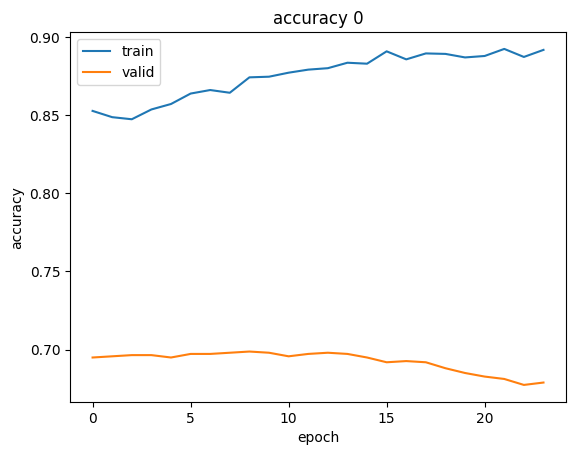

305/305 [==============================] - 3s 9ms/step
Epoch 1/100
152/153 [============================>.] - ETA: 0s - loss: 6.1498e-04 - accuracy: 0.8605
Epoch 1: val_accuracy improved from -inf to 0.69641, saving model to _pesos_cnn1d.hdf5
153/153 [==============================] - 8s 32ms/step - loss: 6.1472e-04 - accuracy: 0.8606 - val_loss: 9.2461 - val_accuracy: 0.6964
Epoch 2/100
153/153 [==============================] - ETA: 0s - loss: 4.4679e-04 - accuracy: 0.8759
Epoch 2: val_accuracy improved from 0.69641 to 0.69718, saving model to _pesos_cnn1d.hdf5
153/153 [==============================] - 4s 26ms/step - loss: 4.4679e-04 - accuracy: 0.8759 - val_loss: 8.9011 - val_accuracy: 0.6972
Epoch 3/100
151/153 [============================>.] - ETA: 0s - loss: 3.9998e-04 - accuracy: 0.8813
Epoch 3: val_accuracy did not improve from 0.69718
153/153 [==============================] - 4s 24ms/step - loss: 3.9946e-04 - accuracy: 0.8814 - val_loss: 8.6757 - val_accuracy: 0.6972
Epoch 

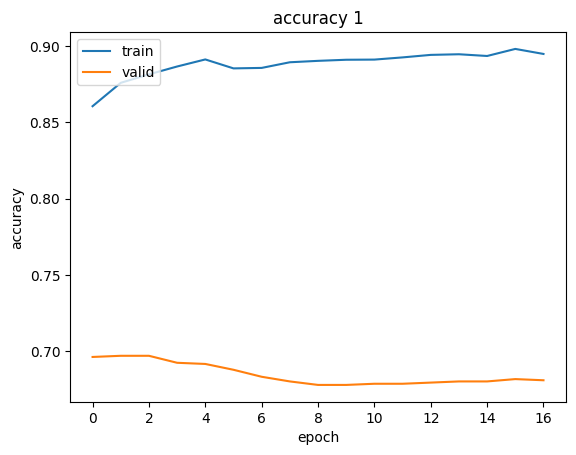

305/305 [==============================] - 3s 9ms/step
Epoch 1/100
153/153 [==============================] - ETA: 0s - loss: 0.0047 - accuracy: 0.8852
Epoch 1: val_accuracy improved from -inf to 0.68726, saving model to _pesos_cnn1d.hdf5
153/153 [==============================] - 8s 31ms/step - loss: 0.0047 - accuracy: 0.8852 - val_loss: 8.4606 - val_accuracy: 0.6873
Epoch 2/100
151/153 [============================>.] - ETA: 0s - loss: 0.0042 - accuracy: 0.8916
Epoch 2: val_accuracy did not improve from 0.68726
153/153 [==============================] - 4s 25ms/step - loss: 0.0042 - accuracy: 0.8914 - val_loss: 8.3860 - val_accuracy: 0.6827
Epoch 3/100
153/153 [==============================] - ETA: 0s - loss: 0.0042 - accuracy: 0.8915
Epoch 3: val_accuracy did not improve from 0.68726
153/153 [==============================] - 4s 25ms/step - loss: 0.0042 - accuracy: 0.8915 - val_loss: 8.6301 - val_accuracy: 0.6812
Epoch 4/100
151/153 [============================>.] - ETA: 0s - loss

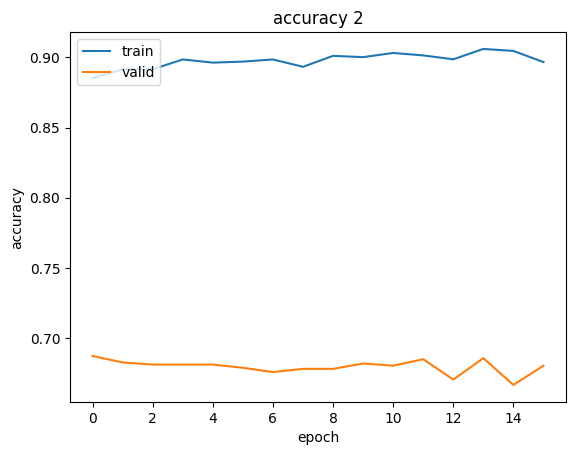

305/305 [==============================] - 3s 9ms/step
Epoch 1/100
152/153 [============================>.] - ETA: 0s - loss: 0.0779 - accuracy: 0.8829
Epoch 1: val_accuracy improved from -inf to 0.65675, saving model to _pesos_cnn1d.hdf5
153/153 [==============================] - 8s 32ms/step - loss: 0.0779 - accuracy: 0.8830 - val_loss: 11.0110 - val_accuracy: 0.6568
Epoch 2/100
153/153 [==============================] - ETA: 0s - loss: 0.0699 - accuracy: 0.8973
Epoch 2: val_accuracy did not improve from 0.65675
153/153 [==============================] - 4s 24ms/step - loss: 0.0699 - accuracy: 0.8973 - val_loss: 10.7927 - val_accuracy: 0.6552
Epoch 3/100
151/153 [============================>.] - ETA: 0s - loss: 0.0682 - accuracy: 0.8997
Epoch 3: val_accuracy did not improve from 0.65675
153/153 [==============================] - 4s 25ms/step - loss: 0.0681 - accuracy: 0.8999 - val_loss: 11.9805 - val_accuracy: 0.6323
Epoch 4/100
151/153 [============================>.] - ETA: 0s - l

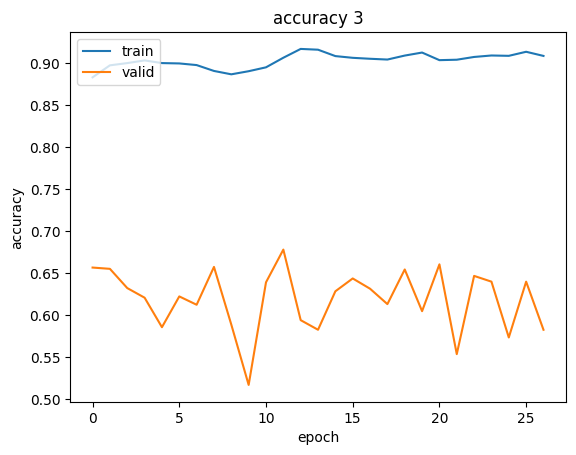

305/305 [==============================] - 3s 9ms/step
Epoch 1/100
153/153 [==============================] - ETA: 0s - loss: 2.2255 - accuracy: 0.8441
Epoch 1: val_accuracy improved from -inf to 0.60717, saving model to _pesos_cnn1d.hdf5
153/153 [==============================] - 8s 33ms/step - loss: 2.2255 - accuracy: 0.8441 - val_loss: 11.3540 - val_accuracy: 0.6072
Epoch 2/100
153/153 [==============================] - ETA: 0s - loss: 1.8491 - accuracy: 0.8801
Epoch 2: val_accuracy did not improve from 0.60717
153/153 [==============================] - 4s 24ms/step - loss: 1.8491 - accuracy: 0.8801 - val_loss: 5.9118 - val_accuracy: 0.4378
Epoch 3/100
151/153 [============================>.] - ETA: 0s - loss: 1.7555 - accuracy: 0.8891
Epoch 3: val_accuracy did not improve from 0.60717
153/153 [==============================] - 4s 24ms/step - loss: 1.7555 - accuracy: 0.8890 - val_loss: 11.2611 - val_accuracy: 0.5545
Epoch 4/100
151/153 [============================>.] - ETA: 0s - lo

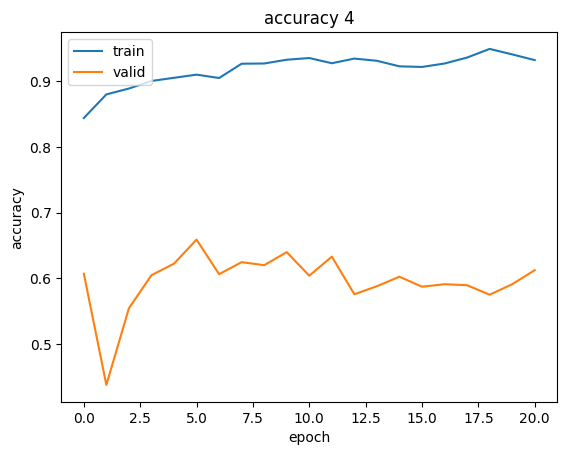

305/305 [==============================] - 3s 8ms/step
Epoch 1/100
153/153 [==============================] - ETA: 0s - loss: 51.7973 - accuracy: 0.8613
Epoch 1: val_accuracy improved from -inf to 0.57818, saving model to _pesos_cnn1d.hdf5
153/153 [==============================] - 9s 32ms/step - loss: 51.7973 - accuracy: 0.8613 - val_loss: 6.0708 - val_accuracy: 0.5782
Epoch 2/100
152/153 [============================>.] - ETA: 0s - loss: 42.7188 - accuracy: 0.8917
Epoch 2: val_accuracy improved from 0.57818 to 0.60564, saving model to _pesos_cnn1d.hdf5
153/153 [==============================] - 4s 26ms/step - loss: 42.7276 - accuracy: 0.8916 - val_loss: 12.2220 - val_accuracy: 0.6056
Epoch 3/100
151/153 [============================>.] - ETA: 0s - loss: 39.8173 - accuracy: 0.9016
Epoch 3: val_accuracy did not improve from 0.60564
153/153 [==============================] - 4s 24ms/step - loss: 39.8258 - accuracy: 0.9016 - val_loss: 13.3571 - val_accuracy: 0.5988
Epoch 4/100
151/153 [=

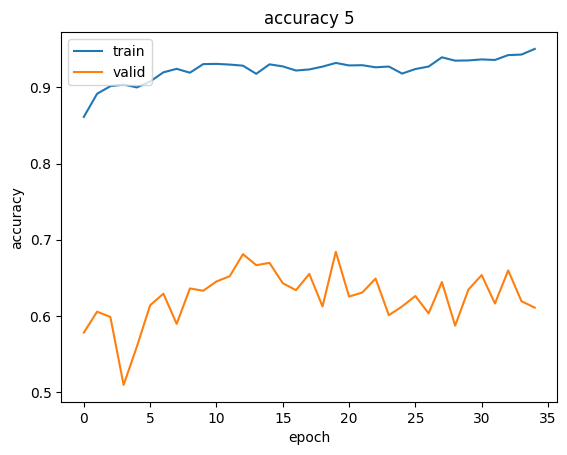

305/305 [==============================] - 3s 9ms/step
Epoch 1/100
151/153 [============================>.] - ETA: 0s - loss: 1540.4756 - accuracy: 0.8263
Epoch 1: val_accuracy improved from -inf to 0.47445, saving model to _pesos_cnn1d.hdf5
153/153 [==============================] - 8s 32ms/step - loss: 1536.9744 - accuracy: 0.8268 - val_loss: 3.4962 - val_accuracy: 0.4744
Epoch 2/100
152/153 [============================>.] - ETA: 0s - loss: 1118.2933 - accuracy: 0.8807
Epoch 2: val_accuracy improved from 0.47445 to 0.60488, saving model to _pesos_cnn1d.hdf5
153/153 [==============================] - 4s 26ms/step - loss: 1117.9331 - accuracy: 0.8807 - val_loss: 6.3317 - val_accuracy: 0.6049
Epoch 3/100
151/153 [============================>.] - ETA: 0s - loss: 946.5332 - accuracy: 0.9029
Epoch 3: val_accuracy did not improve from 0.60488
153/153 [==============================] - 4s 24ms/step - loss: 944.0914 - accuracy: 0.9033 - val_loss: 12.9617 - val_accuracy: 0.5843
Epoch 4/100
1

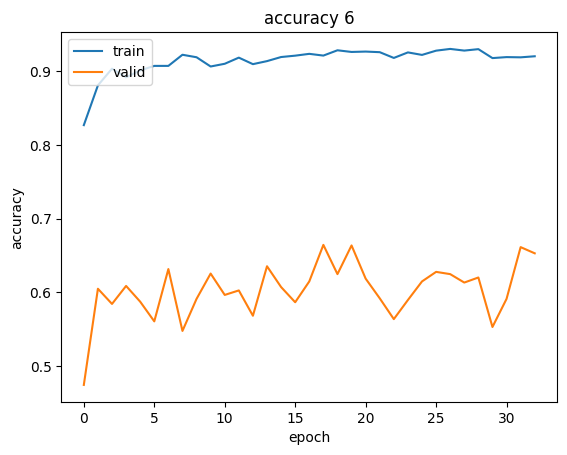

305/305 [==============================] - 3s 9ms/step
Epoch 1/100
151/153 [============================>.] - ETA: 0s - loss: 31329.2246 - accuracy: 0.8343
Epoch 1: val_accuracy improved from -inf to 0.65599, saving model to _pesos_cnn1d.hdf5
153/153 [==============================] - 9s 35ms/step - loss: 31303.8848 - accuracy: 0.8343 - val_loss: 2.6849 - val_accuracy: 0.6560
Epoch 2/100
151/153 [============================>.] - ETA: 0s - loss: 25355.1738 - accuracy: 0.8763
Epoch 2: val_accuracy did not improve from 0.65599
153/153 [==============================] - 4s 24ms/step - loss: 25336.6328 - accuracy: 0.8765 - val_loss: 7.3251 - val_accuracy: 0.6095
Epoch 3/100
153/153 [==============================] - ETA: 0s - loss: 22621.1270 - accuracy: 0.8935
Epoch 3: val_accuracy did not improve from 0.65599
153/153 [==============================] - 4s 24ms/step - loss: 22621.1270 - accuracy: 0.8935 - val_loss: 10.1466 - val_accuracy: 0.6262
Epoch 4/100
153/153 [=======================

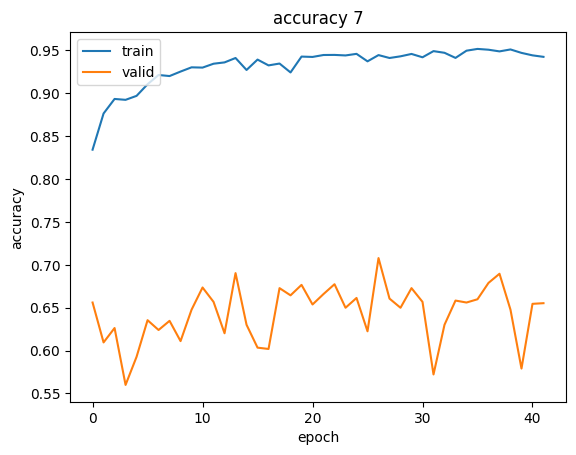

305/305 [==============================] - 3s 9ms/step
Epoch 1/100
151/153 [============================>.] - ETA: 0s - loss: 2219774.5000 - accuracy: 0.8346
Epoch 1: val_accuracy improved from -inf to 0.54233, saving model to _pesos_cnn1d.hdf5
153/153 [==============================] - 8s 32ms/step - loss: 2213069.7500 - accuracy: 0.8354 - val_loss: 6.4163 - val_accuracy: 0.5423
Epoch 2/100
151/153 [============================>.] - ETA: 0s - loss: 1865534.2500 - accuracy: 0.8671
Epoch 2: val_accuracy improved from 0.54233 to 0.54844, saving model to _pesos_cnn1d.hdf5
153/153 [==============================] - 4s 24ms/step - loss: 1863535.5000 - accuracy: 0.8673 - val_loss: 6.2213 - val_accuracy: 0.5484
Epoch 3/100
152/153 [============================>.] - ETA: 0s - loss: 1760170.0000 - accuracy: 0.8775
Epoch 3: val_accuracy did not improve from 0.54844
153/153 [==============================] - 4s 25ms/step - loss: 1762082.3750 - accuracy: 0.8772 - val_loss: 9.6309 - val_accuracy: 0

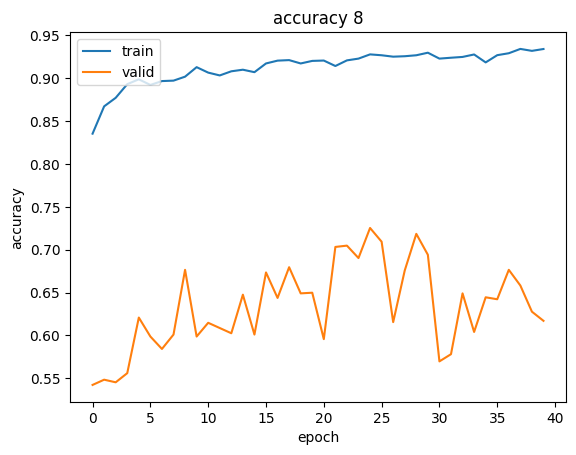

305/305 [==============================] - 3s 9ms/step
Epoch 1/100
153/153 [==============================] - ETA: 0s - loss: 51584852.0000 - accuracy: 0.8436
Epoch 1: val_accuracy improved from -inf to 0.55683, saving model to _pesos_cnn1d.hdf5
153/153 [==============================] - 8s 33ms/step - loss: 51584852.0000 - accuracy: 0.8436 - val_loss: 6.6119 - val_accuracy: 0.5568
Epoch 2/100
153/153 [==============================] - ETA: 0s - loss: 44891872.0000 - accuracy: 0.8717
Epoch 2: val_accuracy improved from 0.55683 to 0.65141, saving model to _pesos_cnn1d.hdf5
153/153 [==============================] - 4s 26ms/step - loss: 44891872.0000 - accuracy: 0.8717 - val_loss: 7.7660 - val_accuracy: 0.6514
Epoch 3/100
153/153 [==============================] - ETA: 0s - loss: 39797072.0000 - accuracy: 0.8875
Epoch 3: val_accuracy did not improve from 0.65141
153/153 [==============================] - 4s 24ms/step - loss: 39797072.0000 - accuracy: 0.8875 - val_loss: 6.5584 - val_accur

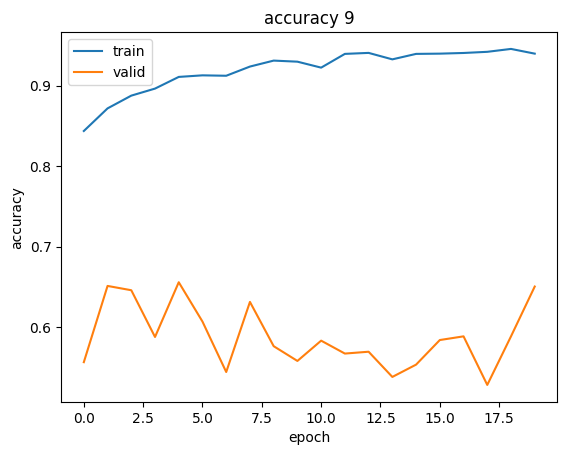

41/41 [==============================] - 0s 9ms/step
              precision    recall  f1-score   support

           1       0.81      0.54      0.65       631
           2       0.67      0.88      0.76       680

    accuracy                           0.72      1311
   macro avg       0.74      0.71      0.71      1311
weighted avg       0.74      0.72      0.71      1311



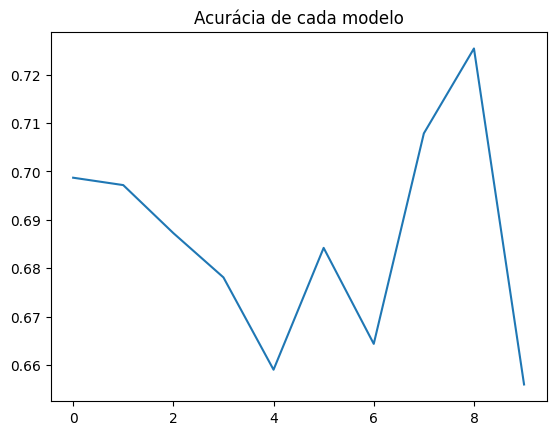

In [ ]:
y_train = np.array(y_train, dtype=int)
y_valid = np.array(y_valid, dtype=int)

print(columns)

# checkpoint = ModelCheckpoint('_pesos_cnn1d.hdf5', monitor="val_accuracy", verbose=1,
#                                     save_best_only=True, mode='max')

es = EarlyStopping(monitor="val_accuracy", mode='max', verbose=0, patience=15)

adaboost = AdaBoost()

best_G, best_h, best_acc = adaboost.fit(x_train, y_train, validation_data = (x_valid, y_valid),
                     M=10, epochs=100, batch_size=64, callbacks=es)

generate_report(adaboost, x_valid, y_valid, columns)

plt.plot(best_acc)
plt.title("Acurácia de cada modelo")
plt.show()


In [ ]:
def eq_w(model1, model2):
  model1_weights = [layer.get_weights() for layer in model1.layers]
  model2_weights = [layer.get_weights() for layer in model2.layers]

  for (w1, w2) in zip(model1_weights, model2_weights):
      if not all(np.array_equal(x, y) for (x, y) in zip(w1, w2)):
          print("The models have different weights.")
          break
  else:
      print("The models have the same weights.")


In [ ]:
eq_w(best_G[0], best_G[1])

The models have different weights.


41/41 [==============================] - 0s 10ms/step


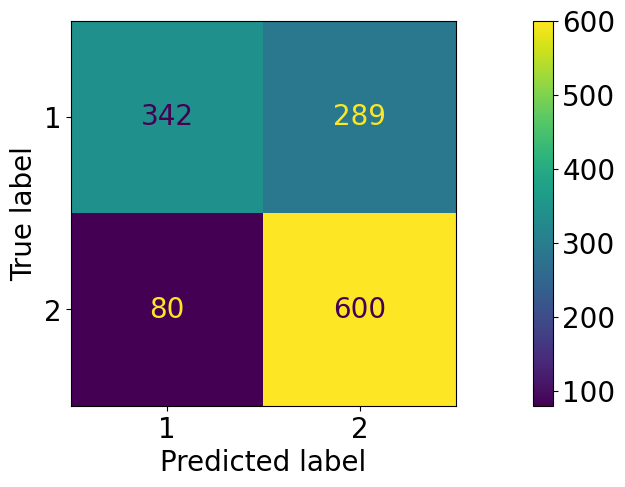

              precision    recall  f1-score   support

           1       0.81      0.54      0.65       631
           2       0.67      0.88      0.76       680

    accuracy                           0.72      1311
   macro avg       0.74      0.71      0.71      1311
weighted avg       0.74      0.72      0.71      1311



In [ ]:
y_pred = adaboost.predict(x_valid)
y_pred = pd.DataFrame(y_pred)
y_pred.columns = ['1', '2']
y_pred = y_pred.idxmax(axis=1)
y_te = pd.DataFrame(y_valid)
y_te.columns = ['1', '2']
y_te = y_te.idxmax(axis=1)

plt.rcParams['figure.figsize']=(20,5)
plt.rcParams.update({'font.size': 20})

cf_matrix = confusion_matrix(y_te, y_pred)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = cf_matrix, display_labels = ['1','2'])
cm_display.plot()
plt.show()

relatorio = classification_report(y_te, y_pred, target_names = ['1','2'])
print(relatorio)

69/69 [==============================] - 1s 8ms/step


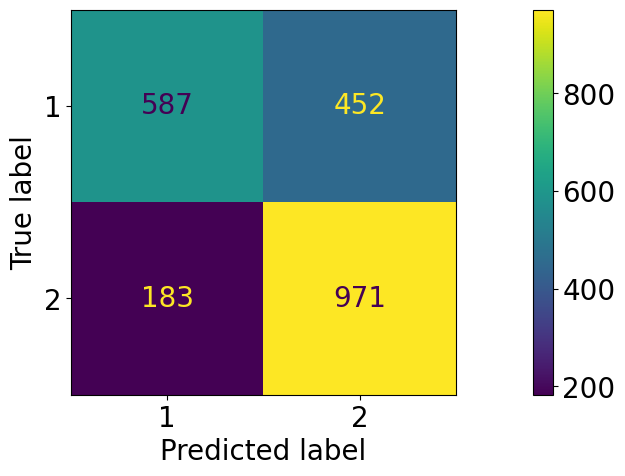

              precision    recall  f1-score   support

           1       0.76      0.56      0.65      1039
           2       0.68      0.84      0.75      1154

    accuracy                           0.71      2193
   macro avg       0.72      0.70      0.70      2193
weighted avg       0.72      0.71      0.70      2193



In [ ]:
y_pred = adaboost.predict(x_test)
y_pred = pd.DataFrame(y_pred)
y_pred.columns = ['1', '2']
y_pred = y_pred.idxmax(axis=1)
y_te = pd.DataFrame(y_test)
y_te.columns = ['1', '2']
y_te = y_te.idxmax(axis=1)

plt.rcParams['figure.figsize']=(20,5)
plt.rcParams.update({'font.size': 20})

cf_matrix = confusion_matrix(y_te, y_pred)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = cf_matrix, display_labels = ['1','2'])
cm_display.plot()
plt.show()

relatorio = classification_report(y_te, y_pred, target_names = ['1','2'])
print(relatorio)

In [ ]:
# |   iter    |  target   | batch_... | dense_... |  dropout  | learni... | lstm_l... | neuron... | optimizer |   units
# | 36        | 0.73      | 8.489     | 3.39      | 0.4147    | 0.6446    | 3.537     | 6.876     | 3.949     | 3.693
# | 108       | 0.701     | 6.267     | 3.928     | 0.4027    | 0.9463    | 2.375     | 5.145     | 4.466     | 5.031
# evaluate_network(batch_size = 8.489, dense_layers = 3.39, dropout = 0.4147, learning_rate = 0.6446, lstm_layers = 3.537, neurons_ini = 6.876,
#                  optimizer = 3.949, units  = 3.693)

# evaluate_network(batch_size = 6.267, dense_layers = 3.928 , dropout = 0.4027, learning_rate = 0.9463 , lstm_layers = 2.375 , neurons_ini = 5.145,
#                  optimizer = 4.466, units  = 5.031)

In [ ]:
model = load_model('/content/_melhores_pesos.h5')

In [ ]:
for i,signal in enumerate(raw_x_test):
  s, _ = split_beats([signal], [raw_y_test[i]], bps)
  raw_x_test[i] = norm_len_2(s, lim)

### Usando a moda

In [ ]:
y_pred = []
for signal in raw_x_test:

  prediction = model.predict(np.array(signal))
  prediction = pd.DataFrame(prediction)
  prediction.columns = [1,2]
  prediction = prediction.idxmax(axis=1)
  val = prediction.mode()[0]
  y_pred.append(val)

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn import metrics

plt.rcParams['figure.figsize']=(2,2)
plt.rcParams.update({'font.size': 10})

cf_matrix = confusion_matrix(y_test, y_pred)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = cf_matrix, display_labels = ['1','2'])
cm_display.plot()

In [ ]:
from sklearn.metrics import classification_report

relatorio = classification_report(y_test, y_pred, target_names = ['1','2'])
print(relatorio)

### Usando a soma das probabilidades

In [ ]:
y_pred = []
for signal in raw_x_test:

  prediction = model.predict(np.array(signal))
  prediction = np.sum(prediction, axis=0)
  prediction = pd.DataFrame([prediction])
  prediction.columns = [1,2]
  val = prediction.idxmax(axis=1)[0]
  y_pred.append(val)

In [ ]:
y_pred

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn import metrics

plt.rcParams['figure.figsize']=(2,2)
plt.rcParams.update({'font.size': 10})

cf_matrix = confusion_matrix(y_test, y_pred)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = cf_matrix, display_labels = ['1','2'])
cm_display.plot()

In [ ]:
from sklearn.metrics import classification_report

relatorio = classification_report(y_test, y_pred, target_names = ['1','2'])
print(relatorio)